## IMPORTS

In [1]:
# basic imports

import torch
from torch import nn, utils
from torch.utils.data import Dataset, ConcatDataset, TensorDataset, DataLoader
import torch.nn.functional as F
from torchvision import models, datasets, transforms

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import pandas as pd
from tqdm import tqdm
import os

from IPython.display import display, clear_output

# Para curriculum learning
import cv2
from sklearn.neighbors import NearestNeighbors
from skimage.feature import hog
from scipy.stats import entropy
from typing import List, Tuple, Dict, Optional
from functools import lru_cache

device = 'cuda' if torch.cuda.is_available() else 'cpu'

## VISUALIZATION

In [2]:
### usual helpers for logging and visualisation:

class TrainingMetrics:
    def __init__(self):
        # initialise with empty lists for metric tracking:
        self.train_loss = []
        self.val_loss = []
        self.train_acc = []
        self.val_acc = []

        self.stability_loss = [] # for LwF

        self.step = 0
        self.epoch = 0
        self.epoch_steps = [0] # assume validation happens after every epoch
        self.iter_steps = [0] # steps at which training iteration changes

        # for plotting:
        self.fig = None
        self.plot_axes = None

    def next_iteration(self):
        """increment the continual learning iteration"""
        self.iter_steps.append(self.step)
    
    def log_train(self, loss:float, acc:float, stability_loss:float=None):
        """record batch-wise training metrics at each step (and increment step).
        Optionally, include stability loss as well for visualising LwF training."""
        assert isinstance(loss, float) and isinstance(acc, float), f"log_train expects float inputs but got: {type(loss)} and {type(acc)}"
        self.train_loss.append(loss)
        self.train_acc.append(acc)

        if stability_loss is not None:
            self.stability_loss.append(stability_loss)

        self.step += 1

    def log_val(self, loss:float, acc:float):
        """record total val metrics at end of epoch (and increment epoch)"""
        assert isinstance(loss, float) and isinstance(acc, float), f"log_val expects float inputs but got: {type(loss)} and {type(acc)}"
        self.val_loss.append(loss)
        self.val_acc.append(acc)

        if len(self.train_loss) == 0:
            self.step += 1 # increment step if no training data has been logged
        else:
            assert self.step not in self.epoch_steps, f"Validation metrics already logged for epoch {self.epoch} - you should submit only the aggregate metrics at end of epoch"""            
        self.epoch_steps.append(self.step)
        self.epoch += 1

    @property
    def epoch_loss(self):
        """report the training and validation loss over the previous epoch"""
        cur_epoch_step = self.epoch_steps[-1]
        last_epoch_step = self.epoch_steps[-2]
        epoch_train_loss = self.train_loss[last_epoch_step:cur_epoch_step]
        epoch_val_loss = self.val_loss[-1]
        return np.mean(epoch_train_loss), np.mean(epoch_val_loss)

    @property        
    def epoch_acc(self):
        """report the training and validation accuracy over the previous epoch"""
        cur_epoch_step = self.epoch_steps[-1]
        last_epoch_step = self.epoch_steps[-2]
        epoch_train_acc = self.train_acc[last_epoch_step:cur_epoch_step]
        epoch_val_acc = self.val_acc[-1]
        return np.mean(epoch_train_acc), np.mean(epoch_val_acc)

    @property
    def best_val_acc(self):
        return np.max(self.val_acc)


    def plot(self,
             title:str = None, # optional figure title
             baseline_accs: dict[str:float] = None, # optional dict of name->accuracy baseline benchmarks
             baseline_metrics = None, # optional metrics object for comparison curves
             alpha=0.1, # smoothing parameter for train loss
             live=True, # for animated plotting during training (slightly experimental)
             max_step=0, # should be set to the expected number of steps for animated plots
             show_iterations=True, # whether to display separated lines for CL iterations
             ):
        if (self.fig is None) or (not live):
            self.fig, self.plot_axes = plt.subplots(1,2)
        loss_ax, acc_ax = self.plot_axes
        
        all_steps = np.arange(0, self.step)

        num_iters = len(self.iter_steps)-1 if show_iterations else 1

        loss_ax.clear()
        acc_ax.clear()
        for i in range(num_iters):
            step_start = self.iter_steps[i]
            step_end = self.iter_steps[i+1] if (i+1 < num_iters) else self.step

            x_step = np.arange(step_start, step_end)
            train_loss = self.train_loss[step_start:step_end]
            train_acc = self.train_acc[step_start:step_end]

            # include stability loss as a separate term
            if len(self.stability_loss) > 0:
                stability_loss = self.stability_loss[step_start:step_end]
            else:
                stability_loss = None

            epoch_steps_this_iter = [s for s in self.epoch_steps[1:] if step_start < s <= step_end]
            epoch_idxs_this_iter = [i for i,s in enumerate(self.epoch_steps[1:]) if step_start < s <= step_end]

            val_loss = [self.val_loss[i] for i in epoch_idxs_this_iter]
            val_acc = [self.val_acc[i] for i in epoch_idxs_this_iter]
            
            # smooth out the per-step training numbers for neater curves:
            smooth_train_loss = pd.Series(train_loss).ewm(alpha=alpha).mean()
            smooth_train_acc = pd.Series(train_acc).ewm(alpha=alpha).mean()
    
            # plot train loss at every step:
            loss_ax.plot(x_step, smooth_train_loss, c='tab:orange', linestyle=':', label='train loss' if i==0 else None)

            # and stability loss if given:
            if stability_loss is not None:
                smooth_stab_loss = pd.Series(stability_loss).ewm(alpha=alpha).mean()
                loss_ax.plot(x_step, smooth_stab_loss, c='tab:green', linestyle=':', label='stability loss' if i==0 else None)
  
            # val loss is plotted at every epoch:
            loss_ax.plot(epoch_steps_this_iter, val_loss, c='tab:orange', linestyle='-', label='val loss' if i==0 else None)
    
    
            ### plot acc:
            if len(self.train_acc) > 0:
                acc_ax.plot(x_step, smooth_train_acc, c='tab:blue', linestyle=':', label='train acc' if i==0 else None)
            acc_ax.plot(epoch_steps_this_iter, val_acc, c='tab:blue', linestyle='-', label='val acc' if i==0 else None)
     
        
        if baseline_metrics is not None:
            # optionally show the training curves of a previous metric object as baseline
            # (by extracting the line data from the plots saved to that object)
            baseline_num_iters = len(baseline_metrics.iter_steps)-1
            num_base_lines = baseline_num_iters * 2
            
            assert len(baseline_metrics.stability_loss) == 0, "cannot plot a baseline with stability loss, it's too complicated sorry"
            baseline_train_xs = [baseline_metrics.plot_axes[0].lines[i].get_xdata() for i in range(0, num_base_lines, 2)]
            baseline_train_losses = [baseline_metrics.plot_axes[0].lines[i].get_ydata() for i in range(0, num_base_lines, 2)]
            baseline_val_xs = [baseline_metrics.plot_axes[0].lines[i].get_xdata() for i in range(1, num_base_lines, 2)]
            baseline_val_losses = [baseline_metrics.plot_axes[0].lines[i].get_ydata() for i in range(1, num_base_lines, 2)]
            baseline_train_accs = [baseline_metrics.plot_axes[1].lines[i].get_ydata() for i in range(0, num_base_lines, 2)]
            baseline_val_accs = [baseline_metrics.plot_axes[1].lines[i].get_ydata() for i in range(1, num_base_lines, 2)]

            for base_tx, base_tloss, base_tacc in zip(baseline_train_xs, baseline_train_losses, baseline_train_accs):
                loss_ax.plot(base_tx, base_tloss, c='lightgray', linestyle=':', label=None, zorder=-1)
                acc_ax.plot(base_tx, base_tacc, c='lightgray', linestyle=':', label=None, zorder=-1)
            for base_vx, base_vloss, base_vacc in zip(baseline_val_xs, baseline_val_losses, baseline_val_accs):
                loss_ax.plot(base_vx, base_vloss, c='lightgray', linestyle=':', label=None, zorder=-1)
                acc_ax.plot(base_vx, base_vacc, c='lightgray', linestyle=':', label=None, zorder=-1)
            baseline_end_step = max(base_tx)
        else:
            baseline_end_step = 0

        # format y-axis as percentage on right:
        acc_ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1.0))
        acc_ax.yaxis.tick_right()
        acc_ax.yaxis.set_label_position('right')
    
        # draw line/s for comparison with baseline if given:
        if baseline_accs is not None:
            for b_name, b_acc in baseline_accs.items():
                acc_ax.axhline(b_acc, c=[0.8]*3, linestyle=':')
                # add text label as well:
                acc_ax.text(0, b_acc+0.003, b_name, c=[0.6]*3, size=8)

        # draw lines to demarcate CL iterations:
        if len(self.iter_steps) > 0:
            iter_steps = self.iter_steps if baseline_metrics is None else baseline_metrics.iter_steps
            for iter_step in iter_steps:
                loss_ax.axvline(iter_step, c=[0.8]*3, linestyle='--')
                acc_ax.axvline(iter_step, c=[0.8]*3, linestyle='--')
                
        # add epoch tick markers and legend:
        end_step = max(max_step, self.step) #, baseline_end_step)
        
        num_epochs = len(self.epoch_steps)
        if num_epochs > 1:
            num_expected_epochs = end_step // self.epoch_steps[1]
            tick_spacing = max(num_expected_epochs // 10, 1)
        else:
            tick_spacing = 1
            num_expected_epochs = 1
        loss_ax.set_xticks(self.epoch_steps[::tick_spacing], range(0, num_epochs, tick_spacing))
        loss_ax.tick_params(axis='both', which='minor', labelsize=6)
        loss_ax.set_xlabel('Epoch')
        loss_ax.set_ylabel('Loss')
        loss_ax.legend(); 
        
        # set x lims based on max number of steps
        loss_ax.set_xlim([0-(end_step*0.05), end_step*1.05])
        acc_ax.set_xlim([0-(end_step*0.05), end_step*1.05])
        acc_ax.set_xticks(self.epoch_steps[::tick_spacing], range(0, num_epochs, tick_spacing))
        acc_ax.tick_params(axis='both', which='minor', labelsize=6)
        
        acc_ax.set_xlabel('Epoch')
        acc_ax.set_ylabel('Accuracy (%)')
        acc_ax.legend()
        
        # and y lims based on the expectation that loss goes down and acc goes up
        loss_ax.set_ylim([-0.05, None])
        acc_ax.set_ylim([-0.05, 1.05])

        self.fig.suptitle(title)
        plt.tight_layout()

        if live:
            # redraw using ipython display
            clear_output(wait=True)
            display(self.fig)
        else:
            # just show plot normally
            plt.show()

### function to verify the contents and labels of a dataset object:
def inspect_dataset(dataset: Dataset,
                    layout=(4,4), # rows and cols of the grid to display
                    scale=0.7, 
                   ):
    """accepts a Dataset object
    and plots images from the data with optional class annotations"""
    num_examples = min([np.prod(layout), len(dataset)])
    example_idxs = np.random.choice(range(len(dataset)), num_examples, replace=False)

    if hasattr(dataset, 'data'):
        images = dataset.data
    else:
        images = dataset.tensors[0]

    if hasattr(dataset, 'targets'):
        targets = dataset.targets
    else:
        targets = dataset.tensors[1]
    
    images = [images[idx] for idx in example_idxs]
    targets = [targets[idx] for idx in example_idxs]


    if hasattr(dataset, 'name'):
        title = f'Dataset: {dataset.name}'
    else:
        title = None
    
    a = 0
    num_rows, num_cols = layout
    fig_width = 2 * scale * num_cols
    fig_height = 2.3 * scale * num_rows + ((title is not None) * 0.3)
    fig, axes = plt.subplots(num_rows, num_cols, squeeze=False, figsize=(fig_width, fig_height))
    
    for r, row in enumerate(axes):
        for c, ax in enumerate(row):
            img = images[a]

            # if is tensor, cast to numpy:
            if isinstance(img, torch.Tensor):
                img = img.detach().cpu().numpy()
            
            # if is CHW, reshape to HWC:
            if img.shape[0] == 3:
                img = img.transpose([1,2,0])
                cmap = None
            else:
                cmap = 'Greys' # use black-and-white colourmap for mono images

            # unnormalise:
            if img.min() < 0:
                img = (img - img.min()) / (img.max() - img.min())
            
            ax.imshow(img, cmap=cmap)
            
            label = f'{targets[a]}: {dataset.classes[targets[a]]}'
            ax.set_title(label, fontsize=10*scale**0.5)
            
            # tidy up axis:
            ax.axes.get_xaxis().set_ticks([])
            ax.axes.get_yaxis().set_ticks([])
            a += 1

    fig.suptitle(title)
    fig.tight_layout()
    
    plt.show()        


### function for inspecting the correctness of the outputs of a model:
def inspect_batch(images: torch.Tensor, # batch of images as torch tensors
        labels: torch.Tensor=None,      # optional vector of ground truth label integers
        predictions: torch.Tensor=None, # optional vector/matrix of model predictions
        # display parameters:
        class_names: list[str]=None, # optional list or dict of class idxs to class name strings
        title: str=None,       # optional title for entire plot    
        # figure display/sizing params:
        center_title=True,
        max_to_show=25,
        num_cols = 5,
        scale=0.7,
        ):
    """accepts a batch of images as a torch tensor or list of tensors,
    and plots them in a grid for manual inspection.
    optionally, you can supply ground truth labels
    and/or model predictions, to display those as well."""

    if type(images) is tuple:
        raise Exception('Expected first input as torch.Tensor, but got tuple; make sure to pass images and labels separately!')
    
    max_to_show = min([max_to_show, len(images)]) # cap at number of images
    
    num_rows = int(np.ceil(max_to_show / num_cols))

    # add extra figure height if needed for captions:
    extra_height = (((labels is not None)*0.3 + (predictions is not None))*0.3)

    fig_width = 2 * scale * num_cols
    fig_height = (2+extra_height) * scale * num_rows + ((title is not None) * 0.3)
    
    fig, axes = plt.subplots(num_rows, num_cols, squeeze=False, figsize=(fig_width, fig_height))
    all_axes = []
    for ax_row in axes:
        all_axes.extend(ax_row)

    # translate labels and predictions to class names if given:
    if class_names is not None:
        if labels is not None:
            labels = [f'{l}:{class_names[int(l)]}' for l in labels]
        if predictions is not None:
            if len(predictions.shape) == 2:
                # probability distribution or onehot vector, so argmax it:
                predictions = predictions.argmax(dim=1)
            predictions = [f'{p}:{class_names[int(p)]}' for p in predictions]
    
    for b, ax in enumerate(all_axes):
        if b < max_to_show:
            # rearrange to H*W*C:
            img = images[b].permute([1,2,0]) 
            # un-normalise:
            img = (img - img.min()) / (img.max() - img.min())
            # to numpy:
            img = img.cpu().detach().numpy()
            
            ax.imshow(img, cmap='Greys' if img.shape[2] == 1 else None)
            ax.axes.get_xaxis().set_ticks([])
            ax.axes.get_yaxis().set_ticks([])

            if labels is not None:                    
                ax.set_title(f'{labels[b]}', fontsize=10*scale**0.5)
            if predictions is not None:
                ax.set_title(f'pred: {predictions[b]}', fontsize=10*scale**0.5)
            if labels is not None and predictions is not None:
                if labels[b] == predictions[b]:
                    ### matching prediction, mark as correct:
                    mark, color = '✔', 'green'
                else:
                    mark, color = '✘', 'red'
                
                ax.set_title(f'label:{labels[b]}    \npred:{predictions[b]} {mark}', color=color, fontsize=8*scale**0.5)
        else:
            ax.axis('off')
    if title is not None:
        if center_title:
            x, align = 0.5, 'center'
        else:
            x, align = 0, 'left'
        fig.suptitle(title, fontsize=14*scale**0.5, x=x, horizontalalignment=align)
    fig.tight_layout()
    plt.show()


def count_labels(dataset):
    """Print out a count of the individual classes in a classification dataset.
    If there are more than 10, show only the first and last 10."""
    assert dataset.classes is not None
    targets = dataset.targets
    label_counts = np.unique(targets, return_counts=True)[1]
    

    num_classes = len(dataset.classes)
    max_len = max([len(cl) for cl in dataset.classes])
    if isinstance(dataset.classes, dict):
        idxs, names = dataset.classes.keys(), dataset.classes.values()
    elif isinstance(dataset.classes, list):
        idxs, names = range(num_classes), dataset.classes

    if num_classes > 10:
        # show only the first 10
        show_idxs = list(range(5)) + list(range(num_classes))[-5:]
    else:
        show_idxs = list(range(num_classes))

    print(f'\n{dataset.name}: {len(dataset):,} samples')
    for idx, name in zip(idxs, names):
        num_samples = label_counts[idx]
        if idx in show_idxs:
            print(f'  {idx}: {name:<{max_len}} ({num_samples:,} samples)')
        elif idx == 5:
            print('  ...')
            


### class prediction accuracy:
def top1_acc(pred: torch.FloatTensor, 
             y: torch.LongTensor):
    """calculates accuracy over a batch as a float
    given predicted logits 'pred' and integer targets 'y'"""
    return (pred.argmax(axis=1) == y).float().mean().item()  


## Data

For our dataset, we'll use [Fashion-MNIST](https://www.kaggle.com/datasets/zalando-research/fashionmnist). This is a 10-way classification dataset on different types of clothing garments.

It has similar properties to the classic MNIST data - the same image resolution, number of classes and examples per class - but is a bit less trivial, so requires a slightly higher-capacity model that learns some more subtle features.

Below, we download the dataset and display some examples from it.


Fashion-MNIST: 60,000 samples
  0: T-shirt/top (6,000 samples)
  1: Trouser     (6,000 samples)
  2: Pullover    (6,000 samples)
  3: Dress       (6,000 samples)
  4: Coat        (6,000 samples)
  5: Sandal      (6,000 samples)
  6: Shirt       (6,000 samples)
  7: Sneaker     (6,000 samples)
  8: Bag         (6,000 samples)
  9: Ankle boot  (6,000 samples)


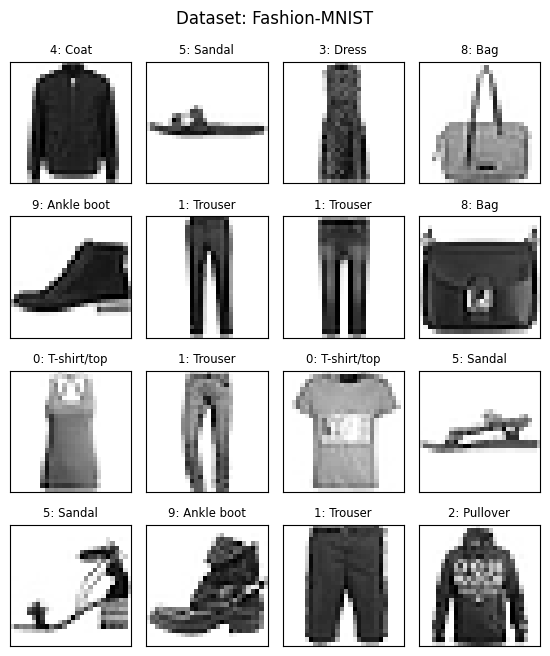


CIFAR-10: 50,000 samples
  0: airplane   (5,000 samples)
  1: automobile (5,000 samples)
  2: bird       (5,000 samples)
  3: cat        (5,000 samples)
  4: deer       (5,000 samples)
  5: dog        (5,000 samples)
  6: frog       (5,000 samples)
  7: horse      (5,000 samples)
  8: ship       (5,000 samples)
  9: truck      (5,000 samples)


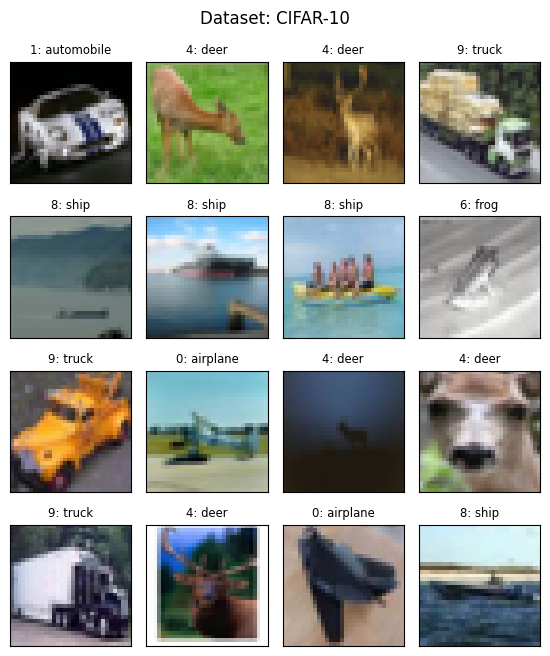


Cifar-100: 50,000 samples
  0: apple         (500 samples)
  1: aquarium_fish (500 samples)
  2: baby          (500 samples)
  3: bear          (500 samples)
  4: beaver        (500 samples)
  ...
  95: whale         (500 samples)
  96: willow_tree   (500 samples)
  97: wolf          (500 samples)
  98: woman         (500 samples)
  99: worm          (500 samples)


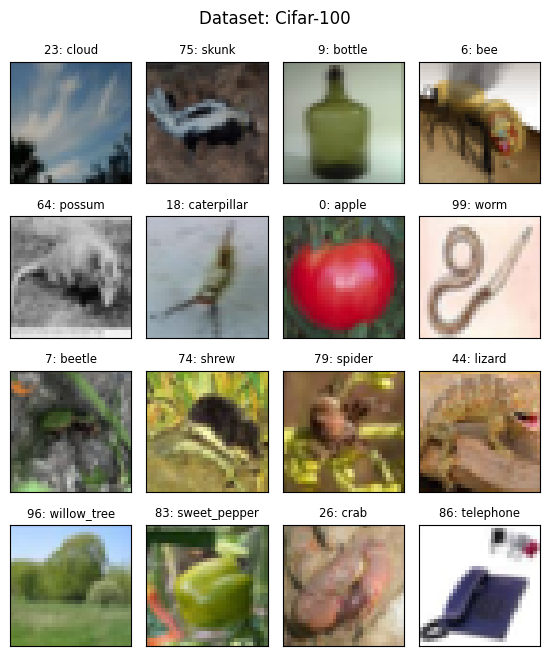

In [3]:
### download data:

fmnist = datasets.FashionMNIST(root='data/', download=True)
fmnist.name, fmnist.num_classes = 'Fashion-MNIST', len(fmnist.classes)

cifar10 = datasets.CIFAR10(root='data/', download=True)
cifar10.name, cifar10.num_classes = 'CIFAR-10', len(cifar10.classes)

cifar100 = datasets.CIFAR100(root='data/', download=True)
cifar100.name, cifar100.num_classes = 'Cifar-100', len(cifar100.classes)

### take a look:
count_labels(fmnist)
inspect_dataset(fmnist)

count_labels(cifar10)
inspect_dataset(cifar10)

count_labels(cifar100)
inspect_dataset(cifar100)

### DATA SEPARATION AND PROCESSING

In [4]:
# quick function for displaying the classes of a task:
def inspect_task(task_data, title=None):
    num_task_classes = len(task_data.classes)
    task_classes = tuple([str(c) for c in task_data.classes])

    class_image_examples = [[batch[0] for batch in task_data if batch[1]==c][0] for c in range(num_task_classes)]
    _ = inspect_batch(class_image_examples, labels=task_classes, scale=0.7, num_cols=num_task_classes, title=title, center_title=False)


def divide_tasks(dataset, dataset_name:str, BATCH_SIZE:int=256):
    if dataset_name.lower() == 'fmnist':
        timestep_task_classes = {
            0: ['Pullover', 'Dress'],
            1: ['Trouser', 'Bag'],
            2: ['Ankle boot', 'Sneaker', 'Sandal'],
            3: ['T-shirt/top', 'Coat', 'Shirt'],
            }
        
        preprocess = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.25,))
        ])

    elif dataset_name.lower() == 'cifar-10':
        timestep_task_classes = {
            0: ["airplane", "ship"],
            1: ["automobile", "truck"],
            2: ["cat", "dog", "frog"],
            3: ["bird", "deer", "horse"],
            }
        preprocess = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(
                mean=(0.4914, 0.4822, 0.4465),
                std=(0.2470, 0.2435, 0.2616)
            )
        ])
    elif dataset_name.lower() == 'cifar-100':
        timestep_task_classes = {
        0: [  # aquatic mammals
            "beaver", "dolphin", "otter", "seal", "whale"
        ],
        1: [  # fish
            "aquarium_fish", "flatfish", "ray", "shark", "trout"
        ],
        2: [  # flowers
            "orchid", "poppy", "rose", "sunflower", "tulip"
        ],
        3: [  # food containers
            "bottle", "bowl", "can", "cup", "plate"
        ],
        4: [  # fruit and vegetables
            "apple", "mushroom", "orange", "pear", "sweet_pepper"
        ],
        5: [  # household electrical devices
            "clock", "keyboard", "lamp", "telephone", "television"
        ],
        6: [  # household furniture
            "bed", "chair", "couch", "table", "wardrobe"
        ],
        7: [  # insects
            "bee", "beetle", "butterfly", "caterpillar", "cockroach"
        ],
        8: [  # large carnivores
            "bear", "leopard", "lion", "tiger", "wolf"
        ],
        9: [  # large man-made outdoor things
            "bridge", "castle", "house", "road", "skyscraper"
        ],
        10: [  # large natural outdoor scenes
            "cloud", "forest", "mountain", "plain", "sea"
        ],
        11: [  # large omnivores and herbivores
            "camel", "cattle", "chimpanzee", "elephant", "kangaroo"
        ],
        12: [  # medium-sized mammals
            "fox", "porcupine", "possum", "raccoon", "skunk"
        ],
        13: [  # non-insect invertebrates
            "crab", "lobster", "snail", "spider", "worm"
        ],
        14: [  # people
            "baby", "boy", "girl", "man", "woman"
        ],
        15: [  # reptiles
            "crocodile", "dinosaur", "lizard", "snake", "turtle"
        ],
        16: [  # small mammals
            "hamster", "mouse", "rabbit", "shrew", "squirrel"
        ],
        17: [  # trees
            "maple_tree", "oak_tree", "palm_tree", "pine_tree", "willow_tree"
        ],
        18: [  # vehicles 1
            "bicycle", "bus", "motorcycle", "pickup_truck", "train"
        ],
        19: [  # vehicles 2
            "lawn_mower", "rocket", "streetcar", "tank", "tractor"
        ],
    }


        # image preprocessing transform:
        preprocess = transforms.Compose([
            # transforms.RandomCrop(32, padding=4),
            # transforms.RandomHorizontalFlip(),
            # transforms.RandomRotation(15),
            # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=(0.5071, 0.4867, 0.4408),
                std=(0.2675, 0.2565, 0.2761)
            )
        ])

    # data/loader constants:
    VAL_FRAC = 0.1     # validation hold-out per task
    TEST_FRAC = 0.05   # for final test set containing all tasks

    # build task datasets for each timestep:
    timestep_tasks = {}
    timestep_loaders = {}

    task_test_sets = []

    for t, task_classes in timestep_task_classes.items():
        task_class_labels = [dataset.class_to_idx[cl] for cl in task_classes] # original labels in fmnist source data
        task_datapoint_idxs = [i for i,label in enumerate(dataset.targets) if label in task_class_labels]
        
        task_datapoints = [dataset[idx] for idx in task_datapoint_idxs]
        
        class_to_idx = {task_classes[t]: t for t in range(len(task_classes))}
        
        task_images = [preprocess(img) for (img, label) in task_datapoints]
        task_labels = [class_to_idx[dataset.classes[label]] for (img, label) in task_datapoints] # new labels

        # in addition to the images and labels, each task dataset now comes with a 'task id'
        # that tells the model which learned task to perform:
        task_ids = [t] * len(task_datapoints)
        
        task_image_tensor = torch.Tensor(torch.stack(task_images))
        task_label_tensor = torch.Tensor(task_labels).long()
        task_id_tensor = torch.Tensor(task_ids).long()
        
        task_data = TensorDataset(task_image_tensor, task_label_tensor, task_id_tensor)

        # train/validation split:
        train_frac  = 1.0 - VAL_FRAC - TEST_FRAC
        task_train, task_val, task_test = utils.data.random_split(task_data, [train_frac, VAL_FRAC, TEST_FRAC])
        
        # set dataset attributes to reflect what they contain:
        for data in (task_train, task_val, task_test):
            data.classes      = task_classes
            data.num_classes  = len(task_classes)
            data.class_to_idx = class_to_idx
            data.task_id      = t

        # inspect samples of both classes:
        print(f'Time={t} | Task ID {t} | {len(task_train):,} train | {len(task_val):,} validation | {len(task_test):,} test')
        inspect_task(task_train)

        # add train/val data to timestep dict, and test data to the list of test sets
        timestep_tasks[t] = task_train, task_val
        task_test_sets.append(task_test)


    # for final evaluation of the model, we evaluate on all task test sets jointly:
    final_test_data = ConcatDataset(task_test_sets)
    final_test_loader = DataLoader(final_test_data, 
                                batch_size=BATCH_SIZE,
                                shuffle=True)
    print(f'Final test set size (containing all tasks): {len(final_test_data):,}\n')


    # and we will also run a joint training loop on the whole training dataset at once to see upper bound performance
    joint_train_data = ConcatDataset([train for train,val in timestep_tasks.values()])
    joint_train_loader = DataLoader(joint_train_data, 
                                    batch_size=BATCH_SIZE,
                                    shuffle=True)

    print(f'Joint training set size (containing all tasks): {len(joint_train_data):,}')

    return task_train, timestep_task_classes, timestep_tasks, task_test_sets


In [5]:
DATASET_CONFIGS = {
    'fmnist': {
        'image_size': (28, 28),
        'channels': 1,
        'hog_params': {
            'pixels_per_cell': (8, 8),
            'cells_per_block': (2, 2),
        },
        'gabor_params': {
            'frequencies': [0.1, 0.2, 0.3],
            'orientations': [0, np.pi/4, np.pi/2, 3*np.pi/4],
            'kernel_size': 21,
        },
        'default_weights': [0.2, 0.1, 0.2, 0.2, 0.1, 0.2],
        'color_mode': 'grayscale'
    },
    'cifar10': {
        'image_size': (32, 32),
        'channels': 3,
        'hog_params': {
            'pixels_per_cell': (4, 4),
            'cells_per_block': (2, 2),
        },
        'gabor_params': {
            'frequencies': [0.1, 0.2, 0.3, 0.4],
            'orientations': [0, np.pi/8, np.pi/4, 3*np.pi/8, np.pi/2, 5*np.pi/8, 3*np.pi/4, 7*np.pi/8],
            'kernel_size': 31,
        },
        'default_weights': [0.2, 0.3, 0.1, 0.2, 0.1, 0.1],
        'color_mode': 'rgb'
    },
    'cifar100': {
        'image_size': (32, 32),
        'channels': 3,
        'hog_params': {
            'pixels_per_cell': (4, 4),
            'cells_per_block': (2, 2),
        },
        'gabor_params': {
            'frequencies': [0.1, 0.2, 0.3, 0.4],
            'orientations': [0, np.pi/8, np.pi/4, 3*np.pi/8, np.pi/2, 5*np.pi/8, 3*np.pi/4, 7*np.pi/8],
            'kernel_size': 31,
        },
        'default_weights': [0.2, 0.3, 0.1, 0.2, 0.1, 0.1],
        'color_mode': 'rgb'
    }
}

@lru_cache(maxsize=256)
def get_gabor_kernel_cached(kernel_size, sigma, theta, lambd, gamma):
    """Cache de kernels Gabor para evitar cálculos repetidos"""
    return cv2.getGaborKernel(
        (kernel_size, kernel_size), sigma, theta, lambd, gamma, 0.0, ktype=cv2.CV_32F
    )

def my_gabor_filter_optimized(img, frequency, theta, kernel_size=31, sigma=1.0, gamma=1.0):
    """Versión optimizada del filtro Gabor con kernel cacheado"""
    lambd = 1.0 / frequency
    gabor_kernel = get_gabor_kernel_cached(kernel_size, sigma, theta, lambd, gamma)

    if len(img.shape) == 3 and img.shape[2] == 3:
        filtered_channels = []
        for channel in range(3):
            filtered_channel = cv2.filter2D(img[:, :, channel], cv2.CV_32F, gabor_kernel)
            filtered_channels.append(filtered_channel)
        filtered_img = np.stack(filtered_channels, axis=2)
    else:
        filtered_img = cv2.filter2D(img, cv2.CV_32F, gabor_kernel)

    return filtered_img

def compute_knn_purity_batch(embeddings: np.ndarray, labels: np.ndarray, k: int = 5) -> np.ndarray:
    """
    Computa pureza KNN para todos los embeddings de una vez

    Args:
        embeddings: Array de embeddings [n_samples, n_features]
        labels: Array de etiquetas [n_samples]
        k: Número de vecinos a considerar

    Returns:
        Array de purezas KNN [n_samples] donde valores altos indican más vecinos de la misma clase
    """
    n_samples = embeddings.shape[0]

    # Asegurar formato correcto
    if len(embeddings.shape) == 1:
        embeddings = embeddings.reshape(1, -1)
    elif len(embeddings.shape) > 2:
        embeddings = embeddings.reshape(embeddings.shape[0], -1)

    # Crear y ajustar modelo KNN
    knn = NearestNeighbors(n_neighbors=min(k + 1, n_samples),
                          algorithm='auto',
                          metric='euclidean')
    knn.fit(embeddings)

    # Encontrar vecinos más cercanos
    distances, indices = knn.kneighbors(embeddings)

    # Calcular pureza para cada muestra
    purities = []
    for i in range(n_samples):
        # Excluir el punto mismo (primer vecino)
        neighbor_indices = indices[i, 1:k+1]
        neighbor_labels = labels[neighbor_indices]

        # Contar cuántos vecinos tienen la misma etiqueta
        same_class_count = np.sum(neighbor_labels == labels[i])
        purity = same_class_count / k

        purities.append(purity)

    return np.array(purities)

class DifficultyScorer:
    """Clase para calcular scores de dificultad de forma optimizada"""

    def __init__(self, dataset_name: str = 'fmnist', use_color_hog: bool = None):
        """
        Inicializa el scorer para un dataset específico.

        Args:
            dataset_name: 'fmnist', 'cifar10' o 'cifar100'
            use_color_hog: Si es True, usa HOG en color (solo para datasets RGB).
        """
        self.dataset_name = dataset_name
        self.config = DATASET_CONFIGS[dataset_name].copy()

        # Configuración específica
        self.frequencies = self.config['gabor_params']['frequencies']
        self.orientations = self.config['gabor_params']['orientations']
        self.kernel_size = self.config['gabor_params']['kernel_size']
        self.hog_params = self.config['hog_params']
        self.color_mode = self.config['color_mode']

        # Para datasets RGB, decidir si usar HOG en color
        if self.color_mode == 'rgb':
            if use_color_hog is not None:
                self.use_color_hog = use_color_hog
            else:
                self.use_color_hog = False
        else:
            self.use_color_hog = False

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Caches
        self.hog_embeddings_cache = None
        self.centroids_por_clase = {}  # CAMBIO: centroides por clase, no uno general
        self.knn_purity_cache = None  # CAMBIO: pureza KNN en lugar de distancia
        self.gabor_features_cache = {}
        self.color_features_cache = {}

        # Definir nombres y descripciones de características
        self.feature_names = [
            'dist_centroid', 'color_dist', 'knn_difficulty',
            'gabor_energy', 'gabor_entropy', 'gabor_contrast'
        ]

        self.feature_descriptions = [
            'Distance to the HOG centroid of its class',
            'Color distinctiveness',
            'KNN purity',
            'Energy from the Gabor filters',
            'Entropy based on Gabor filters',
            'Contrast of the Gabor filters'
        ]

        print(f"Scorer initialized for {dataset_name}")
        print(f"  - Color mode: {self.color_mode}")
        print(f"  - Use color HOG: {self.use_color_hog}")
        print(f"  - Device: {self.device}")

    def _compute_hog_embedding(self, img: np.ndarray) -> np.ndarray:
        """Calcula el embedding HOG, adaptado al tipo de imagen"""
        # Para imágenes en escala de grises
        if self.color_mode == 'grayscale':
            return hog(img,
                      pixels_per_cell=self.hog_params['pixels_per_cell'],
                      cells_per_block=self.hog_params['cells_per_block'],
                      visualize=False,
                      feature_vector=True)

        # Para imágenes RGB
        elif self.color_mode == 'rgb':
            if self.use_color_hog:
                # HOG en color (3 canales)
                hog_features = []
                for channel in range(3):
                    channel_features = hog(img[:, :, channel],
                                          pixels_per_cell=self.hog_params['pixels_per_cell'],
                                          cells_per_block=self.hog_params['cells_per_block'],
                                          visualize=False,
                                          feature_vector=True)
                    hog_features.append(channel_features)
                return np.concatenate(hog_features)
            else:
                # Convertir a escala de grises para HOG
                if len(img.shape) == 3 and img.shape[2] == 3:
                    img_gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
                else:
                    img_gray = img

                return hog(img_gray,
                          pixels_per_cell=self.hog_params['pixels_per_cell'],
                          cells_per_block=self.hog_params['cells_per_block'],
                          visualize=False,
                          feature_vector=True)
        else:
            raise ValueError(f"Color mode no soportado: {self.color_mode}")

    def _compute_gabor_features(self, img: np.ndarray):
        """Computa características Gabor para una imagen"""
        total_energy = 0.0
        entropy_values = []
        contrast_values = []

        # Para imágenes a color, convertimos a escala de grises para Gabor
        if len(img.shape) == 3 and img.shape[2] == 3:
            img_gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
        else:
            img_gray = img

        for frequency in self.frequencies:
            for theta in self.orientations:
                filtered_img = my_gabor_filter_optimized(
                    img_gray, frequency, theta, kernel_size=self.kernel_size
                )

                # Energía
                total_energy += np.sum(filtered_img ** 2)

                # Entropía
                hist, _ = np.histogram(filtered_img.flatten(), bins=50,
                                       range=(filtered_img.min(), filtered_img.max()))
                if hist.sum() > 0:
                    hist_norm = hist / hist.sum()
                    entropy_values.append(entropy(hist_norm))

                # Contraste (varianza)
                contrast_values.append(np.var(filtered_img))

        gabor_entropy = np.mean(entropy_values) if entropy_values else 0.0
        gabor_contrast = np.mean(contrast_values) if contrast_values else 0.0

        return total_energy, gabor_entropy, gabor_contrast

    def _compute_color_distinctiveness(self, img: np.ndarray) -> float:
        """Calcula la distintividad de color"""
        if len(img.shape) == 2 or img.shape[2] == 1:
            # Para imágenes en escala de grises
            hist, _ = np.histogram(img.flatten(), bins=50)
        else:
            # Para imágenes RGB
            img_uint8 = (img * 255).astype(np.uint8)

            # Convertir a HSV para análisis de color
            hsv_img = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2HSV)

            # Calcular histograma en el canal H (tono)
            hist = cv2.calcHist([hsv_img], [0], None, [180], [0, 180])
            hist = hist.flatten()

        if hist.sum() > 0:
            hist_norm = hist / hist.sum()
            return entropy(hist_norm)
        return 0.0

    def _normalize_features_batch(self, features_tensor: torch.Tensor) -> torch.Tensor:
        """Normalización por características (columnas)"""
        mean = torch.mean(features_tensor, dim=0, keepdim=True)
        std = torch.std(features_tensor, dim=0, keepdim=True) + 1e-8  # Añadir epsilon para estabilidad
        return (features_tensor - mean) / std

    def precompute_all_features(self, images: List[np.ndarray], labels: List[int]) -> Tuple[torch.Tensor, dict]:
        """
        Precomputa todas las características necesarias

        Args:
            images: Lista de imágenes
            labels: Lista de etiquetas (necesario para pureza KNN y centroides por clase)

        Returns:
            (características normalizadas, metadatos)
        """
        print(f"Computing features for {len(images)} imágenes...")

        # Convertir labels a numpy array
        labels_array = np.array(labels)

        # Precomputar embeddings HOG
        self.hog_embeddings_cache = []
        for img in images:
            self.hog_embeddings_cache.append(self._compute_hog_embedding(img))
        self.hog_embeddings_cache = np.array(self.hog_embeddings_cache)

        # CALCULAR CENTROIDES POR CLASE (NO centroide general)
        print("Computing class's centroids...")
        unique_classes = np.unique(labels_array)
        self.centroids_por_clase = {}

        for class_id in unique_classes:
            class_indices = np.where(labels_array == class_id)[0]
            if len(class_indices) > 0:
                class_embeddings = self.hog_embeddings_cache[class_indices]
                self.centroids_por_clase[class_id] = np.mean(class_embeddings, axis=0)

        # Calcular pureza KNN (REEMPLAZA distancia KNN)
        print("Computing KNN purity...")
        self.knn_purity_cache = compute_knn_purity_batch(
            self.hog_embeddings_cache, labels_array, k=5
        )

        # Calcular características por imagen
        all_features = []

        for idx, img in enumerate(images):
            # Usar embeddings HOG precomputados
            hog_embedding = self.hog_embeddings_cache[idx]
            label = labels[idx]

            # 1. DISTANCIA AL CENTROIDE DE SU CLASE
            if label in self.centroids_por_clase:
                class_centroid = self.centroids_por_clase[label]
                dist_centroid = np.linalg.norm(hog_embedding - class_centroid)
            else:
                # Fallback si la clase no está en centroides (no debería pasar)
                dist_centroid = 0.0

            # 2. DIFICULTAD KNN (1 - pureza)
            knn_purity = self.knn_purity_cache[idx]
            knn_difficulty = 1.0 - knn_purity  # Invertir: alta pureza = fácil, baja pureza = difícil

            # 3. Características Gabor (cacheadas por imagen)
            if idx not in self.gabor_features_cache:
                gabor_energy, gabor_entropy, gabor_contrast = self._compute_gabor_features(img)
                self.gabor_features_cache[idx] = (gabor_energy, gabor_entropy, gabor_contrast)

            gabor_energy, gabor_entropy, gabor_contrast = self.gabor_features_cache[idx]

            # 4. Distinctividad de color
            if idx not in self.color_features_cache:
                self.color_features_cache[idx] = self._compute_color_distinctiveness(img)

            color_dist = self.color_features_cache[idx]

            # Combinar características
            features = np.array([
                dist_centroid,
                color_dist,
                knn_difficulty,
                gabor_energy,
                gabor_entropy,
                gabor_contrast
            ], dtype=np.float32)

            all_features.append(features)

        # Convertir a tensor y normalizar
        features_tensor = torch.tensor(np.array(all_features), dtype=torch.float32).to(self.device)
        features_normalized = self._normalize_features_batch(features_tensor)

        # Metadatos para referencia
        metadata = {
            'hog_embeddings': self.hog_embeddings_cache,
            'centroids_por_clase': self.centroids_por_clase,  # CAMBIO: diccionario de centroides
            'knn_purities': self.knn_purity_cache,
            'knn_difficulties': 1.0 - self.knn_purity_cache,
            'feature_names': self.feature_names,
            'feature_descriptions': self.feature_descriptions,
            'device': str(self.device),
            'dataset_name': self.dataset_name,
            'use_color_hog': self.use_color_hog,
            'n_features': features_tensor.shape[1],
            'n_images': len(images),
            'n_classes': len(unique_classes),
            'labels': labels
        }

        return features_normalized, metadata

    def compute_difficulty_scores(self,
                                 features_normalized: torch.Tensor,
                                 weights: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Calcula scores de dificultad a partir de características normalizadas
        """
        if features_normalized.device != self.device:
            features_normalized = features_normalized.to(self.device)

        if weights is None:
            default_weights = self.config.get('default_weights', [1.0] * features_normalized.shape[1])
            weights = torch.tensor(default_weights, dtype=torch.float32, device=self.device)
        else:
            if isinstance(weights, (list, np.ndarray)):
                weights = torch.tensor(weights, dtype=torch.float32)

            if weights.device != self.device:
                weights = weights.to(self.device)

        # Calcular score como combinación ponderada
        scores = torch.sum(features_normalized * weights, dim=1)

        # Normalizar scores a [0, 1]
        min_score = torch.min(scores)
        max_score = torch.max(scores)
        if (max_score - min_score) > 1e-8:
            scores_normalized = (scores - min_score) / (max_score - min_score)
        else:
            scores_normalized = torch.zeros_like(scores)

        return scores_normalized

class CurriculumDataLoader:
    """Wrapper simple para usar curriculum learning en PyTorch"""
    
    def __init__(self, dataset_name, dataset, batch_size=32, 
                 strategy='ascending', use_color_hog=False,
                 custom_weights=None):
        """
        Crea un DataLoader con orden de curriculum
        
        Args:
            dataset_name: 'fmnist', 'cifar10', 'cifar100'
            dataset: dataset de PyTorch (que devuelve (image, label) sin task_id)
            batch_size: tamaño del batch
            strategy: 'ascending' (fácil→difícil), 'descending', 'mixed', 'random'
            use_color_hog: usar HOG en color (solo RGB)
            custom_weights: pesos para características [w1, w2, ..., w6]
        """
        self.dataset_name = dataset_name
        self.dataset = dataset
        self.batch_size = batch_size
        self.strategy = strategy
        
        print(f"Iniciando CurriculumDataLoader...")
        print(f"Dataset: {dataset_name}, Estrategia: {strategy}")
        
        self.images, self.labels = self._extract_images_and_labels()
        self.scorer = DifficultyScorer(dataset_name=dataset_name, use_color_hog=use_color_hog)
        self.features, self.metadata = self.scorer.precompute_all_features(self.images, self.labels)
        self.scores = self.scorer.compute_difficulty_scores(self.features, custom_weights)
        self.curriculum_indices = self._generate_curriculum_indices()
        self.dataloader = self._create_dataloader()
        
        print(f"Curriculum creado: {len(self.curriculum_indices)} imágenes")
    
    def _extract_images_and_labels(self):
        """Extrae imágenes y etiquetas del dataset"""
        images = []
        labels = []
        
        for img_tensor, label in self.dataset:
            # Convertir tensor (C,H,W) a numpy (H,W,C) o (H,W) según corresponda
            if self.dataset_name == 'fmnist':
                # Para fmnist, el tensor es (1,28,28) -> lo convertimos a (28,28)
                img_np = img_tensor.numpy().squeeze()
            else:
                # Para cifar, el tensor es (3,32,32) -> lo convertimos a (32,32,3)
                img_np = img_tensor.numpy().transpose(1, 2, 0)
            
            images.append(img_np)
            labels.append(label)
        
        return images, labels
    
    def _generate_curriculum_indices(self):
        """Genera el orden basado en los scores"""
        n = len(self.images)
        
        if self.strategy == 'ascending':
            indices = torch.argsort(self.scores)
        elif self.strategy == 'descending':
            indices = torch.argsort(self.scores, descending=True)
        elif self.strategy == 'mixed':
            # Mezcla por grupos de dificultad
            sorted_idx = torch.argsort(self.scores)
            groups = 5
            group_size = n // groups
            mixed = []
            
            for i in range(groups):
                start = i * group_size
                end = start + group_size if i < groups - 1 else n
                group = sorted_idx[start:end]
                mixed.append(group[torch.randperm(len(group))])
            
            indices = torch.cat(mixed)
        elif self.strategy == 'random':
            indices = torch.randperm(n)
        else:
            raise ValueError(f"Estrategia '{self.strategy}' no válida")
        
        return indices.cpu().numpy()
    
    def _create_dataloader(self):
        """Crea el DataLoader con el orden del curriculum"""
        from torch.utils.data import Subset, DataLoader
        
        subset = Subset(self.dataset, self.curriculum_indices)
        
        return DataLoader(
            subset,
            batch_size=self.batch_size,
            shuffle=False,  # Mantener orden del curriculum
            num_workers=2,
            pin_memory=torch.cuda.is_available()
        )
    
    def get_dataloader(self):
        """Retorna el DataLoader con curriculum"""
        return self.dataloader
    
    def get_curriculum_order(self):
        """Retorna los índices ordenados"""
        return self.curriculum_indices.copy()
    
    def get_scores(self):
        """Retorna los scores de dificultad"""
        return self.scores.clone()
    
    def save_curriculum(self, filename="curriculum_indices.npy"):
        """Guarda los índices para uso futuro"""
        np.save(filename, self.curriculum_indices)
        print(f"✅ Curriculum guardado en: {filename}")

## MODELS


In [6]:
### model architecture hyperparameters:
NUM_CONV_FEATURES = [32, 64, 64, 128]
TASK_HEAD_PROJECTION_SIZE = 64

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class Conv4Backbone(nn.Module):
    def __init__(self, 
                 input_size,  # passed as a parameter to allow flexibility between datasets
                 layers=NUM_CONV_FEATURES, # list of conv layer num_kernels
                 device=device,
                ):
        super().__init__()

        in_channels, in_h, in_w = input_size        

        # build the sequential stack of conv layers:
        conv_layers = []
        prev_layer_size = in_channels
        for layer_size in layers:
            conv_layers.append(nn.Conv2d(prev_layer_size, layer_size, (3,3), padding='same'))
            conv_layers.append(nn.GroupNorm(num_groups=layer_size//4, num_channels=layer_size))
            conv_layers.append(nn.ReLU())
            prev_layer_size = layer_size
            
        self.conv_stack = torch.nn.Sequential(*conv_layers)
        
        # global average pooling to reduce to single dimension:
        self.pool = nn.AdaptiveAvgPool2d((1,1))
        
        # number of output features:
        self.num_features = prev_layer_size
        
        self.relu = nn.ReLU()

        self.device = device
        self.to(device)
    
    def forward(self, x):
        # pass through conv layers:
        x = self.conv_stack(x)
        
        # downsample and reshape to vector:
        x = self.pool(x)
        x = x.view(-1, self.num_features)

        # return feature vector:
        return x

### as before, define a classification head that we can attach to the backbone:
class TaskHead(nn.Module):
    def __init__(self, 
                 num_classes: int,      # number of output neurons
                 input_size: int = NUM_CONV_FEATURES[-1], # number of features in the backbone's output
                 projection_size: int = TASK_HEAD_PROJECTION_SIZE,  # number of neurons in the hidden layer
                 dropout: float=0.,     # optional dropout rate to apply
                 device=device):
        super().__init__()
        
        self.projection = nn.Linear(input_size, projection_size)
        self.classifier = nn.Linear(projection_size, num_classes)

        if dropout > 0:
            self.dropout = nn.Dropout(dropout)
        else:
            self.dropout = nn.Identity()

        self.relu = nn.ReLU()

        self.device = device
        self.to(device)

    def forward(self, x):
        # assume x is already unactivated feature logits,
        # e.g. from resnet backbone
        x = self.projection(self.relu(self.dropout(x)))
        x = self.classifier(self.relu(self.dropout(x)))

        return x


### and a model that contains a backbone plus multiple class heads,
### and performs task-ID routing at runtime, allowing it to perform any learned task:
class MultitaskModel(nn.Module):
    def __init__(self, backbone: nn.Module, 
                 device=device):
        super().__init__()

        self.backbone = backbone

        # a dict mapping task IDs to the classification heads for those tasks:
        self.task_heads = nn.ModuleDict()        
        # we must use a nn.ModuleDict instead of a base python dict,
        # to ensure that the modules inside are properly registered in self.parameters() etc.

        self.relu = nn.ReLU()
        self.device = device
        self.to(device)

    def forward(self, 
                x: torch.Tensor, 
                task_id: int):
        
        task_id = str(int(task_id))
        # nn.ModuleDict requires string keys for some reason,
        # so we have to be sure to cast the task_id from tensor(2) to 2 to '2'
        
        assert task_id in self.task_heads, f"no head exists for task id {task_id}"
        
        # select which classifier head to use:
        chosen_head = self.task_heads[task_id]

        # activated features from backbone:
        x = self.relu(self.backbone(x))
        # task-specific prediction:
        x = chosen_head(x)

        return x

    def add_task(self, 
                 task_id: int, 
                 head: nn.Module):
        """accepts an integer task_id and a classification head
        associated to that task.
        adds the head to this model's collection of task heads."""
        self.task_heads[str(task_id)] = head.to(self.device)

    @property
    def num_task_heads(self):
        return len(self.task_heads)

## EVALUATION

In [7]:

#### basic evaluation function for a multitask model
#### over some specified validation loader,
#### expecting the correct task IDs:
def evaluate_model(multitask_model: nn.Module,  # trained model capable of multi-task classification
                   val_loader: utils.data.DataLoader,  # task-specific data to evaluate on
                   loss_fn: nn.modules.loss._Loss = nn.CrossEntropyLoss(),
                  ):
    """runs model on entirety of validation loader,
    with specified loss and accuracy functions,
    and returns average loss/acc over all batches"""
    multitask_model.eval()
    with torch.no_grad():
        batch_val_losses, batch_val_accs = [], []
    
        for batch in val_loader:
            vx, vy, task_ids = batch
            vx, vy = vx.to(device), vy.to(device)
            
            vpred = multitask_model(vx, task_ids[0])
            val_loss = loss_fn(vpred, vy)
            val_acc = top1_acc(vpred, vy)
            
            batch_val_losses.append(val_loss.item())
            batch_val_accs.append(val_acc)
    return np.mean(batch_val_losses), np.mean(batch_val_accs)


#### we will also evaluate the model on the test sets of all the tasks seen so far,
#### which also lets us see the final overall performance at the end of the run
def full_test_evaluate(multitask_model: nn.Module,   # trained model capable of multi-task classification
                  selected_test_sets: list[utils.data.Dataset], # task-specific test sets to evaluate on
                  prev_accs: list[list[float]] = None, # previous taskwise accuracies of this model,
                                                       # to show catastrophic forgetting gaps
                  show_taskwise_accuracy=True, # show bar plot indicating performance on each separate task
                  baseline_taskwise_accs: list[float]=None, # optional baseline performance on each task for comparison
                  model_name: str='', # optional model name to show in plots
                  verbose=False, # more detailed output to console
                 ):
    if verbose:
        print(f'{model_name} evaluation on test set of all tasks:'.capitalize())

    task_test_losses = []
    task_test_accs = []

    for t, test_data in enumerate(selected_test_sets):
        test_loader = utils.data.DataLoader(test_data, 
                                       batch_size=BATCH_SIZE,
                                       shuffle=True)
        
        task_test_loss, task_test_acc = evaluate_model(multitask_model, test_loader)

        if verbose:
            print(f'{test_data.classes}: {task_test_acc:.2%}')
            if baseline_taskwise_accs is not None:
                print(f'(baseline: {baseline_taskwise_accs[t]:.2%})')
        
        task_test_losses.append(task_test_loss)
        task_test_accs.append(task_test_acc)
        
    avg_task_test_loss = np.mean(task_test_losses)
    avg_task_test_acc = np.mean(task_test_accs)

    if verbose:
        print(f'\n +++ AVERAGE TASK TEST ACCURACY: {avg_task_test_acc:.2%} +++ ')


    if show_taskwise_accuracy:
        bar_heights = task_test_accs + [0]*(len(task_test_sets) - len(selected_test_sets))
        # display bar plot with accuracy on each evaluation task
        plt.bar(x = range(len(task_test_sets)), height=bar_heights, zorder=1, alpha=0.9)
        plt.xticks(range(len(task_test_sets)), [',\n'.join(task.classes) for task in task_test_sets]) #, rotation='vertical')
        plt.axhline(avg_task_test_acc, c=[0.2]*3, linestyle=':')
        plt.text(1, avg_task_test_acc+0.01, f'{model_name} (average)', c=[0.2]*3, size=8)

        if prev_accs is not None:
            # plot the previous step's accuracies on top
            # (will show forgetting in red)
            for p, prev_acc_list in enumerate(prev_accs):
                plt.bar(x = range(len(prev_acc_list)), height=prev_acc_list, fc='tab:red', zorder=0, alpha=0.5*((p+1)/len(prev_accs)))

        if baseline_taskwise_accs is not None:
            for t, acc in enumerate(baseline_taskwise_accs):
                plt.plot([t-0.4, t+0.4], [acc, acc], c=[0.6]*3, linestyle='--', label=f'baseline at t={len(baseline_taskwise_accs)-1}' if t==0 else None)
            plt.legend()
            # show average as well:
            baseline_avg = np.mean(baseline_taskwise_accs)
            plt.axhline(baseline_avg, c=[0.6]*3, linestyle=':')
            plt.text(1, baseline_avg-0.025, f'baseline at t={len(baseline_taskwise_accs)-1} (average)', c=[0.6]*3, size=8)

        plt.title(f'{model_name}: Test-time evaluation on all known tasks')    
        plt.show()
    
    return task_test_accs

## BASELINE TRAINING


In [8]:
def baseline_model_training(timestep_tasks, task_test_sets, INPUT_SIZE):
    torch.manual_seed(0)
    # define backbone and place it inside the multitask model:
    backbone = Conv4Backbone(input_size=INPUT_SIZE)
    multitask_model = MultitaskModel(backbone)

    # CL hyperparameters:
    epochs_per_timestep = 10    # how many epochs to run before switching to next task

    ### training hyperparameters:
    lr     = 1e-3  # initial learning rate
    l2_reg = 1e-4  # L2 weight decay term (0 means no regularisation)

    ### metrics and plotting:     
    dynamic_plot  = False   # show training plots after each timestep
    show_progress = True   # show progress bars and end-of-epoch metrics
    verbose       = True   # output extra info to console

        
    # define loss and optimiser:
    loss_fn = nn.CrossEntropyLoss()
    opt = torch.optim.AdamW(multitask_model.parameters(), lr=lr, weight_decay=l2_reg)

    # some variables for plotting:
    metrics = TrainingMetrics()
    baseline_prev_test_accs = [] # test accuracy on previous tasks, to monitor forgetting
    total_train_steps = int(sum([epochs_per_timestep * np.ceil(len(train_set)/BATCH_SIZE) 
                                    for (train_set, val_set) in timestep_tasks.values()]))

    # outer loop over each task, in sequence
    for t, (task_train, task_val) in timestep_tasks.items():

        if verbose:
            print(f'Training on task id: {t}  (classification between: {task_train.classes})')
            inspect_task(task_train)
        
        if t not in multitask_model.task_heads:
            if verbose:
                print(f'  Adding new task head {t} to multi-task model')
                
            task_head = TaskHead(num_classes = task_train.num_classes)
            multitask_model.add_task(t, task_head)

        # build train and validation loaders for the current task:
        train_loader, val_loader = [utils.data.DataLoader(data, 
                                    batch_size=BATCH_SIZE,
                                    shuffle=True)
                                    for data in (task_train, task_val)]

        # inner loop over the current task:
        for e in range(epochs_per_timestep):
            epoch_train_losses, epoch_train_accs = [], []

            if show_progress:
                # set a progress bar to loop over
                batch_iter = tqdm(train_loader, ncols=100)
            else:
                batch_iter = train_loader

            multitask_model.train()
            for step, batch in enumerate(batch_iter):
                # get the image-label pair from the dataloader batch,
                # along with the task ID, which should be the same number across the whole batch
                x, y, task_ids = batch
                x, y = x.to(device), y.to(device)
        
                opt.zero_grad()

                # verify that task IDs are all the same, just in case:
                assert torch.all(task_ids == task_ids[0]), "mismatching task IDs within batch"
                task_id = task_ids[0]

                pred = multitask_model(x, task_id) # important to send task ID to the model!
                
                batch_loss = loss_fn(pred, y)
                batch_acc = top1_acc(pred, y)
        
                batch_loss.backward()
                opt.step()
        
                # track loss and accuracy:
                metrics.log_train(loss=batch_loss.item(), acc=batch_acc)
                

                if show_progress:
                    # show loss/acc of this batch in progress bar:
                    report = (f'E{e} batch loss:{batch_loss:.2f}, batch acc:{batch_acc:>5.1%}')
                    batch_iter.set_description(report)

            # evaluate after each epoch::
            val_loss, val_acc = evaluate_model(multitask_model, val_loader, loss_fn)
            metrics.log_val(loss=val_loss, acc=val_acc)
            
            # report summary metrics:
            epoch_train_loss, epoch_val_loss = metrics.epoch_loss
            epoch_train_acc, epoch_val_acc = metrics.epoch_acc
            print(f'epoch:{e:>3} | loss: {epoch_train_loss:.2f} | {epoch_val_loss:.2f}   ' +
            f'acc: {epoch_train_acc:.1%} | {epoch_val_acc:.1%}')
                


        metrics.next_iteration() # increment CL timestep for plotting
        
        metrics.plot(title=f'Continual training at time {t}: Baseline model', live=False,
                    max_step = total_train_steps)

        # evaluate on all tasks so far, and save the performance:
        task_test_accs = full_test_evaluate(multitask_model, task_test_sets[:t+1], model_name=f'baseline at t={t}', 
                                            prev_accs = baseline_prev_test_accs, verbose=True)
        baseline_prev_test_accs.append(task_test_accs)

    # record the baseline performance for later comparison with your CL implementation
    baseline_metrics = metrics
    baseline_taskwise_test_accs = task_test_accs

    baseline_avg_test_acc = np.mean(baseline_taskwise_test_accs)
    print(f'\n=== Baseline final accuracy averaged over all test tasks: {baseline_avg_test_acc:.2%} ===')


## REPLAY IMPLEMENTATION

In [9]:
# ---------------------------
# Experience Replay: small FIFO replay buffer
# ---------------------------

class ReplayBuffer:
    def __init__(self, capacity:int = 2000, device=device):
        """
        Simple FIFO replay buffer storing (image, label, task_id) tensors.
        capacity: maximum number of exemplars to store in the buffer.
        """
        self.capacity = capacity
        self.device = device

        # store as Python lists for easy append/pop; convert to tensors on sampling
        self.images = []
        self.labels = []
        self.task_ids = []

    def __len__(self):
        return len(self.images)

    def add(self, dataset, num_samples:int):
        """
        Add up to num_samples randomly sampled from `dataset` (any torch Dataset supporting __getitem__).
        If adding would exceed capacity, the oldest examples are removed (FIFO).
        dataset items are expected to be (image, label, task_id) tuples like your TensorDataset.
        """
        num_samples = int(min(num_samples, len(dataset)))
        if num_samples == 0:
            return

        # choose random indices without replacement
        idxs = np.random.choice(range(len(dataset)), num_samples, replace=False)
        for i in idxs:
            img, lbl, tid = dataset[i]  # dataset element shape: (C,H,W), scalar label, scalar task_id
            # store as CPU tensors (move to device on sample)
            self.images.append(img.detach().cpu())
            self.labels.append(torch.tensor(int(lbl)).long())
            self.task_ids.append(torch.tensor(int(tid)).long())

            # if exceeds capacity, pop the oldest
            if len(self.images) > self.capacity:
                self.images.pop(0)
                self.labels.pop(0)
                self.task_ids.pop(0)

    def sample(self, batch_size:int):
        """
        Return a tuple (images, labels, task_ids) of tensors on self.device.
        If buffer has fewer than batch_size items, return as many as available.
        If empty, return None.
        """
        buffer_size = len(self)
        if buffer_size == 0:
            return None

        k = min(batch_size, buffer_size)
        idxs = np.random.choice(range(buffer_size), k, replace=False)
        imgs = torch.stack([self.images[i] for i in idxs]).to(self.device)
        labs = torch.stack([self.labels[i] for i in idxs]).to(self.device)
        tids = torch.stack([self.task_ids[i] for i in idxs]).to(self.device)
        return imgs, labs, tids


## REPLAY TRAINING

In [10]:
def replay_model_training(timestep_tasks, task_test_sets, INPUT_SIZE, BATCH_SIZE, 
                          dataset_name='fmnist', use_curriculum=True, curriculum_strategy='ascending'):   
    # define backbone and place it inside the multitask model:
    backbone = Conv4Backbone(INPUT_SIZE)
    multitask_model = MultitaskModel(backbone)

    # CL hyperparameters:
    epochs_per_timestep = 10    # how many epochs to run before switching to next task

    ### training hyperparameters:
    lr     = 1e-3  # initial learning rate
    l2_reg = 1e-4  # L2 weight decay term (0 means no regularisation)

    ### metrics and plotting:     
    dynamic_plot  = False   # show training plots after each timestep
    show_progress = True   # show progress bars and end-of-epoch metrics
    verbose       = True   # output extra info to console

    # ---------------------------
    # Hyperparameters for replay
    # ---------------------------
    REPLAY_CAPACITY = 2000     # total buffer size (adjustable)
    REPLAY_SAMPLES_PER_TASK = 200  # number of exemplars to store *per task* (used when adding at end of task)
    REPLAY_BATCH_SIZE = 128    # how many replay examples to draw per training batch (0 disables replay)
    REPLAY_MIX_RATIO = 0.2    # alternatively, you can set a ratio of replay examples per batch e.g. 0.5
                            # if set to None we use REPLAY_BATCH_SIZE directly

    replay_buffer = ReplayBuffer(capacity=REPLAY_CAPACITY, device=device)

    # define loss and optimiser:
    loss_fn = nn.CrossEntropyLoss()
    opt = torch.optim.AdamW(multitask_model.parameters(), lr=lr, weight_decay=l2_reg)

    # some variables for plotting:
    metrics = TrainingMetrics()
    baseline_prev_test_accs = [] # test accuracy on previous tasks, to monitor forgetting
    total_train_steps = int(sum([epochs_per_timestep * np.ceil(len(train_set)/BATCH_SIZE) 
                                    for (train_set, val_set) in timestep_tasks.values()]))

    # Outer loop stays the same. Replace only the inner training loop below.
    for t, (task_train, task_val) in timestep_tasks.items():

        if verbose:
            print(f'Training on task id: {t}  (classification between: {task_train.classes})')
            inspect_task(task_train)

        if t not in multitask_model.task_heads:
            if verbose:
                print(f'  Adding new task head {t} to multi-task model')
            task_head = TaskHead(num_classes = task_train.num_classes)
            multitask_model.add_task(t, task_head)

        # build train and validation loaders for the current task:
        if use_curriculum:
            print(f"Usando curriculum learning con estrategia: {curriculum_strategy}")
            # Crear un wrapper que elimine el task_id para el curriculum
            class TaskDatasetWrapper(Dataset):
                def __init__(self, original_dataset):
                    self.original_dataset = original_dataset
                
                def __len__(self):
                    return len(self.original_dataset)
                
                def __getitem__(self, idx):
                    image, label, task_id = self.original_dataset[idx]
                    return image, label
            
            wrapped_train_dataset = TaskDatasetWrapper(task_train)
            
            # Crear CurriculumDataLoader
            curriculum_dataloader = CurriculumDataLoader(
                dataset_name=dataset_name,
                dataset=wrapped_train_dataset,
                batch_size=BATCH_SIZE,
                strategy=curriculum_strategy,
                use_color_hog=(dataset_name in ['cifar10', 'cifar100'])
            )
            
            # Obtener el orden del curriculum y crear un Subset del dataset original
            curriculum_order = curriculum_dataloader.get_curriculum_order()
            from torch.utils.data import Subset
            curriculum_subset = Subset(task_train, curriculum_order)
            train_loader = DataLoader(
                curriculum_subset,
                batch_size=BATCH_SIZE,
                shuffle=False,  # Mantener orden del curriculum
                num_workers=2,
                pin_memory=torch.cuda.is_available()
            )
        else:
            train_loader = utils.data.DataLoader(task_train, batch_size=BATCH_SIZE, shuffle=True)
        
        val_loader = utils.data.DataLoader(task_val, batch_size=BATCH_SIZE, shuffle=True)

        # inner loop over the current task (with replay)
        for e in range(epochs_per_timestep):
            epoch_train_losses, epoch_train_accs = [], []

            if show_progress:
                batch_iter = tqdm(train_loader, ncols=100)
            else:
                batch_iter = train_loader

            multitask_model.train()
            for step, batch in enumerate(batch_iter):
                x, y, task_ids = batch
                x, y = x.to(device), y.to(device)

                # sample replay examples (if any in buffer)
                if REPLAY_MIX_RATIO is not None:
                    replay_k = int(np.round(REPLAY_MIX_RATIO * x.shape[0]))
                else:
                    replay_k = min(REPLAY_BATCH_SIZE, len(replay_buffer))

                replay_sample = replay_buffer.sample(replay_k) if (replay_k > 0) else None

                if replay_sample is not None:
                    rx, ry, rtask_ids = replay_sample
                    # concatenate along batch dimension
                    # Note: replay task ids may differ from current batch task id
                    x = torch.cat([x, rx], dim=0)
                    y = torch.cat([y, ry], dim=0)
                    # We will feed the model the task-id corresponding to each example.
                    # But current MultitaskModel.forward expects a single task_id per forward call.
                    # Workaround: run separate forward passes per task in the mixed batch.
                    # We'll do a simple loop over unique task_ids in this mixed batch.
                    unique_tids = torch.unique(torch.cat([task_ids.to(device), rtask_ids]), sorted=True)
                    # Build mask for each task, compute losses, then sum. (Avoids reordering full batch.)
                    opt.zero_grad()
                    total_loss = 0.0
                    total_correct = 0
                    total_examples = 0

                    for ut in unique_tids:
                        # select indices of examples with this task id
                        if (len(task_ids) > 0) and (replay_sample is not None):
                            # create vector of task ids for the original batch (repeat original task_ids)
                            # NOTE: original batch task_ids may be a tensor like [t,t,...] shape (batch_size,)
                            # For correct masking we combine them with rtask_ids to match x,y concatenation order.
                            orig_task_ids = task_ids.to(device)
                            mixed_task_ids = torch.cat([orig_task_ids, rtask_ids], dim=0)
                        else:
                            mixed_task_ids = task_ids.to(device)

                        mask = (mixed_task_ids == ut)
                        if mask.sum() == 0:
                            continue
                        x_ut = x[mask]
                        y_ut = y[mask]
                        # forward with specific task head ut
                        preds = multitask_model(x_ut, int(ut))
                        loss_ut = loss_fn(preds, y_ut)
                        loss_ut.backward()
                        total_loss += loss_ut.item() * x_ut.shape[0]
                        total_correct += (preds.argmax(dim=1) == y_ut).sum().item()
                        total_examples += x_ut.shape[0]

                    opt.step()

                    batch_loss = total_loss / total_examples
                    batch_acc = total_correct / total_examples

                else:
                    # no replay or empty buffer: normal single-forward training
                    opt.zero_grad()
                    assert torch.all(task_ids == task_ids[0]), "mismatching task IDs within batch"
                    task_id = task_ids[0]
                    preds = multitask_model(x, task_id)
                    batch_loss = loss_fn(preds, y)
                    batch_acc = top1_acc(preds, y)
                    batch_loss.backward()
                    opt.step()
                    batch_loss = batch_loss.item()

                # track loss/acc
                metrics.log_train(loss=float(batch_loss), acc=float(batch_acc))

                if show_progress:
                    report = (f'E{e} batch loss:{batch_loss:.2f}, batch acc:{batch_acc:>5.1%}')
                    batch_iter.set_description(report)

            # evaluate after each epoch:
            val_loss, val_acc = evaluate_model(multitask_model, val_loader, loss_fn)
            metrics.log_val(loss=val_loss, acc=val_acc)

            epoch_train_loss, epoch_val_loss = metrics.epoch_loss
            epoch_train_acc, epoch_val_acc = metrics.epoch_acc
            print(f'epoch:{e:>3} | loss: {epoch_train_loss:.2f} | {epoch_val_loss:.2f}   ' +
            f'acc: {epoch_train_acc:.1%} | {epoch_val_acc:.1%}')

        # ---- AFTER finishing training on task t: add exemplars from this task into the buffer ----
        # We'll add up to REPLAY_SAMPLES_PER_TASK random exemplars from task_train
        # (task_train is a Subset, so indexing returns (img, label, task_id))
        replay_buffer.add(task_train, num_samples=REPLAY_SAMPLES_PER_TASK)

        # increment CL timestep for plotting etc.
        metrics.next_iteration()

        metrics.plot(title=f'Continual training at time {t}: With Replay + Curriculum', live=False,
                    max_step = total_train_steps)

        # evaluate on all tasks so far:
        task_test_accs = full_test_evaluate(multitask_model, task_test_sets[:t+1], model_name=f'replay+curriculum at t={t}', 
                                            prev_accs = baseline_prev_test_accs, verbose=True)
        baseline_prev_test_accs.append(task_test_accs)

    # ---------------------------
    # End of replay snippet
    # ---------------------------
    return multitask_model, metrics

## FMNIST

### DATA PREPARATION

Time=0 | Task ID 0 | 10,200 train | 1,200 validation | 600 test


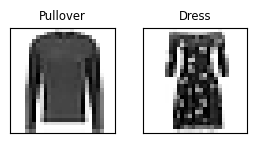

Time=1 | Task ID 1 | 10,200 train | 1,200 validation | 600 test


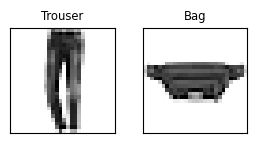

Time=2 | Task ID 2 | 15,300 train | 1,800 validation | 900 test


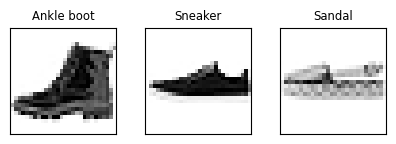

Time=3 | Task ID 3 | 15,300 train | 1,800 validation | 900 test


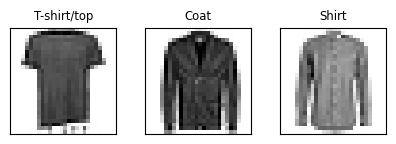

Final test set size (containing all tasks): 3,000

Joint training set size (containing all tasks): 51,000


In [11]:
BATCH_SIZE = 256
task_train, timestep_task_classes, timestep_tasks, task_test_sets = divide_tasks(fmnist, 'fmnist', BATCH_SIZE=BATCH_SIZE)

### BASELINE TRAINING

Training on task id: 0  (classification between: ['Pullover', 'Dress'])


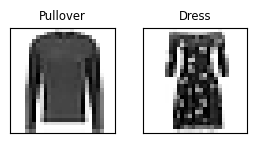

  Adding new task head 0 to multi-task model


E0 batch loss:0.31, batch acc:96.3%: 100%|██████████████████████████| 40/40 [00:02<00:00, 16.08it/s]


epoch:  0 | loss: 0.46 | 0.34   acc: 85.2% | 91.2%


E1 batch loss:0.26, batch acc:95.4%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.91it/s]


epoch:  1 | loss: 0.28 | 0.26   acc: 94.4% | 95.0%


E2 batch loss:0.25, batch acc:94.4%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.11it/s]


epoch:  2 | loss: 0.25 | 0.26   acc: 95.1% | 93.2%


E3 batch loss:0.28, batch acc:90.7%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.56it/s]


epoch:  3 | loss: 0.23 | 0.21   acc: 95.0% | 96.9%


E4 batch loss:0.18, batch acc:97.2%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.66it/s]


epoch:  4 | loss: 0.21 | 0.19   acc: 96.2% | 97.0%


E5 batch loss:0.19, batch acc:95.8%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.62it/s]


epoch:  5 | loss: 0.19 | 0.22   acc: 96.7% | 93.6%


E6 batch loss:0.13, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.58it/s]


epoch:  6 | loss: 0.19 | 0.20   acc: 96.1% | 94.7%


E7 batch loss:0.19, batch acc:95.4%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.27it/s]


epoch:  7 | loss: 0.17 | 0.20   acc: 96.6% | 94.7%


E8 batch loss:0.14, batch acc:97.7%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.47it/s]


epoch:  8 | loss: 0.16 | 0.16   acc: 96.9% | 97.3%


E9 batch loss:0.13, batch acc:98.6%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.57it/s]


epoch:  9 | loss: 0.15 | 0.15   acc: 97.3% | 96.8%


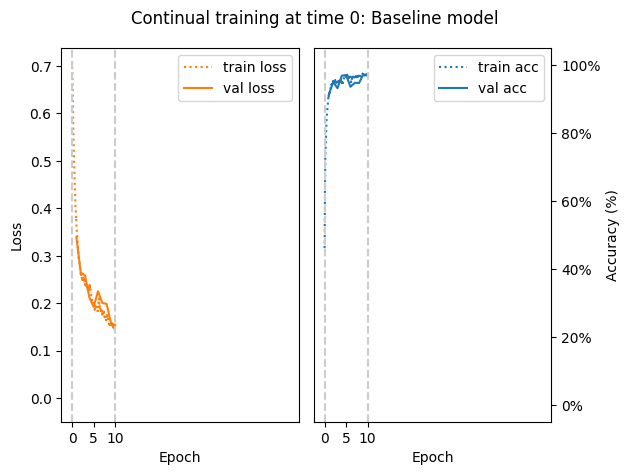

Baseline at t=0 evaluation on test set of all tasks:
['Pullover', 'Dress']: 96.38%

 +++ AVERAGE TASK TEST ACCURACY: 96.38% +++ 


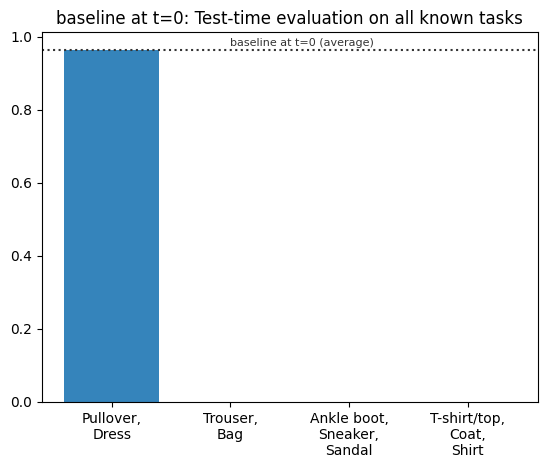

Training on task id: 1  (classification between: ['Trouser', 'Bag'])


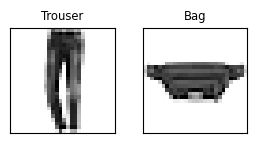

  Adding new task head 1 to multi-task model


E0 batch loss:0.30, batch acc:95.4%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.50it/s]


epoch:  0 | loss: 0.47 | 0.30   acc: 82.5% | 97.1%


E1 batch loss:0.22, batch acc:100.0%: 100%|█████████████████████████| 40/40 [00:01<00:00, 27.47it/s]


epoch:  1 | loss: 0.27 | 0.22   acc: 97.8% | 99.0%


E2 batch loss:0.17, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.52it/s]


epoch:  2 | loss: 0.20 | 0.18   acc: 99.2% | 99.1%


E3 batch loss:0.17, batch acc:98.6%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.44it/s]


epoch:  3 | loss: 0.16 | 0.16   acc: 99.1% | 98.8%


E4 batch loss:0.14, batch acc:100.0%: 100%|█████████████████████████| 40/40 [00:01<00:00, 27.47it/s]


epoch:  4 | loss: 0.15 | 0.14   acc: 99.4% | 99.2%


E5 batch loss:0.15, batch acc:98.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.48it/s]


epoch:  5 | loss: 0.14 | 0.13   acc: 99.3% | 99.2%


E6 batch loss:0.13, batch acc:99.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.32it/s]


epoch:  6 | loss: 0.14 | 0.13   acc: 99.1% | 99.3%


E7 batch loss:0.11, batch acc:100.0%: 100%|█████████████████████████| 40/40 [00:01<00:00, 27.20it/s]


epoch:  7 | loss: 0.12 | 0.12   acc: 99.5% | 99.4%


E8 batch loss:0.14, batch acc:99.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.47it/s]


epoch:  8 | loss: 0.11 | 0.11   acc: 99.5% | 99.3%


E9 batch loss:0.10, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.48it/s]


epoch:  9 | loss: 0.11 | 0.10   acc: 99.5% | 99.6%


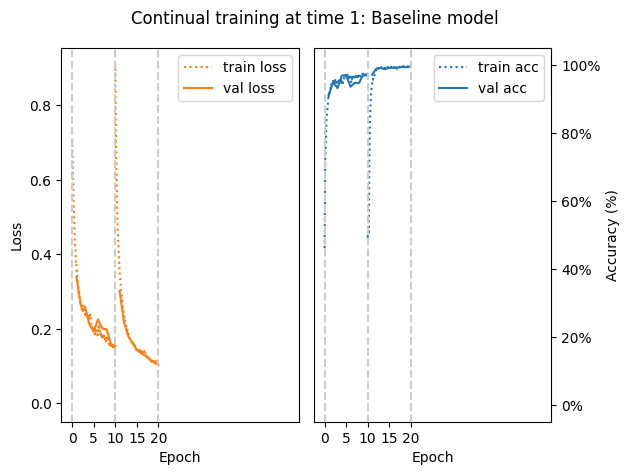

Baseline at t=1 evaluation on test set of all tasks:
['Pullover', 'Dress']: 83.46%
['Trouser', 'Bag']: 99.74%

 +++ AVERAGE TASK TEST ACCURACY: 91.60% +++ 


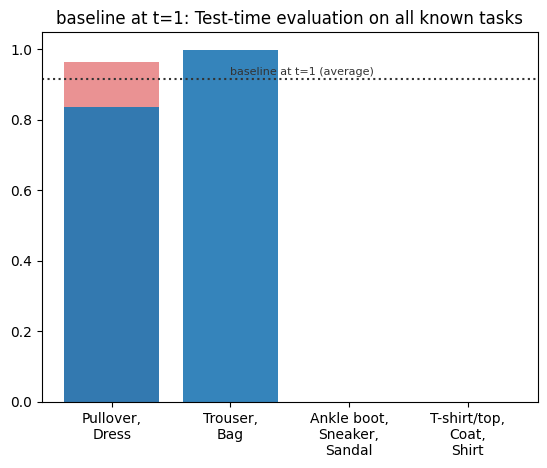

Training on task id: 2  (classification between: ['Ankle boot', 'Sneaker', 'Sandal'])


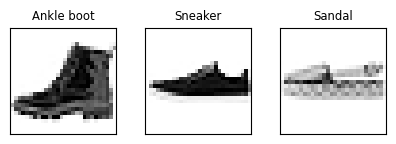

  Adding new task head 2 to multi-task model


E0 batch loss:0.65, batch acc:76.0%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.58it/s]


epoch:  0 | loss: 0.81 | 0.58   acc: 66.5% | 83.0%


E1 batch loss:0.43, batch acc:89.8%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.46it/s]


epoch:  1 | loss: 0.51 | 0.45   acc: 85.0% | 86.9%


E2 batch loss:0.45, batch acc:86.2%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.65it/s]


epoch:  2 | loss: 0.42 | 0.40   acc: 88.0% | 88.5%


E3 batch loss:0.35, batch acc:90.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.64it/s]


epoch:  3 | loss: 0.37 | 0.34   acc: 89.6% | 91.8%


E4 batch loss:0.35, batch acc:88.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.69it/s]


epoch:  4 | loss: 0.34 | 0.31   acc: 90.6% | 92.4%


E5 batch loss:0.28, batch acc:93.4%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.68it/s]


epoch:  5 | loss: 0.31 | 0.26   acc: 91.6% | 94.2%


E6 batch loss:0.25, batch acc:93.4%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.64it/s]


epoch:  6 | loss: 0.28 | 0.27   acc: 92.4% | 93.1%


E7 batch loss:0.25, batch acc:92.9%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.64it/s]


epoch:  7 | loss: 0.27 | 0.30   acc: 92.6% | 91.0%


E8 batch loss:0.28, batch acc:91.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.72it/s]


epoch:  8 | loss: 0.25 | 0.23   acc: 93.3% | 93.8%


E9 batch loss:0.19, batch acc:95.9%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.59it/s]


epoch:  9 | loss: 0.23 | 0.23   acc: 94.0% | 94.2%


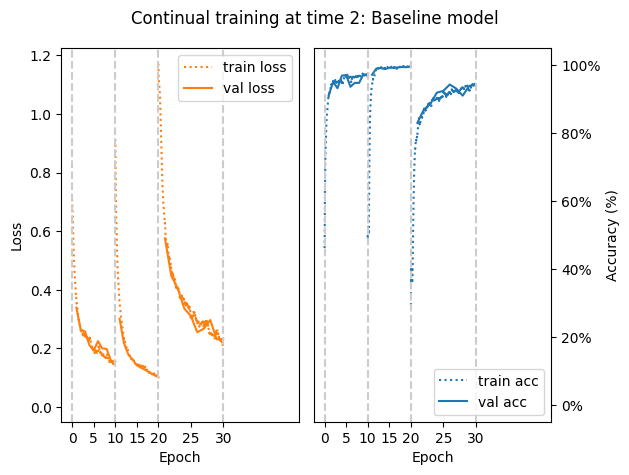

Baseline at t=2 evaluation on test set of all tasks:
['Pullover', 'Dress']: 52.20%
['Trouser', 'Bag']: 47.38%
['Ankle boot', 'Sneaker', 'Sandal']: 93.58%

 +++ AVERAGE TASK TEST ACCURACY: 64.39% +++ 


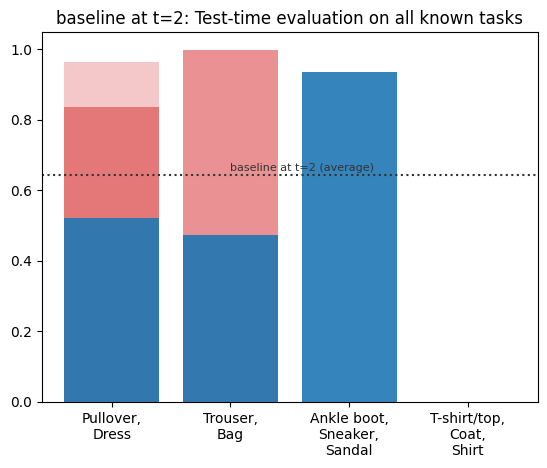

Training on task id: 3  (classification between: ['T-shirt/top', 'Coat', 'Shirt'])


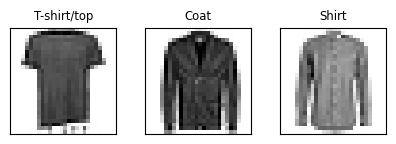

  Adding new task head 3 to multi-task model


E0 batch loss:0.92, batch acc:63.8%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.64it/s]


epoch:  0 | loss: 1.02 | 0.95   acc: 49.4% | 53.5%


E1 batch loss:0.81, batch acc:70.9%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.59it/s]


epoch:  1 | loss: 0.85 | 0.84   acc: 66.3% | 62.7%


E2 batch loss:0.71, batch acc:75.0%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.65it/s]


epoch:  2 | loss: 0.74 | 0.68   acc: 71.6% | 73.9%


E3 batch loss:0.67, batch acc:74.0%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.65it/s]


epoch:  3 | loss: 0.67 | 0.72   acc: 74.2% | 68.3%


E4 batch loss:0.59, batch acc:78.1%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.61it/s]


epoch:  4 | loss: 0.63 | 0.65   acc: 75.8% | 72.3%


E5 batch loss:0.66, batch acc:71.9%: 100%|██████████████████████████| 60/60 [00:02<00:00, 26.21it/s]


epoch:  5 | loss: 0.61 | 0.59   acc: 76.5% | 77.7%


E6 batch loss:0.50, batch acc:81.1%: 100%|██████████████████████████| 60/60 [00:02<00:00, 26.36it/s]


epoch:  6 | loss: 0.58 | 0.56   acc: 77.7% | 77.1%


E7 batch loss:0.59, batch acc:77.0%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.45it/s]


epoch:  7 | loss: 0.56 | 0.57   acc: 78.1% | 75.8%


E8 batch loss:0.57, batch acc:76.5%: 100%|██████████████████████████| 60/60 [00:02<00:00, 27.17it/s]


epoch:  8 | loss: 0.54 | 0.55   acc: 78.3% | 76.5%


E9 batch loss:0.55, batch acc:78.1%: 100%|██████████████████████████| 60/60 [00:02<00:00, 26.97it/s]


epoch:  9 | loss: 0.52 | 0.51   acc: 79.9% | 78.2%


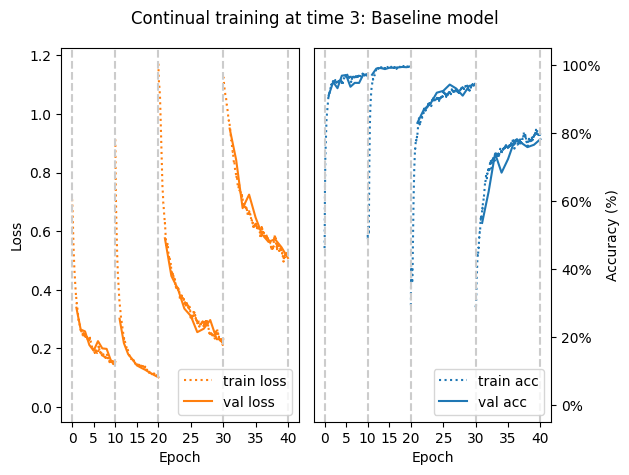

Baseline at t=3 evaluation on test set of all tasks:
['Pullover', 'Dress']: 61.99%
['Trouser', 'Bag']: 46.39%
['Ankle boot', 'Sneaker', 'Sandal']: 37.89%
['T-shirt/top', 'Coat', 'Shirt']: 83.52%

 +++ AVERAGE TASK TEST ACCURACY: 57.45% +++ 


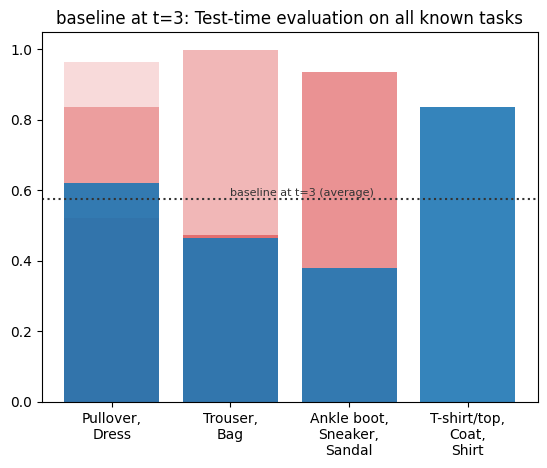


=== Baseline final accuracy averaged over all test tasks: 57.45% ===


In [12]:
INPUT_SIZE = (1, 28, 28)  # for fmnist
baseline_model_training(timestep_tasks, task_test_sets, INPUT_SIZE)


### REPLAYIMPLEMENTATION

Training on task id: 0  (classification between: ['Pullover', 'Dress'])


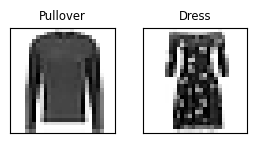

  Adding new task head 0 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: fmnist, Estrategia: descending
Scorer initialized for fmnist
  - Color mode: grayscale
  - Use color HOG: False
  - Device: cuda
Computing features for 10200 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 10200 imágenes


E0 batch loss:0.46, batch acc:100.0%: 100%|█████████████████████████| 40/40 [00:01<00:00, 26.70it/s]


epoch:  0 | loss: 0.66 | 0.66   acc: 64.8% | 60.6%


E1 batch loss:0.35, batch acc:100.0%: 100%|█████████████████████████| 40/40 [00:01<00:00, 27.26it/s]


epoch:  1 | loss: 0.50 | 0.60   acc: 88.3% | 69.9%


E2 batch loss:0.32, batch acc:99.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.72it/s]


epoch:  2 | loss: 0.47 | 0.53   acc: 84.9% | 78.7%


E3 batch loss:0.27, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.69it/s]


epoch:  3 | loss: 0.42 | 0.42   acc: 88.9% | 87.8%


E4 batch loss:0.25, batch acc:98.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.26it/s]


epoch:  4 | loss: 0.39 | 0.38   acc: 89.4% | 89.2%


E5 batch loss:0.23, batch acc:99.1%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.91it/s]


epoch:  5 | loss: 0.36 | 0.34   acc: 90.6% | 92.2%


E6 batch loss:0.22, batch acc:98.6%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.84it/s]


epoch:  6 | loss: 0.34 | 0.35   acc: 91.6% | 89.9%


E7 batch loss:0.20, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.68it/s]


epoch:  7 | loss: 0.33 | 0.32   acc: 91.5% | 92.1%


E8 batch loss:0.19, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 27.20it/s]


epoch:  8 | loss: 0.32 | 0.31   acc: 91.6% | 93.0%


E9 batch loss:0.18, batch acc:99.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 26.95it/s]


epoch:  9 | loss: 0.31 | 0.31   acc: 92.0% | 92.6%


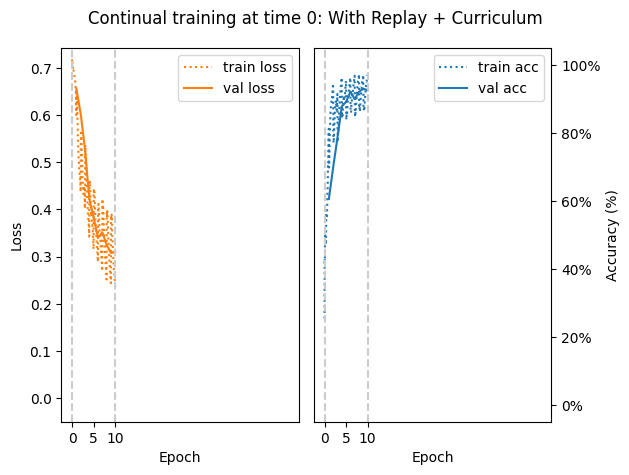

Replay+curriculum at t=0 evaluation on test set of all tasks:
['Pullover', 'Dress']: 89.96%

 +++ AVERAGE TASK TEST ACCURACY: 89.96% +++ 


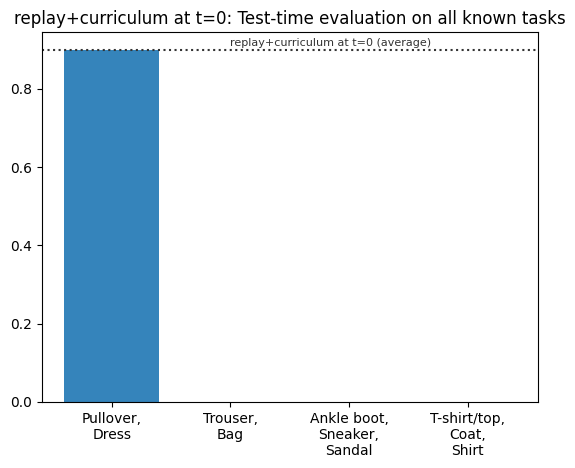

Training on task id: 1  (classification between: ['Trouser', 'Bag'])


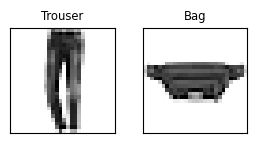

  Adding new task head 1 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: fmnist, Estrategia: descending
Scorer initialized for fmnist
  - Color mode: grayscale
  - Use color HOG: False
  - Device: cuda
Computing features for 10200 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 10200 imágenes


E0 batch loss:0.37, batch acc:91.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 20.17it/s]


epoch:  0 | loss: 0.47 | 0.37   acc: 89.3% | 90.3%


E1 batch loss:0.31, batch acc:92.7%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.89it/s]


epoch:  1 | loss: 0.30 | 0.28   acc: 95.4% | 93.9%


E2 batch loss:0.27, batch acc:93.8%: 100%|██████████████████████████| 40/40 [00:01<00:00, 22.05it/s]


epoch:  2 | loss: 0.24 | 0.21   acc: 97.1% | 96.2%


E3 batch loss:0.22, batch acc:96.5%: 100%|██████████████████████████| 40/40 [00:01<00:00, 22.17it/s]


epoch:  3 | loss: 0.20 | 0.16   acc: 97.8% | 98.7%


E4 batch loss:0.20, batch acc:95.0%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.78it/s]


epoch:  4 | loss: 0.17 | 0.13   acc: 98.0% | 98.9%


E5 batch loss:0.17, batch acc:95.8%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.86it/s]


epoch:  5 | loss: 0.15 | 0.12   acc: 98.3% | 99.1%


E6 batch loss:0.15, batch acc:96.9%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.80it/s]


epoch:  6 | loss: 0.13 | 0.11   acc: 98.6% | 99.1%


E7 batch loss:0.14, batch acc:97.3%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.85it/s]


epoch:  7 | loss: 0.12 | 0.10   acc: 98.6% | 99.1%


E8 batch loss:0.14, batch acc:96.9%: 100%|██████████████████████████| 40/40 [00:01<00:00, 21.93it/s]


epoch:  8 | loss: 0.11 | 0.08   acc: 99.0% | 99.4%


E9 batch loss:0.11, batch acc:98.8%: 100%|██████████████████████████| 40/40 [00:01<00:00, 22.00it/s]


epoch:  9 | loss: 0.11 | 0.08   acc: 98.8% | 99.3%


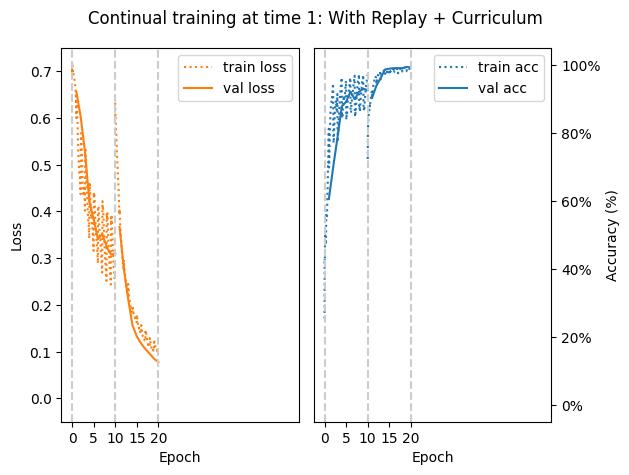

Replay+curriculum at t=1 evaluation on test set of all tasks:
['Pullover', 'Dress']: 93.95%
['Trouser', 'Bag']: 99.74%

 +++ AVERAGE TASK TEST ACCURACY: 96.85% +++ 


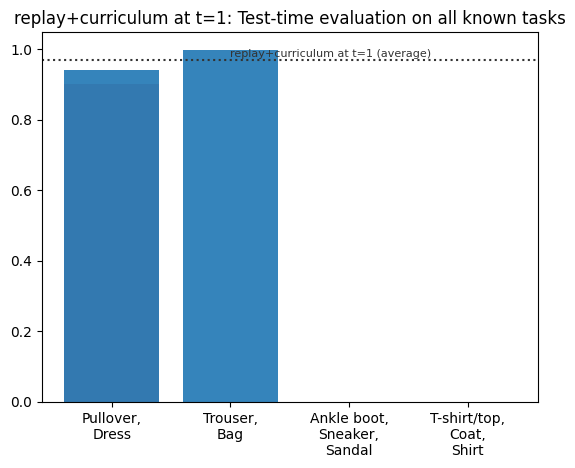

Training on task id: 2  (classification between: ['Ankle boot', 'Sneaker', 'Sandal'])


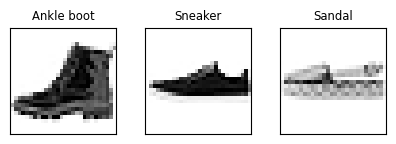

  Adding new task head 2 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: fmnist, Estrategia: descending
Scorer initialized for fmnist
  - Color mode: grayscale
  - Use color HOG: False
  - Device: cuda
Computing features for 15300 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 15300 imágenes


E0 batch loss:0.50, batch acc:97.4%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.77it/s]


epoch:  0 | loss: 0.80 | 0.93   acc: 66.1% | 53.4%


E1 batch loss:0.38, batch acc:98.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.61it/s]


epoch:  1 | loss: 0.64 | 0.68   acc: 80.4% | 75.9%


E2 batch loss:0.28, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.45it/s]


epoch:  2 | loss: 0.51 | 0.56   acc: 85.6% | 85.0%


E3 batch loss:0.24, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.59it/s]


epoch:  3 | loss: 0.45 | 0.54   acc: 87.2% | 82.0%


E4 batch loss:0.22, batch acc:98.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.28it/s]


epoch:  4 | loss: 0.41 | 0.46   acc: 88.3% | 87.2%


E5 batch loss:0.20, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.12it/s]


epoch:  5 | loss: 0.37 | 0.44   acc: 89.6% | 87.4%


E6 batch loss:0.19, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.39it/s]


epoch:  6 | loss: 0.34 | 0.44   acc: 90.3% | 85.5%


E7 batch loss:0.18, batch acc:98.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.09it/s]


epoch:  7 | loss: 0.33 | 0.34   acc: 90.2% | 91.2%


E8 batch loss:0.16, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.67it/s]


epoch:  8 | loss: 0.32 | 0.35   acc: 90.9% | 88.2%


E9 batch loss:0.16, batch acc:98.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.53it/s]


epoch:  9 | loss: 0.29 | 0.31   acc: 91.8% | 91.0%


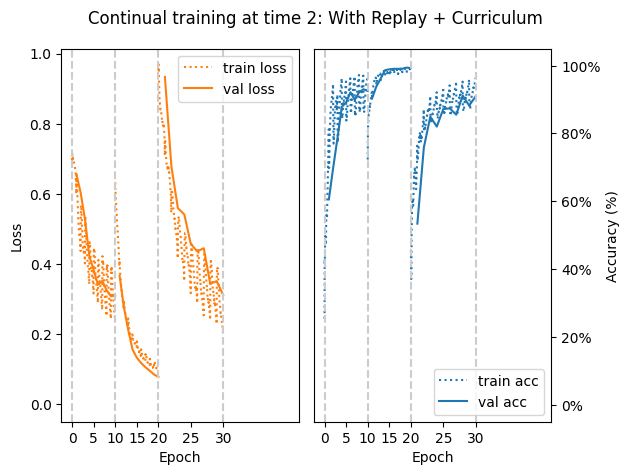

Replay+curriculum at t=2 evaluation on test set of all tasks:
['Pullover', 'Dress']: 95.86%
['Trouser', 'Bag']: 98.47%
['Ankle boot', 'Sneaker', 'Sandal']: 88.37%

 +++ AVERAGE TASK TEST ACCURACY: 94.23% +++ 


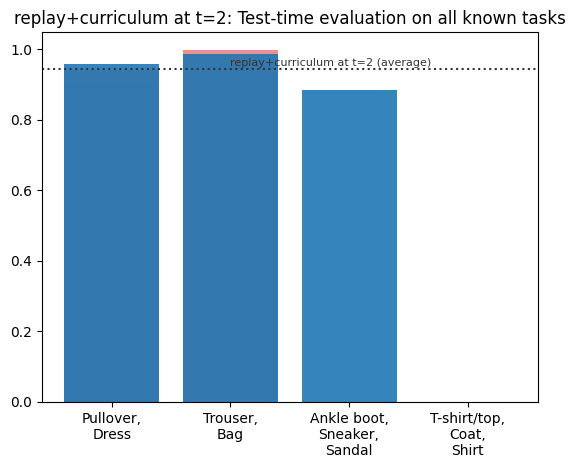

Training on task id: 3  (classification between: ['T-shirt/top', 'Coat', 'Shirt'])


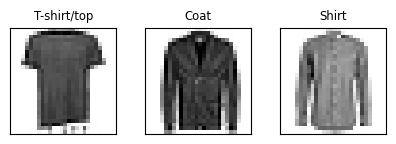

  Adding new task head 3 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: fmnist, Estrategia: descending
Scorer initialized for fmnist
  - Color mode: grayscale
  - Use color HOG: False
  - Device: cuda
Computing features for 15300 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 15300 imágenes


E0 batch loss:0.57, batch acc:91.1%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.43it/s]


epoch:  0 | loss: 0.86 | 0.94   acc: 59.2% | 56.9%


E1 batch loss:0.51, batch acc:92.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.82it/s]


epoch:  1 | loss: 0.79 | 0.88   acc: 65.0% | 62.0%


E2 batch loss:0.47, batch acc:94.5%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.51it/s]


epoch:  2 | loss: 0.75 | 0.84   acc: 67.8% | 63.7%


E3 batch loss:0.42, batch acc:93.2%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.22it/s]


epoch:  3 | loss: 0.72 | 0.79   acc: 69.7% | 67.1%


E4 batch loss:0.39, batch acc:93.6%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.29it/s]


epoch:  4 | loss: 0.67 | 0.75   acc: 73.1% | 68.7%


E5 batch loss:0.39, batch acc:94.9%: 100%|██████████████████████████| 60/60 [00:02<00:00, 21.03it/s]


epoch:  5 | loss: 0.66 | 0.79   acc: 73.4% | 65.6%


E6 batch loss:0.35, batch acc:94.5%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.47it/s]


epoch:  6 | loss: 0.64 | 0.79   acc: 74.4% | 64.8%


E7 batch loss:0.34, batch acc:94.0%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.18it/s]


epoch:  7 | loss: 0.62 | 0.75   acc: 75.4% | 66.9%


E8 batch loss:0.33, batch acc:95.3%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.49it/s]


epoch:  8 | loss: 0.60 | 0.70   acc: 76.1% | 70.4%


E9 batch loss:0.31, batch acc:95.7%: 100%|██████████████████████████| 60/60 [00:02<00:00, 20.98it/s]


epoch:  9 | loss: 0.57 | 0.75   acc: 77.5% | 66.7%


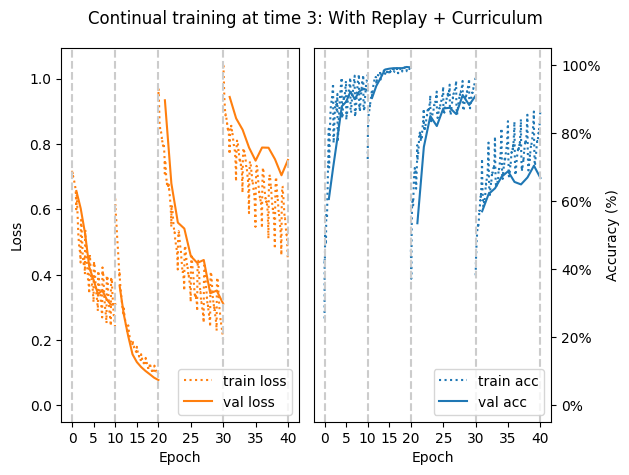

Replay+curriculum at t=3 evaluation on test set of all tasks:
['Pullover', 'Dress']: 94.99%
['Trouser', 'Bag']: 98.85%
['Ankle boot', 'Sneaker', 'Sandal']: 90.99%
['T-shirt/top', 'Coat', 'Shirt']: 70.85%

 +++ AVERAGE TASK TEST ACCURACY: 88.92% +++ 


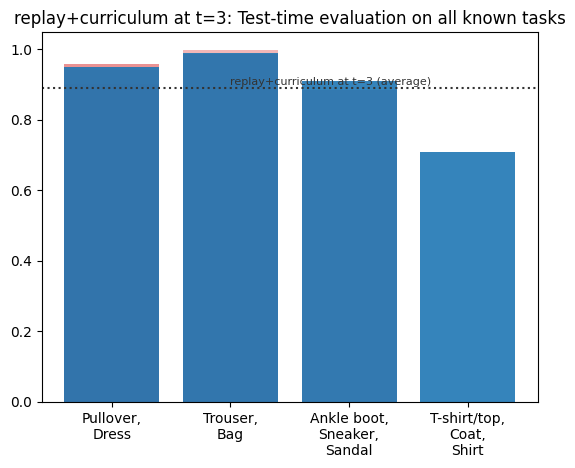

(MultitaskModel(
   (backbone): Conv4Backbone(
     (conv_stack): Sequential(
       (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (1): GroupNorm(8, 32, eps=1e-05, affine=True)
       (2): ReLU()
       (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (4): GroupNorm(16, 64, eps=1e-05, affine=True)
       (5): ReLU()
       (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (7): GroupNorm(16, 64, eps=1e-05, affine=True)
       (8): ReLU()
       (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (10): GroupNorm(32, 128, eps=1e-05, affine=True)
       (11): ReLU()
     )
     (pool): AdaptiveAvgPool2d(output_size=(1, 1))
     (relu): ReLU()
   )
   (task_heads): ModuleDict(
     (0): TaskHead(
       (projection): Linear(in_features=128, out_features=64, bias=True)
       (classifier): Linear(in_features=64, out_features=2, bias=True)
       (dropout): Identity()
       (relu): ReLU

In [13]:
INPUT_SIZE = (1, 28, 28)  # for fmnist
replay_model_training(timestep_tasks, task_test_sets, INPUT_SIZE, BATCH_SIZE, curriculum_strategy="descending")

## CIFAR-10

### DATA PREPARATION

Time=0 | Task ID 0 | 8,500 train | 1,000 validation | 500 test


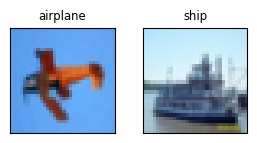

Time=1 | Task ID 1 | 8,500 train | 1,000 validation | 500 test


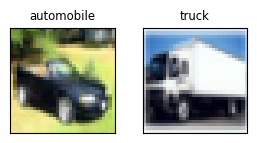

Time=2 | Task ID 2 | 12,750 train | 1,500 validation | 750 test


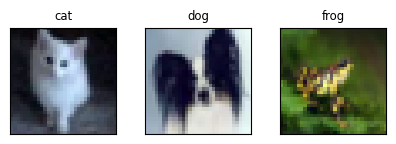

Time=3 | Task ID 3 | 12,750 train | 1,500 validation | 750 test


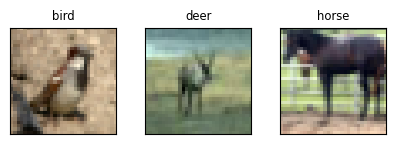

Final test set size (containing all tasks): 2,500

Joint training set size (containing all tasks): 42,500


In [14]:
BATCH_SIZE = 256
task_train, timestep_task_classes, timestep_tasks, task_test_sets = divide_tasks(cifar10, 'cifar-10', BATCH_SIZE=BATCH_SIZE)

### BASELINE MODEL

Training on task id: 0  (classification between: ['airplane', 'ship'])


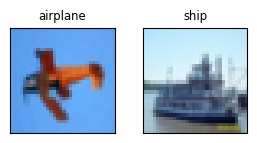

  Adding new task head 0 to multi-task model


E0 batch loss:0.61, batch acc:75.0%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.09it/s]


epoch:  0 | loss: 0.67 | 0.62   acc: 61.7% | 68.8%


E1 batch loss:0.55, batch acc:78.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.62it/s]


epoch:  1 | loss: 0.60 | 0.56   acc: 70.1% | 76.3%


E2 batch loss:0.58, batch acc:67.3%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.95it/s]


epoch:  2 | loss: 0.54 | 0.53   acc: 75.4% | 75.5%


E3 batch loss:0.55, batch acc:71.2%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.51it/s]


epoch:  3 | loss: 0.51 | 0.53   acc: 77.3% | 75.5%


E4 batch loss:0.49, batch acc:80.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.84it/s]


epoch:  4 | loss: 0.49 | 0.49   acc: 79.5% | 78.8%


E5 batch loss:0.47, batch acc:82.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.06it/s]


epoch:  5 | loss: 0.47 | 0.47   acc: 79.9% | 79.2%


E6 batch loss:0.43, batch acc:80.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.46it/s]


epoch:  6 | loss: 0.45 | 0.44   acc: 80.8% | 82.5%


E7 batch loss:0.48, batch acc:84.6%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.44it/s]


epoch:  7 | loss: 0.43 | 0.45   acc: 83.3% | 81.1%


E8 batch loss:0.42, batch acc:82.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 21.77it/s]


epoch:  8 | loss: 0.42 | 0.46   acc: 83.5% | 79.0%


E9 batch loss:0.52, batch acc:71.2%: 100%|██████████████████████████| 34/34 [00:01<00:00, 23.05it/s]


epoch:  9 | loss: 0.42 | 0.46   acc: 83.2% | 79.7%


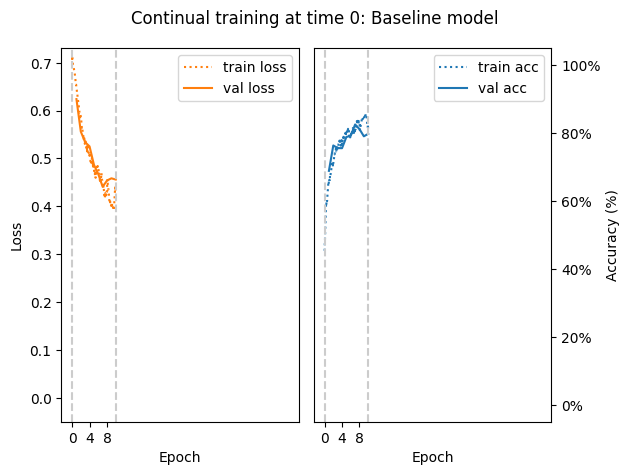

Baseline at t=0 evaluation on test set of all tasks:
['airplane', 'ship']: 80.98%

 +++ AVERAGE TASK TEST ACCURACY: 80.98% +++ 


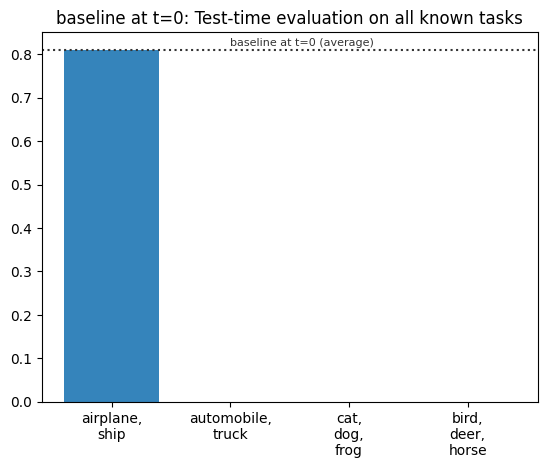

Training on task id: 1  (classification between: ['automobile', 'truck'])


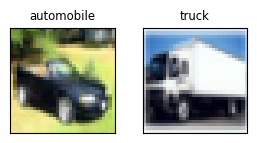

  Adding new task head 1 to multi-task model


E0 batch loss:0.64, batch acc:73.1%: 100%|██████████████████████████| 34/34 [00:01<00:00, 23.19it/s]


epoch:  0 | loss: 0.69 | 0.67   acc: 54.2% | 59.4%


E1 batch loss:0.64, batch acc:67.3%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.81it/s]


epoch:  1 | loss: 0.65 | 0.62   acc: 63.2% | 69.3%


E2 batch loss:0.56, batch acc:75.0%: 100%|██████████████████████████| 34/34 [00:01<00:00, 23.35it/s]


epoch:  2 | loss: 0.60 | 0.57   acc: 69.9% | 72.9%


E3 batch loss:0.58, batch acc:71.2%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.93it/s]


epoch:  3 | loss: 0.57 | 0.60   acc: 73.1% | 68.5%


E4 batch loss:0.54, batch acc:84.6%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.91it/s]


epoch:  4 | loss: 0.56 | 0.55   acc: 72.6% | 74.2%


E5 batch loss:0.48, batch acc:78.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.84it/s]


epoch:  5 | loss: 0.52 | 0.56   acc: 76.5% | 71.7%


E6 batch loss:0.52, batch acc:76.9%: 100%|██████████████████████████| 34/34 [00:01<00:00, 23.23it/s]


epoch:  6 | loss: 0.50 | 0.49   acc: 77.3% | 76.7%


E7 batch loss:0.47, batch acc:80.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.85it/s]


epoch:  7 | loss: 0.47 | 0.46   acc: 79.2% | 79.5%


E8 batch loss:0.45, batch acc:76.9%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.91it/s]


epoch:  8 | loss: 0.48 | 0.58   acc: 78.4% | 70.3%


E9 batch loss:0.45, batch acc:76.9%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.91it/s]


epoch:  9 | loss: 0.50 | 0.54   acc: 76.6% | 72.8%


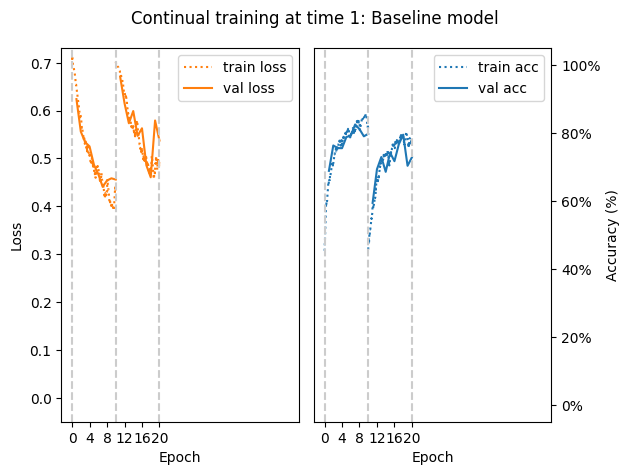

Baseline at t=1 evaluation on test set of all tasks:
['airplane', 'ship']: 58.36%
['automobile', 'truck']: 70.78%

 +++ AVERAGE TASK TEST ACCURACY: 64.57% +++ 


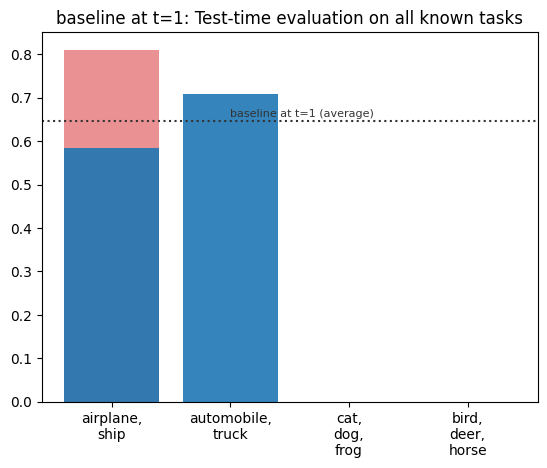

Training on task id: 2  (classification between: ['cat', 'dog', 'frog'])


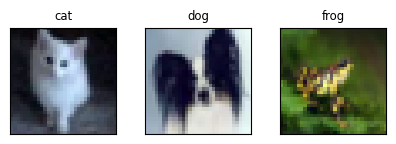

  Adding new task head 2 to multi-task model


E0 batch loss:1.02, batch acc:40.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.48it/s]


epoch:  0 | loss: 1.07 | 1.01   acc: 43.9% | 49.0%


E1 batch loss:0.95, batch acc:48.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.41it/s]


epoch:  1 | loss: 0.96 | 0.93   acc: 51.3% | 48.8%


E2 batch loss:0.90, batch acc:56.8%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.59it/s]


epoch:  2 | loss: 0.90 | 0.88   acc: 54.5% | 58.5%


E3 batch loss:0.82, batch acc:59.7%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.46it/s]


epoch:  3 | loss: 0.86 | 0.85   acc: 58.9% | 62.1%


E4 batch loss:0.83, batch acc:62.1%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.54it/s]


epoch:  4 | loss: 0.82 | 0.82   acc: 61.9% | 62.0%


E5 batch loss:0.79, batch acc:62.6%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.23it/s]


epoch:  5 | loss: 0.80 | 0.79   acc: 63.7% | 64.6%


E6 batch loss:0.84, batch acc:58.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.55it/s]


epoch:  6 | loss: 0.79 | 0.81   acc: 63.3% | 62.0%


E7 batch loss:0.76, batch acc:65.0%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.58it/s]


epoch:  7 | loss: 0.76 | 0.77   acc: 65.1% | 65.6%


E8 batch loss:0.75, batch acc:66.0%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.57it/s]


epoch:  8 | loss: 0.76 | 0.77   acc: 64.7% | 64.7%


E9 batch loss:0.69, batch acc:66.0%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.29it/s]


epoch:  9 | loss: 0.73 | 0.75   acc: 66.4% | 66.9%


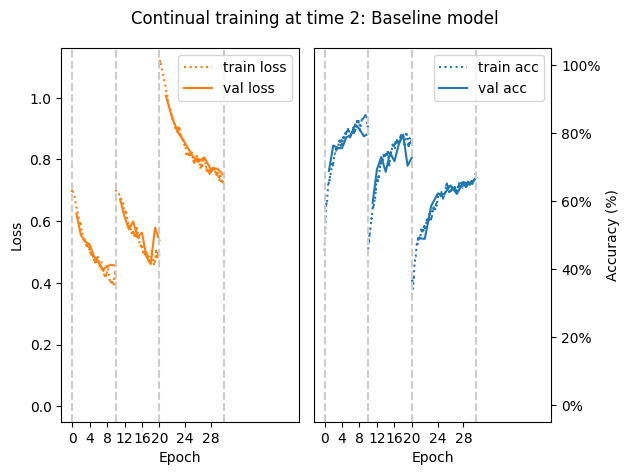

Baseline at t=2 evaluation on test set of all tasks:
['airplane', 'ship']: 57.20%
['automobile', 'truck']: 56.95%
['cat', 'dog', 'frog']: 66.13%

 +++ AVERAGE TASK TEST ACCURACY: 60.09% +++ 


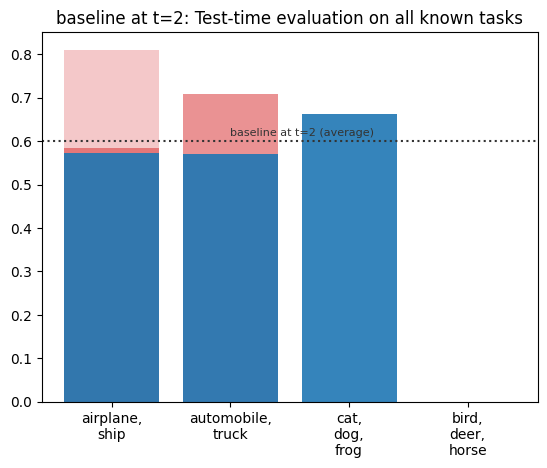

Training on task id: 3  (classification between: ['bird', 'deer', 'horse'])


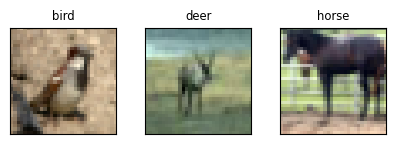

  Adding new task head 3 to multi-task model


E0 batch loss:0.96, batch acc:52.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.54it/s]


epoch:  0 | loss: 1.01 | 0.93   acc: 50.5% | 54.9%


E1 batch loss:0.86, batch acc:64.1%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.40it/s]


epoch:  1 | loss: 0.91 | 0.90   acc: 58.2% | 61.4%


E2 batch loss:0.83, batch acc:65.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.45it/s]


epoch:  2 | loss: 0.87 | 0.85   acc: 62.1% | 62.7%


E3 batch loss:0.77, batch acc:68.0%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.57it/s]


epoch:  3 | loss: 0.83 | 0.80   acc: 64.3% | 65.9%


E4 batch loss:0.79, batch acc:69.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.52it/s]


epoch:  4 | loss: 0.80 | 0.77   acc: 66.6% | 66.3%


E5 batch loss:0.78, batch acc:65.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.49it/s]


epoch:  5 | loss: 0.75 | 0.75   acc: 69.8% | 68.8%


E6 batch loss:0.76, batch acc:66.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.74it/s]


epoch:  6 | loss: 0.72 | 0.77   acc: 70.3% | 68.3%


E7 batch loss:0.66, batch acc:73.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.46it/s]


epoch:  7 | loss: 0.71 | 0.71   acc: 70.9% | 70.1%


E8 batch loss:0.64, batch acc:74.8%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.78it/s]


epoch:  8 | loss: 0.68 | 0.68   acc: 72.2% | 72.5%


E9 batch loss:0.66, batch acc:75.2%: 100%|██████████████████████████| 50/50 [00:02<00:00, 22.54it/s]


epoch:  9 | loss: 0.70 | 0.65   acc: 71.1% | 73.9%


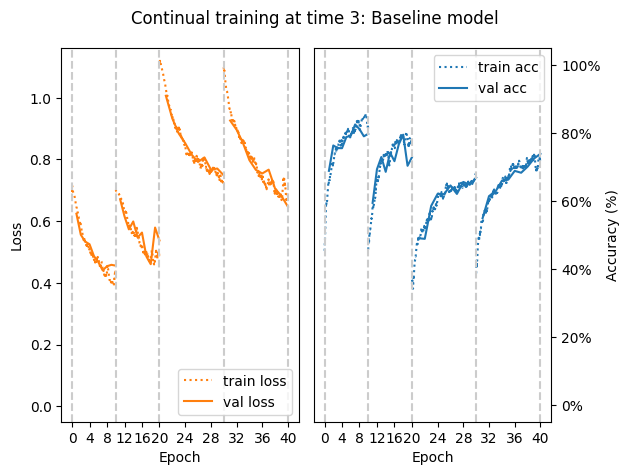

Baseline at t=3 evaluation on test set of all tasks:
['airplane', 'ship']: 38.56%
['automobile', 'truck']: 46.98%
['cat', 'dog', 'frog']: 34.59%
['bird', 'deer', 'horse']: 72.77%

 +++ AVERAGE TASK TEST ACCURACY: 48.23% +++ 


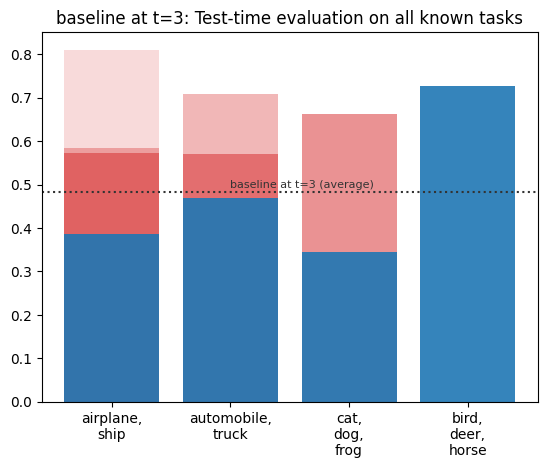


=== Baseline final accuracy averaged over all test tasks: 48.23% ===


In [15]:
INPUT_SIZE = (3,32,32)  # for cifar
baseline_model_training(timestep_tasks, task_test_sets, INPUT_SIZE)

### REPLAY IMPLEMENTATION

Training on task id: 0  (classification between: ['airplane', 'ship'])


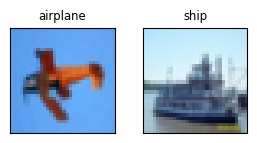

  Adding new task head 0 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar10, Estrategia: descending
Scorer initialized for cifar10
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 8500 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 8500 imágenes


E0 batch loss:0.50, batch acc:86.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.56it/s]


epoch:  0 | loss: 0.67 | 0.73   acc: 58.4% | 49.3%


E1 batch loss:0.77, batch acc: 3.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.69it/s]


epoch:  1 | loss: 0.71 | 0.69   acc: 47.8% | 50.8%


E2 batch loss:0.70, batch acc:32.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.77it/s]


epoch:  2 | loss: 0.70 | 0.69   acc: 43.3% | 58.5%


E3 batch loss:0.67, batch acc:86.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.74it/s]


epoch:  3 | loss: 0.69 | 0.69   acc: 50.7% | 64.0%


E4 batch loss:0.67, batch acc:75.0%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.72it/s]


epoch:  4 | loss: 0.69 | 0.69   acc: 52.2% | 59.5%


E5 batch loss:0.63, batch acc:90.4%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.60it/s]


epoch:  5 | loss: 0.69 | 0.68   acc: 54.8% | 63.2%


E6 batch loss:0.61, batch acc:80.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.74it/s]


epoch:  6 | loss: 0.68 | 0.67   acc: 55.9% | 60.9%


E7 batch loss:0.58, batch acc:80.8%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.29it/s]


epoch:  7 | loss: 0.68 | 0.67   acc: 57.5% | 60.8%


E8 batch loss:0.54, batch acc:82.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.66it/s]


epoch:  8 | loss: 0.67 | 0.66   acc: 59.5% | 61.2%


E9 batch loss:0.53, batch acc:82.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 22.63it/s]


epoch:  9 | loss: 0.67 | 0.66   acc: 59.4% | 61.5%


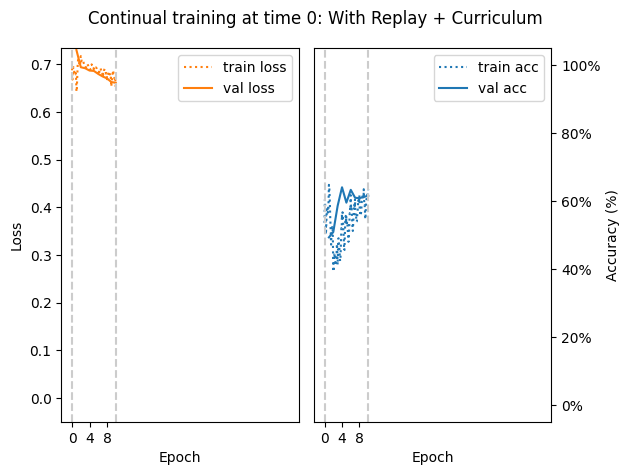

Replay+curriculum at t=0 evaluation on test set of all tasks:
['airplane', 'ship']: 58.23%

 +++ AVERAGE TASK TEST ACCURACY: 58.23% +++ 


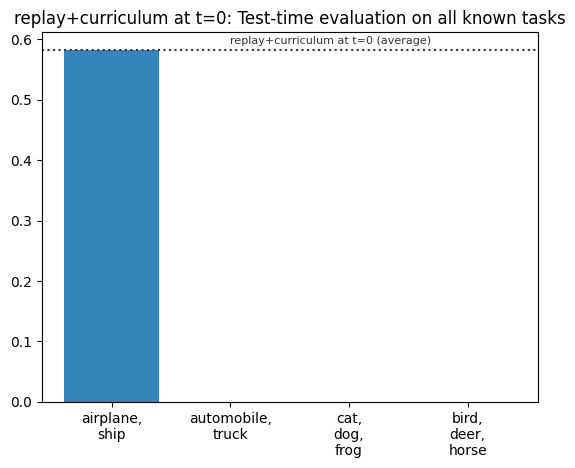

Training on task id: 1  (classification between: ['automobile', 'truck'])


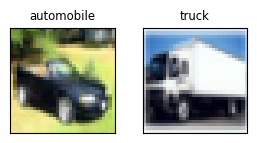

  Adding new task head 1 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar10, Estrategia: descending
Scorer initialized for cifar10
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 8500 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 8500 imágenes


E0 batch loss:0.69, batch acc:35.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 17.98it/s]


epoch:  0 | loss: 0.69 | 0.69   acc: 51.3% | 53.3%


E1 batch loss:0.67, batch acc:79.0%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.34it/s]


epoch:  1 | loss: 0.68 | 0.69   acc: 52.3% | 51.9%


E2 batch loss:0.64, batch acc:87.1%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.27it/s]


epoch:  2 | loss: 0.68 | 0.69   acc: 52.6% | 52.3%


E3 batch loss:0.67, batch acc:56.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.05it/s]


epoch:  3 | loss: 0.68 | 0.69   acc: 50.0% | 52.4%


E4 batch loss:0.66, batch acc:67.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.21it/s]


epoch:  4 | loss: 0.67 | 0.69   acc: 53.3% | 53.0%


E5 batch loss:0.66, batch acc:85.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 17.97it/s]


epoch:  5 | loss: 0.67 | 0.69   acc: 53.9% | 53.4%


E6 batch loss:0.65, batch acc:83.9%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.55it/s]


epoch:  6 | loss: 0.66 | 0.69   acc: 55.9% | 52.3%


E7 batch loss:0.60, batch acc:88.7%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.04it/s]


epoch:  7 | loss: 0.65 | 0.68   acc: 57.7% | 52.4%


E8 batch loss:0.54, batch acc:90.3%: 100%|██████████████████████████| 34/34 [00:01<00:00, 17.70it/s]


epoch:  8 | loss: 0.63 | 0.68   acc: 60.3% | 52.5%


E9 batch loss:0.54, batch acc:85.5%: 100%|██████████████████████████| 34/34 [00:01<00:00, 18.49it/s]


epoch:  9 | loss: 0.62 | 0.68   acc: 61.9% | 57.0%


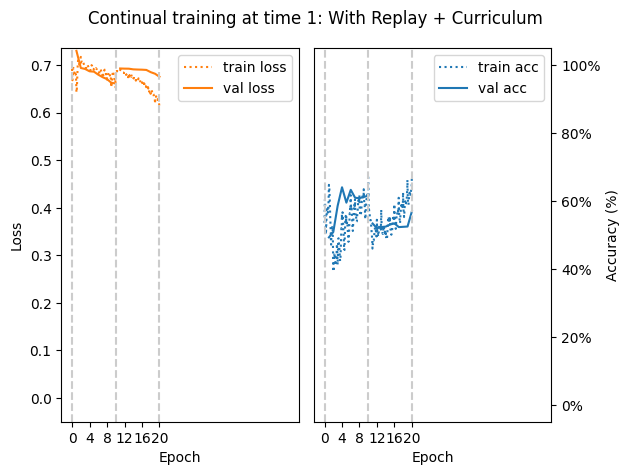

Replay+curriculum at t=1 evaluation on test set of all tasks:
['airplane', 'ship']: 68.45%
['automobile', 'truck']: 50.54%

 +++ AVERAGE TASK TEST ACCURACY: 59.50% +++ 


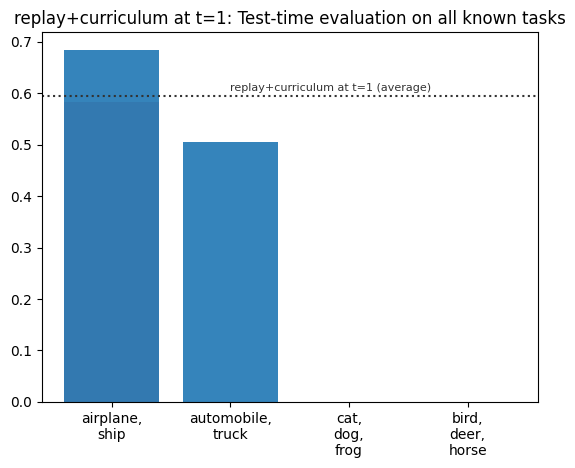

Training on task id: 2  (classification between: ['cat', 'dog', 'frog'])


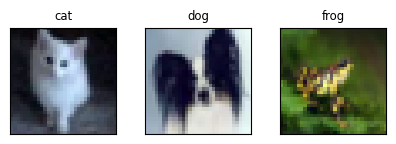

  Adding new task head 2 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar10, Estrategia: descending
Scorer initialized for cifar10
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 12750 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 12750 imágenes


E0 batch loss:0.98, batch acc:55.1%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.55it/s]


epoch:  0 | loss: 0.99 | 1.07   acc: 45.0% | 42.5%


E1 batch loss:0.96, batch acc:57.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.85it/s]


epoch:  1 | loss: 0.97 | 1.07   acc: 50.2% | 40.9%


E2 batch loss:0.96, batch acc:53.4%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.73it/s]


epoch:  2 | loss: 0.95 | 1.06   acc: 51.1% | 42.5%


E3 batch loss:0.93, batch acc:59.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.36it/s]


epoch:  3 | loss: 0.93 | 1.04   acc: 53.8% | 45.0%


E4 batch loss:0.91, batch acc:59.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 18.13it/s]


epoch:  4 | loss: 0.91 | 1.05   acc: 55.3% | 43.4%


E5 batch loss:0.90, batch acc:59.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.51it/s]


epoch:  5 | loss: 0.90 | 1.03   acc: 55.7% | 45.4%


E6 batch loss:0.93, batch acc:54.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.75it/s]


epoch:  6 | loss: 0.89 | 1.01   acc: 56.1% | 47.5%


E7 batch loss:0.94, batch acc:55.1%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.79it/s]


epoch:  7 | loss: 0.89 | 1.07   acc: 56.2% | 40.6%


E8 batch loss:0.91, batch acc:55.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.75it/s]


epoch:  8 | loss: 0.89 | 1.04   acc: 55.4% | 45.5%


E9 batch loss:0.88, batch acc:62.8%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.70it/s]


epoch:  9 | loss: 0.87 | 1.01   acc: 58.0% | 47.1%


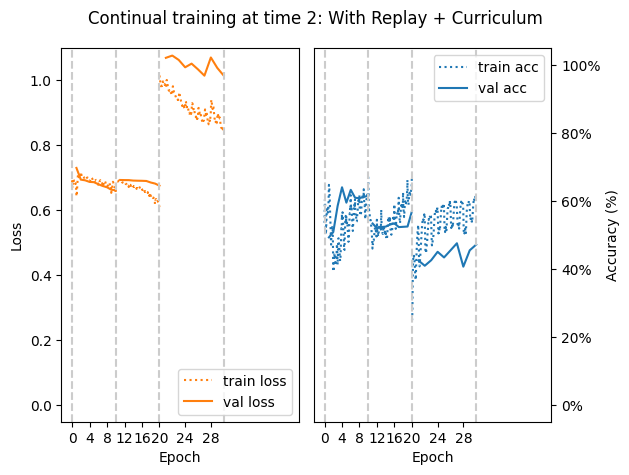

Replay+curriculum at t=2 evaluation on test set of all tasks:
['airplane', 'ship']: 72.38%
['automobile', 'truck']: 65.57%
['cat', 'dog', 'frog']: 47.30%

 +++ AVERAGE TASK TEST ACCURACY: 61.75% +++ 


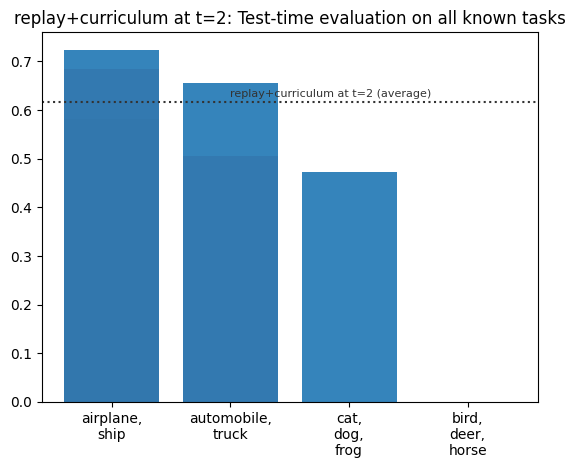

Training on task id: 3  (classification between: ['bird', 'deer', 'horse'])


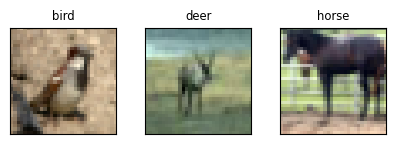

  Adding new task head 3 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar10, Estrategia: descending
Scorer initialized for cifar10
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 12750 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 12750 imágenes


E0 batch loss:0.99, batch acc:40.1%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.17it/s]


epoch:  0 | loss: 1.00 | 1.08   acc: 43.1% | 40.5%


E1 batch loss:0.95, batch acc:58.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.25it/s]


epoch:  1 | loss: 0.98 | 1.05   acc: 49.8% | 50.8%


E2 batch loss:0.88, batch acc:69.2%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.90it/s]


epoch:  2 | loss: 0.95 | 1.07   acc: 53.3% | 37.2%


E3 batch loss:0.86, batch acc:69.2%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.41it/s]


epoch:  3 | loss: 0.94 | 1.03   acc: 54.6% | 49.3%


E4 batch loss:0.81, batch acc:71.3%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.61it/s]


epoch:  4 | loss: 0.93 | 1.01   acc: 55.5% | 47.7%


E5 batch loss:0.79, batch acc:76.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.31it/s]


epoch:  5 | loss: 0.92 | 1.01   acc: 56.5% | 45.9%


E6 batch loss:0.80, batch acc:72.5%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.81it/s]


epoch:  6 | loss: 0.91 | 1.01   acc: 57.1% | 44.8%


E7 batch loss:0.78, batch acc:70.9%: 100%|██████████████████████████| 50/50 [00:02<00:00, 18.25it/s]


epoch:  7 | loss: 0.90 | 0.99   acc: 58.4% | 50.7%


E8 batch loss:0.77, batch acc:73.7%: 100%|██████████████████████████| 50/50 [00:02<00:00, 17.37it/s]


epoch:  8 | loss: 0.89 | 1.00   acc: 58.2% | 49.9%


E9 batch loss:0.74, batch acc:71.7%: 100%|██████████████████████████| 50/50 [00:03<00:00, 16.21it/s]


epoch:  9 | loss: 0.88 | 0.98   acc: 59.4% | 50.8%


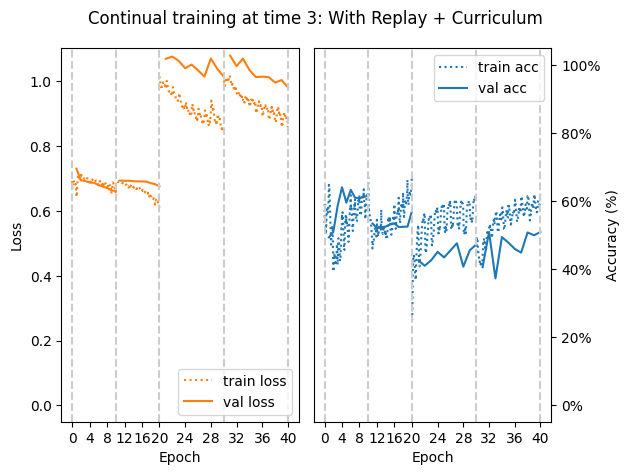

Replay+curriculum at t=3 evaluation on test set of all tasks:
['airplane', 'ship']: 71.19%
['automobile', 'truck']: 69.54%
['cat', 'dog', 'frog']: 52.30%
['bird', 'deer', 'horse']: 51.21%

 +++ AVERAGE TASK TEST ACCURACY: 61.06% +++ 


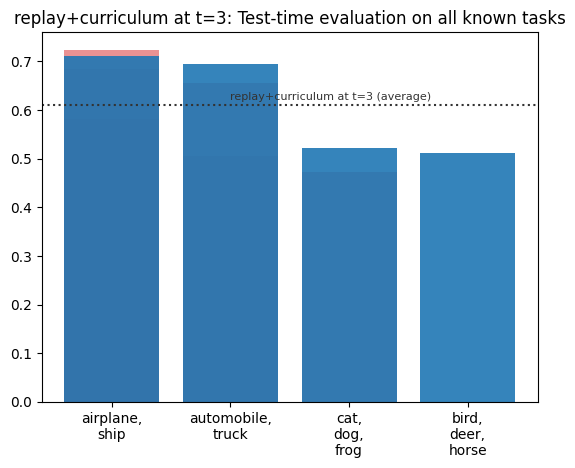

(MultitaskModel(
   (backbone): Conv4Backbone(
     (conv_stack): Sequential(
       (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (1): GroupNorm(8, 32, eps=1e-05, affine=True)
       (2): ReLU()
       (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (4): GroupNorm(16, 64, eps=1e-05, affine=True)
       (5): ReLU()
       (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (7): GroupNorm(16, 64, eps=1e-05, affine=True)
       (8): ReLU()
       (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (10): GroupNorm(32, 128, eps=1e-05, affine=True)
       (11): ReLU()
     )
     (pool): AdaptiveAvgPool2d(output_size=(1, 1))
     (relu): ReLU()
   )
   (task_heads): ModuleDict(
     (0): TaskHead(
       (projection): Linear(in_features=128, out_features=64, bias=True)
       (classifier): Linear(in_features=64, out_features=2, bias=True)
       (dropout): Identity()
       (relu): ReLU

In [16]:
INPUT_SIZE = (3,32,32)  # for cifar
replay_model_training(timestep_tasks, task_test_sets, INPUT_SIZE, BATCH_SIZE, dataset_name='cifar10', curriculum_strategy="descending")

## CIFAR-100

Time=0 | Task ID 0 | 2,125 train | 250 validation | 125 test


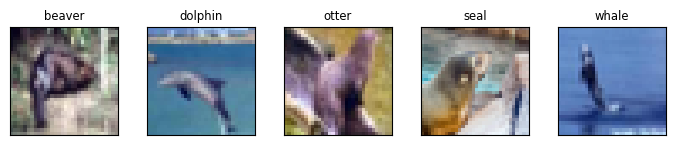

Time=1 | Task ID 1 | 2,125 train | 250 validation | 125 test


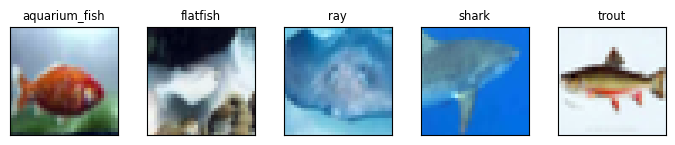

Time=2 | Task ID 2 | 2,125 train | 250 validation | 125 test


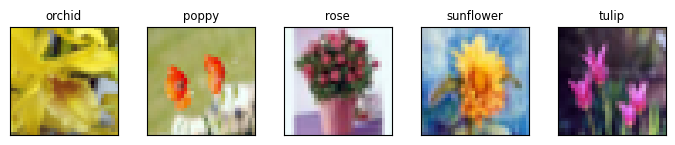

Time=3 | Task ID 3 | 2,125 train | 250 validation | 125 test


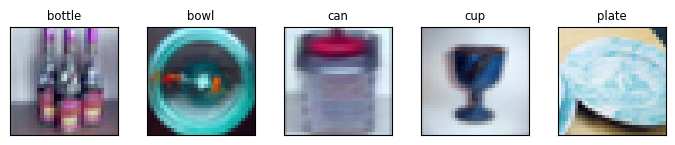

Time=4 | Task ID 4 | 2,125 train | 250 validation | 125 test


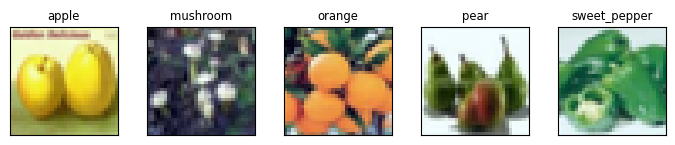

Time=5 | Task ID 5 | 2,125 train | 250 validation | 125 test


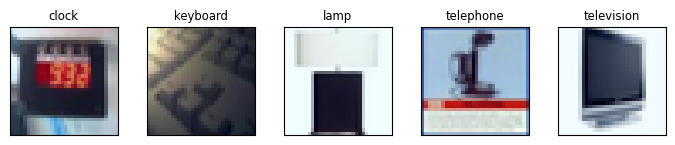

Time=6 | Task ID 6 | 2,125 train | 250 validation | 125 test


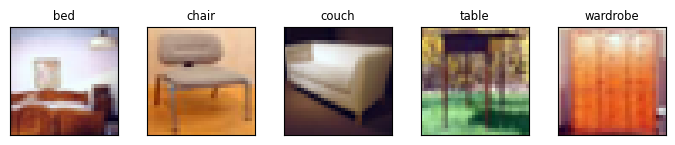

Time=7 | Task ID 7 | 2,125 train | 250 validation | 125 test


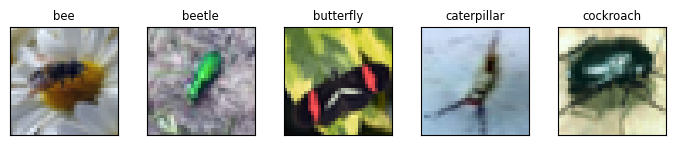

Time=8 | Task ID 8 | 2,125 train | 250 validation | 125 test


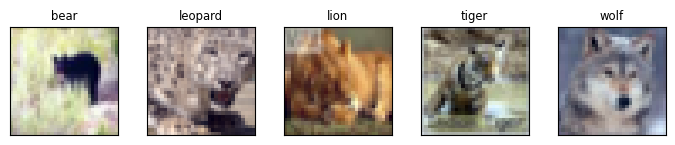

Time=9 | Task ID 9 | 2,125 train | 250 validation | 125 test


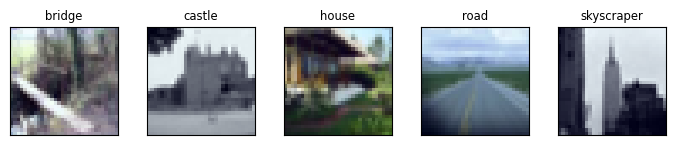

Time=10 | Task ID 10 | 2,125 train | 250 validation | 125 test


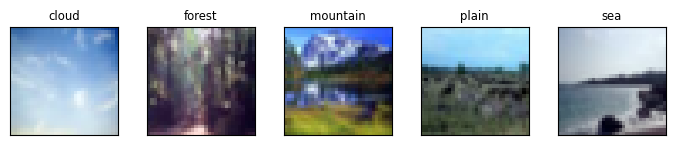

Time=11 | Task ID 11 | 2,125 train | 250 validation | 125 test


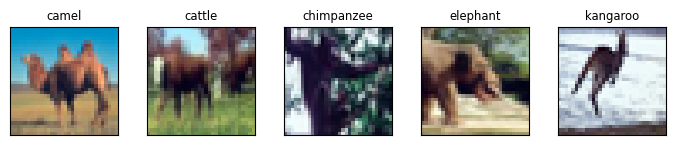

Time=12 | Task ID 12 | 2,125 train | 250 validation | 125 test


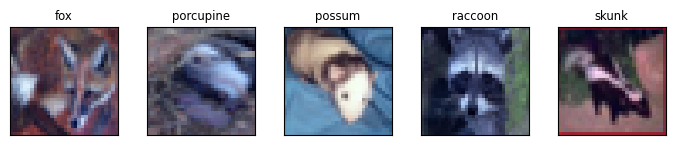

Time=13 | Task ID 13 | 2,125 train | 250 validation | 125 test


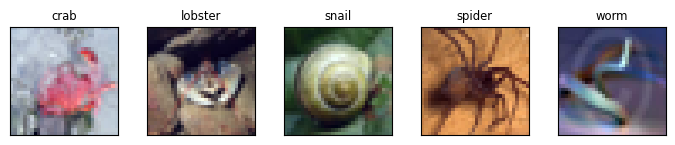

Time=14 | Task ID 14 | 2,125 train | 250 validation | 125 test


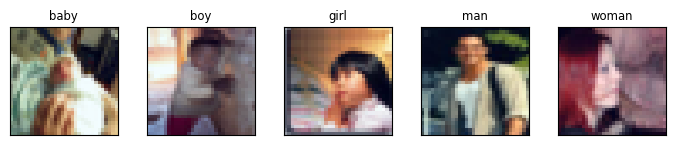

Time=15 | Task ID 15 | 2,125 train | 250 validation | 125 test


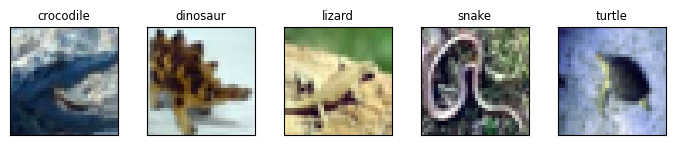

Time=16 | Task ID 16 | 2,125 train | 250 validation | 125 test


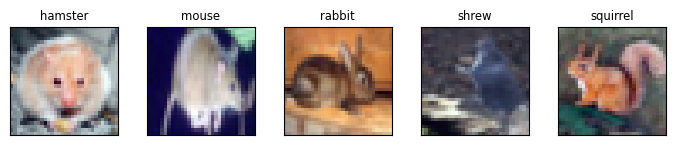

Time=17 | Task ID 17 | 2,125 train | 250 validation | 125 test


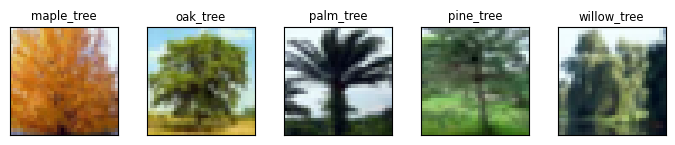

Time=18 | Task ID 18 | 2,125 train | 250 validation | 125 test


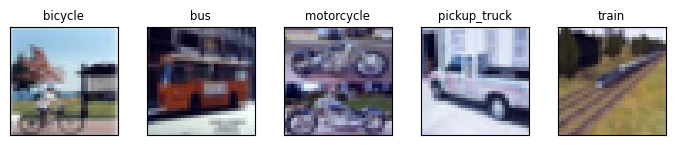

Time=19 | Task ID 19 | 2,125 train | 250 validation | 125 test


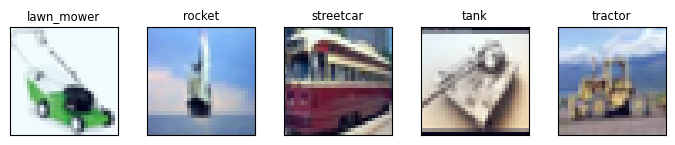

Final test set size (containing all tasks): 2,500

Joint training set size (containing all tasks): 42,500


In [17]:
BATCH_SIZE = 256
task_train, timestep_task_classes, timestep_tasks, task_test_sets = divide_tasks(cifar100, 'cifar-100', BATCH_SIZE=BATCH_SIZE)

Training on task id: 0  (classification between: ['beaver', 'dolphin', 'otter', 'seal', 'whale'])


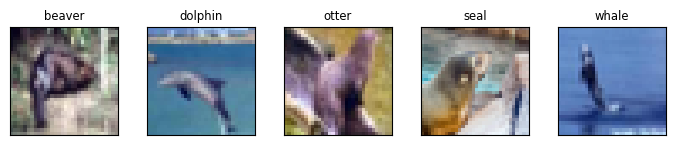

  Adding new task head 0 to multi-task model


E0 batch loss:1.48, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.96it/s]


epoch:  0 | loss: 1.52 | 1.44   acc: 30.4% | 39.6%


E1 batch loss:1.42, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.52it/s]


epoch:  1 | loss: 1.44 | 1.42   acc: 34.5% | 38.8%


E2 batch loss:1.35, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.57it/s]


epoch:  2 | loss: 1.42 | 1.41   acc: 36.4% | 36.4%


E3 batch loss:1.43, batch acc:48.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.43it/s]


epoch:  3 | loss: 1.41 | 1.39   acc: 39.4% | 36.8%


E4 batch loss:1.33, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.65it/s]


epoch:  4 | loss: 1.40 | 1.39   acc: 39.7% | 40.0%


E5 batch loss:1.40, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.61it/s]


epoch:  5 | loss: 1.39 | 1.39   acc: 40.7% | 40.0%


E6 batch loss:1.43, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.41it/s]


epoch:  6 | loss: 1.39 | 1.38   acc: 41.0% | 40.4%


E7 batch loss:1.36, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.70it/s]


epoch:  7 | loss: 1.37 | 1.35   acc: 43.9% | 41.6%


E8 batch loss:1.34, batch acc:50.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.46it/s]


epoch:  8 | loss: 1.36 | 1.34   acc: 45.7% | 45.6%


E9 batch loss:1.31, batch acc:55.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.56it/s]


epoch:  9 | loss: 1.35 | 1.34   acc: 47.0% | 45.2%


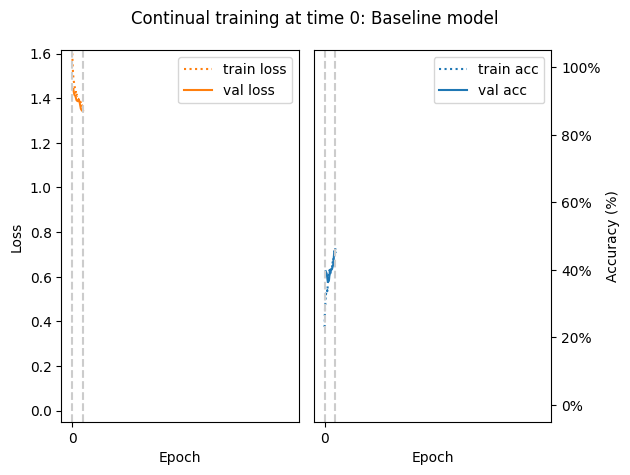

Baseline at t=0 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 45.60%

 +++ AVERAGE TASK TEST ACCURACY: 45.60% +++ 


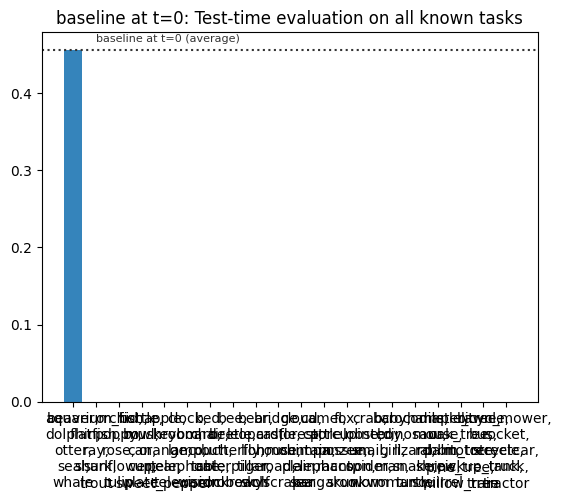

Training on task id: 1  (classification between: ['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout'])


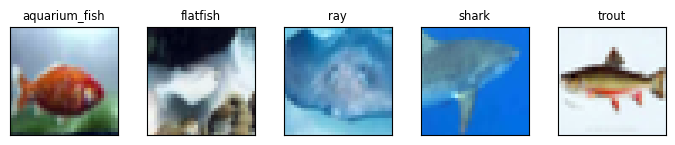

  Adding new task head 1 to multi-task model


E0 batch loss:1.56, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.48it/s]


epoch:  0 | loss: 1.59 | 1.52   acc: 23.2% | 46.8%


E1 batch loss:1.44, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.71it/s]


epoch:  1 | loss: 1.49 | 1.44   acc: 44.0% | 45.6%


E2 batch loss:1.46, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.76it/s]


epoch:  2 | loss: 1.44 | 1.40   acc: 44.6% | 49.2%


E3 batch loss:1.35, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.59it/s]


epoch:  3 | loss: 1.39 | 1.36   acc: 47.2% | 46.8%


E4 batch loss:1.34, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.43it/s]


epoch:  4 | loss: 1.37 | 1.34   acc: 45.1% | 46.4%


E5 batch loss:1.34, batch acc:50.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.42it/s]


epoch:  5 | loss: 1.35 | 1.32   acc: 48.0% | 54.8%


E6 batch loss:1.31, batch acc:57.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.35it/s]


epoch:  6 | loss: 1.32 | 1.29   acc: 51.1% | 54.8%


E7 batch loss:1.35, batch acc:50.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.54it/s]


epoch:  7 | loss: 1.30 | 1.28   acc: 51.3% | 56.0%


E8 batch loss:1.27, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.75it/s]


epoch:  8 | loss: 1.28 | 1.28   acc: 54.1% | 58.0%


E9 batch loss:1.30, batch acc:58.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.67it/s]


epoch:  9 | loss: 1.28 | 1.27   acc: 55.2% | 57.2%


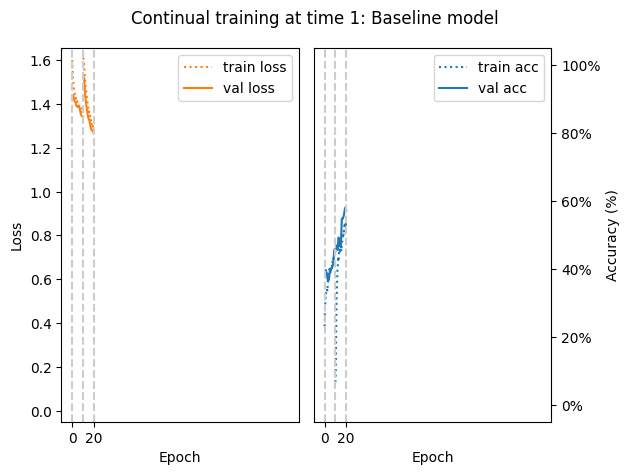

Baseline at t=1 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 58.40%

 +++ AVERAGE TASK TEST ACCURACY: 38.80% +++ 


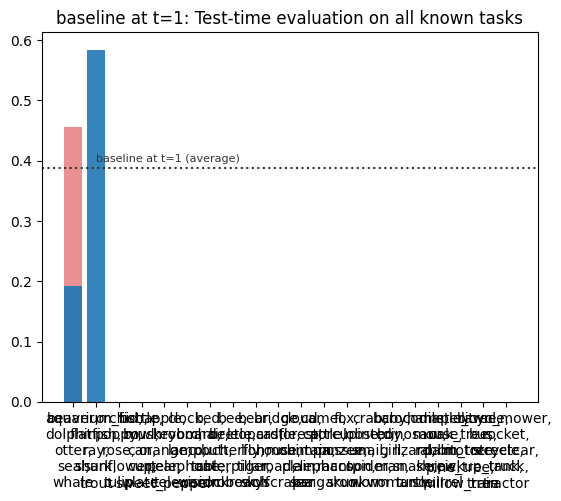

Training on task id: 2  (classification between: ['orchid', 'poppy', 'rose', 'sunflower', 'tulip'])


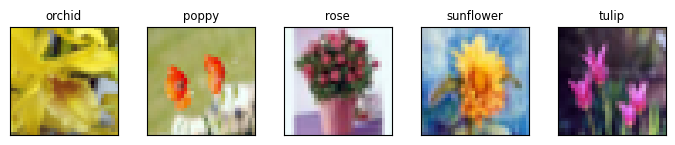

  Adding new task head 2 to multi-task model


E0 batch loss:1.64, batch acc:22.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.52it/s]


epoch:  0 | loss: 1.64 | 1.62   acc: 20.5% | 20.0%


E1 batch loss:1.53, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.65it/s]


epoch:  1 | loss: 1.58 | 1.57   acc: 26.6% | 30.4%


E2 batch loss:1.49, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.35it/s]


epoch:  2 | loss: 1.54 | 1.52   acc: 39.4% | 38.8%


E3 batch loss:1.43, batch acc:54.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.56it/s]


epoch:  3 | loss: 1.50 | 1.48   acc: 41.8% | 37.2%


E4 batch loss:1.50, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.52it/s]


epoch:  4 | loss: 1.47 | 1.45   acc: 41.3% | 42.0%


E5 batch loss:1.46, batch acc:51.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.57it/s]


epoch:  5 | loss: 1.44 | 1.44   acc: 47.3% | 42.4%


E6 batch loss:1.41, batch acc:51.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.59it/s]


epoch:  6 | loss: 1.42 | 1.40   acc: 47.8% | 52.8%


E7 batch loss:1.42, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.47it/s]


epoch:  7 | loss: 1.40 | 1.38   acc: 48.4% | 49.2%


E8 batch loss:1.43, batch acc:44.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.48it/s]


epoch:  8 | loss: 1.39 | 1.37   acc: 48.4% | 48.4%


E9 batch loss:1.34, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.61it/s]


epoch:  9 | loss: 1.36 | 1.34   acc: 50.9% | 53.6%


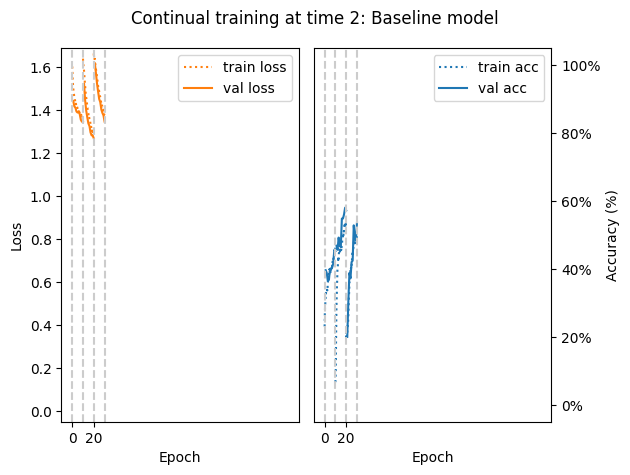

Baseline at t=2 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 24.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 56.00%

 +++ AVERAGE TASK TEST ACCURACY: 33.07% +++ 


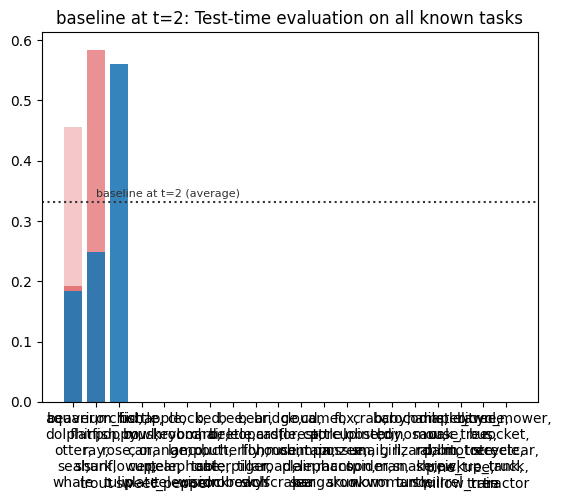

Training on task id: 3  (classification between: ['bottle', 'bowl', 'can', 'cup', 'plate'])


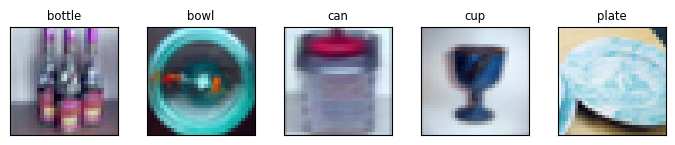

  Adding new task head 3 to multi-task model


E0 batch loss:1.64, batch acc:11.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.72it/s]


epoch:  0 | loss: 1.64 | 1.60   acc: 17.7% | 23.6%


E1 batch loss:1.60, batch acc:15.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.73it/s]


epoch:  1 | loss: 1.61 | 1.61   acc: 18.8% | 24.0%


E2 batch loss:1.59, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.60it/s]


epoch:  2 | loss: 1.60 | 1.60   acc: 23.1% | 27.2%


E3 batch loss:1.59, batch acc:20.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.33it/s]


epoch:  3 | loss: 1.59 | 1.59   acc: 27.6% | 26.4%


E4 batch loss:1.56, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.16it/s]


epoch:  4 | loss: 1.57 | 1.58   acc: 29.6% | 26.8%


E5 batch loss:1.51, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.13it/s]


epoch:  5 | loss: 1.56 | 1.56   acc: 31.8% | 28.4%


E6 batch loss:1.55, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.20it/s]


epoch:  6 | loss: 1.55 | 1.54   acc: 30.6% | 28.8%


E7 batch loss:1.51, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.11it/s]


epoch:  7 | loss: 1.54 | 1.53   acc: 32.4% | 27.2%


E8 batch loss:1.51, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.18it/s]


epoch:  8 | loss: 1.53 | 1.53   acc: 33.0% | 30.4%


E9 batch loss:1.52, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.54it/s]


epoch:  9 | loss: 1.52 | 1.53   acc: 34.0% | 31.6%


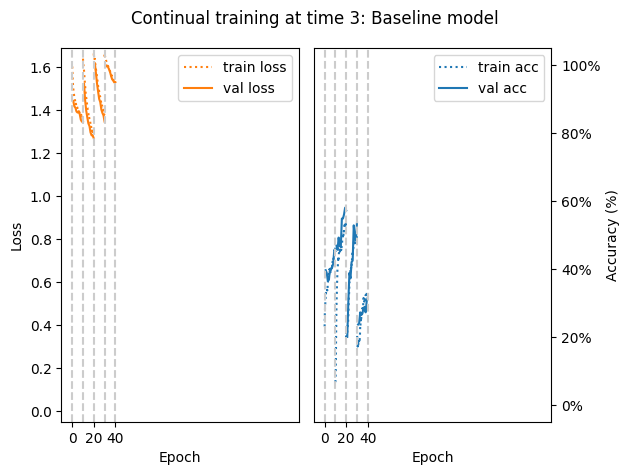

Baseline at t=3 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 24.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 36.00%
['bottle', 'bowl', 'can', 'cup', 'plate']: 32.80%

 +++ AVERAGE TASK TEST ACCURACY: 28.00% +++ 


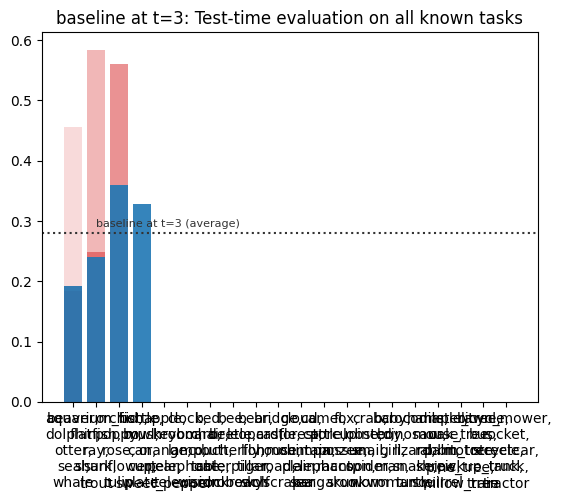

Training on task id: 4  (classification between: ['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper'])


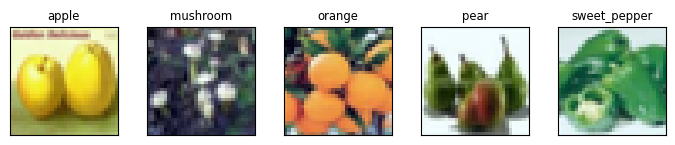

  Adding new task head 4 to multi-task model


E0 batch loss:1.53, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.96it/s]


epoch:  0 | loss: 1.60 | 1.52   acc: 24.0% | 33.6%


E1 batch loss:1.43, batch acc:54.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.64it/s]


epoch:  1 | loss: 1.48 | 1.44   acc: 41.3% | 44.4%


E2 batch loss:1.43, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.21it/s]


epoch:  2 | loss: 1.42 | 1.38   acc: 47.7% | 52.4%


E3 batch loss:1.32, batch acc:54.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.00it/s]


epoch:  3 | loss: 1.36 | 1.34   acc: 53.2% | 60.0%


E4 batch loss:1.28, batch acc:61.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.19it/s]


epoch:  4 | loss: 1.32 | 1.31   acc: 54.6% | 60.4%


E5 batch loss:1.31, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.96it/s]


epoch:  5 | loss: 1.29 | 1.27   acc: 55.7% | 60.0%


E6 batch loss:1.18, batch acc:68.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.53it/s]


epoch:  6 | loss: 1.26 | 1.25   acc: 58.7% | 60.8%


E7 batch loss:1.26, batch acc:50.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.43it/s]


epoch:  7 | loss: 1.24 | 1.23   acc: 57.8% | 60.8%


E8 batch loss:1.22, batch acc:61.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.65it/s]


epoch:  8 | loss: 1.22 | 1.20   acc: 60.0% | 62.8%


E9 batch loss:1.15, batch acc:70.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.65it/s]


epoch:  9 | loss: 1.19 | 1.17   acc: 62.1% | 63.6%


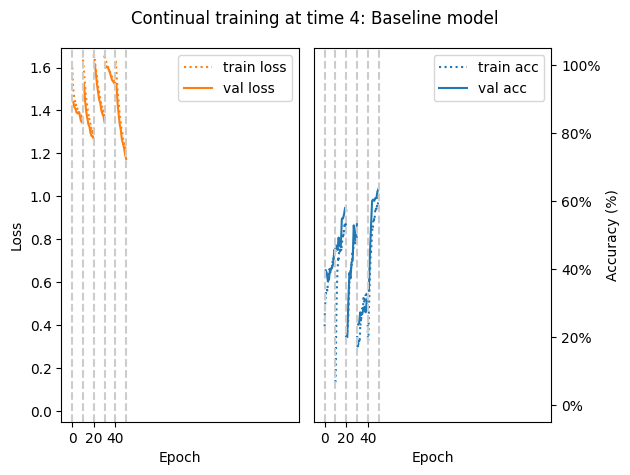

Baseline at t=4 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 23.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 22.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 34.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 21.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 64.00%

 +++ AVERAGE TASK TEST ACCURACY: 33.12% +++ 


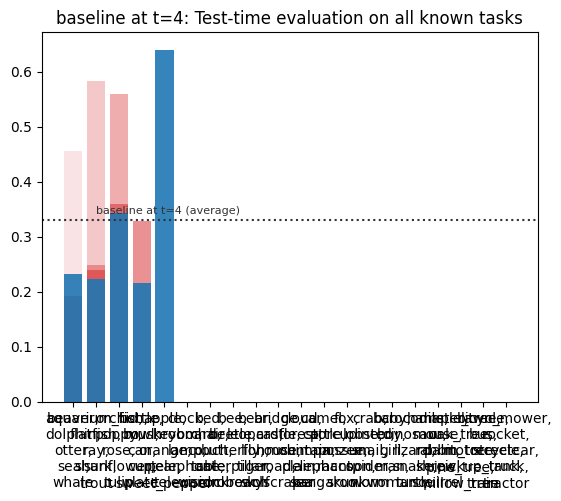

Training on task id: 5  (classification between: ['clock', 'keyboard', 'lamp', 'telephone', 'television'])


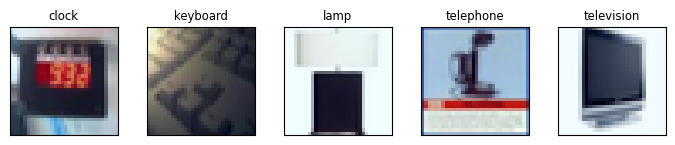

  Adding new task head 5 to multi-task model


E0 batch loss:1.59, batch acc:26.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.77it/s]


epoch:  0 | loss: 1.61 | 1.60   acc: 23.8% | 27.2%


E1 batch loss:1.63, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.60it/s]


epoch:  1 | loss: 1.60 | 1.59   acc: 24.6% | 28.4%


E2 batch loss:1.56, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.84it/s]


epoch:  2 | loss: 1.58 | 1.57   acc: 29.5% | 31.2%


E3 batch loss:1.57, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.60it/s]


epoch:  3 | loss: 1.56 | 1.58   acc: 29.8% | 26.8%


E4 batch loss:1.57, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.77it/s]


epoch:  4 | loss: 1.56 | 1.55   acc: 30.7% | 32.0%


E5 batch loss:1.54, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.80it/s]


epoch:  5 | loss: 1.54 | 1.55   acc: 31.2% | 32.4%


E6 batch loss:1.55, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.74it/s]


epoch:  6 | loss: 1.54 | 1.54   acc: 31.2% | 35.6%


E7 batch loss:1.52, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.52it/s]


epoch:  7 | loss: 1.53 | 1.53   acc: 33.2% | 33.6%


E8 batch loss:1.49, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.77it/s]


epoch:  8 | loss: 1.52 | 1.53   acc: 33.6% | 36.0%


E9 batch loss:1.52, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.68it/s]


epoch:  9 | loss: 1.51 | 1.52   acc: 35.8% | 32.4%


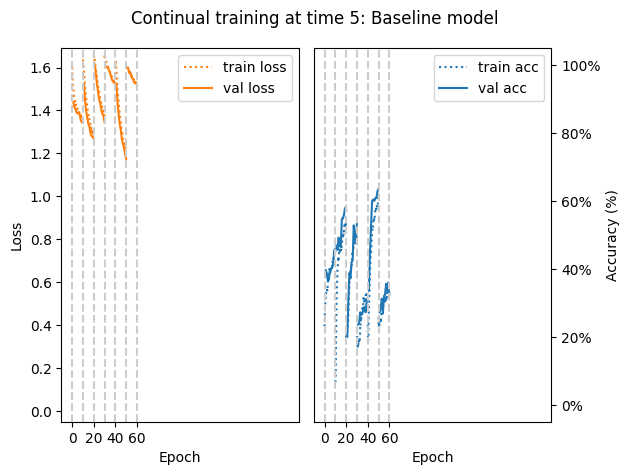

Baseline at t=5 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 20.80%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 15.20%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 29.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 17.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 30.40%

 +++ AVERAGE TASK TEST ACCURACY: 23.60% +++ 


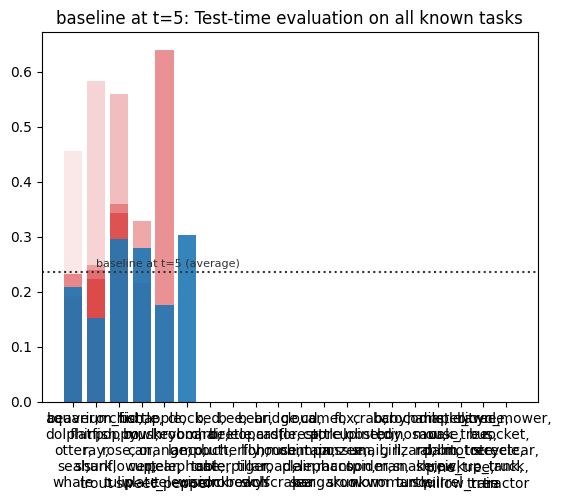

Training on task id: 6  (classification between: ['bed', 'chair', 'couch', 'table', 'wardrobe'])


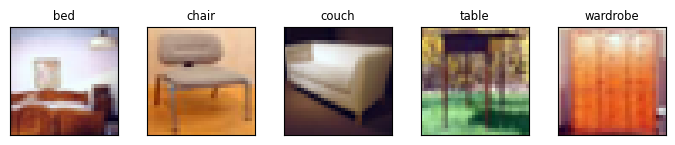

  Adding new task head 6 to multi-task model


E0 batch loss:1.59, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.82it/s]


epoch:  0 | loss: 1.62 | 1.59   acc: 22.2% | 28.0%


E1 batch loss:1.52, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.67it/s]


epoch:  1 | loss: 1.56 | 1.56   acc: 31.6% | 30.8%


E2 batch loss:1.49, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.81it/s]


epoch:  2 | loss: 1.53 | 1.53   acc: 35.8% | 37.2%


E3 batch loss:1.56, batch acc:26.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.80it/s]


epoch:  3 | loss: 1.51 | 1.51   acc: 36.3% | 35.2%


E4 batch loss:1.43, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.67it/s]


epoch:  4 | loss: 1.48 | 1.49   acc: 38.6% | 38.8%


E5 batch loss:1.48, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.56it/s]


epoch:  5 | loss: 1.47 | 1.48   acc: 39.1% | 41.2%


E6 batch loss:1.42, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.74it/s]


epoch:  6 | loss: 1.46 | 1.47   acc: 40.1% | 36.8%


E7 batch loss:1.51, batch acc:27.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.73it/s]


epoch:  7 | loss: 1.45 | 1.47   acc: 38.6% | 38.4%


E8 batch loss:1.50, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.98it/s]


epoch:  8 | loss: 1.44 | 1.45   acc: 40.9% | 40.0%


E9 batch loss:1.45, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.75it/s]


epoch:  9 | loss: 1.43 | 1.47   acc: 42.4% | 36.8%


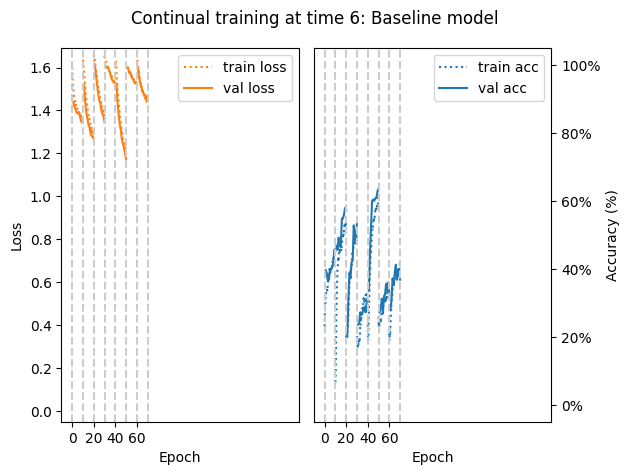

Baseline at t=6 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 16.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 20.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 12.80%
['bottle', 'bowl', 'can', 'cup', 'plate']: 20.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 28.80%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 45.60%

 +++ AVERAGE TASK TEST ACCURACY: 23.54% +++ 


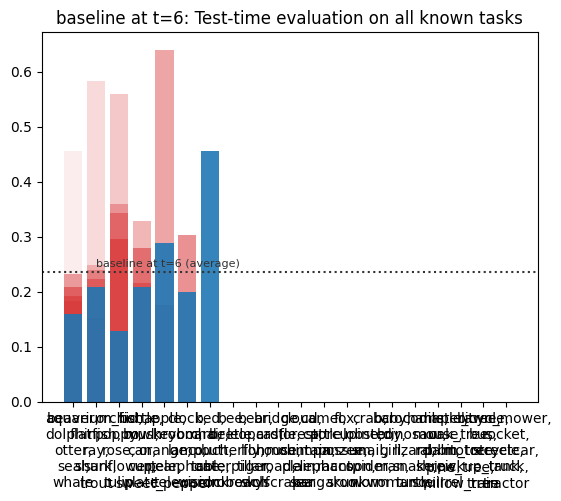

Training on task id: 7  (classification between: ['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach'])


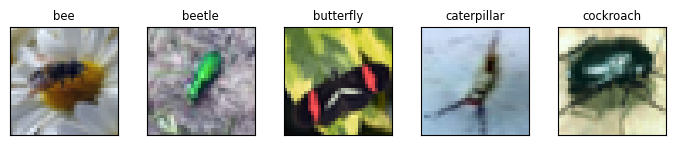

  Adding new task head 7 to multi-task model


E0 batch loss:1.59, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 21.62it/s]


epoch:  0 | loss: 1.61 | 1.57   acc: 20.9% | 33.2%


E1 batch loss:1.52, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.01it/s]


epoch:  1 | loss: 1.55 | 1.52   acc: 36.2% | 42.4%


E2 batch loss:1.50, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.52it/s]


epoch:  2 | loss: 1.51 | 1.47   acc: 37.9% | 43.2%


E3 batch loss:1.42, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.92it/s]


epoch:  3 | loss: 1.47 | 1.45   acc: 41.0% | 44.4%


E4 batch loss:1.49, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.48it/s]


epoch:  4 | loss: 1.45 | 1.43   acc: 41.5% | 44.4%


E5 batch loss:1.39, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.88it/s]


epoch:  5 | loss: 1.42 | 1.41   acc: 43.7% | 45.2%


E6 batch loss:1.46, batch acc:44.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.66it/s]


epoch:  6 | loss: 1.41 | 1.39   acc: 45.0% | 46.0%


E7 batch loss:1.33, batch acc:54.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.95it/s]


epoch:  7 | loss: 1.38 | 1.38   acc: 46.2% | 46.0%


E8 batch loss:1.34, batch acc:50.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.75it/s]


epoch:  8 | loss: 1.37 | 1.37   acc: 46.8% | 46.0%


E9 batch loss:1.36, batch acc:48.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.86it/s]


epoch:  9 | loss: 1.36 | 1.36   acc: 47.1% | 48.0%


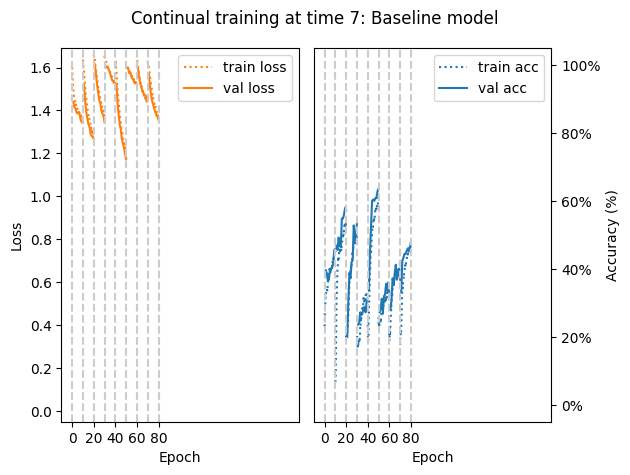

Baseline at t=7 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 15.20%
['bottle', 'bowl', 'can', 'cup', 'plate']: 25.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 21.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 21.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 50.40%

 +++ AVERAGE TASK TEST ACCURACY: 23.60% +++ 


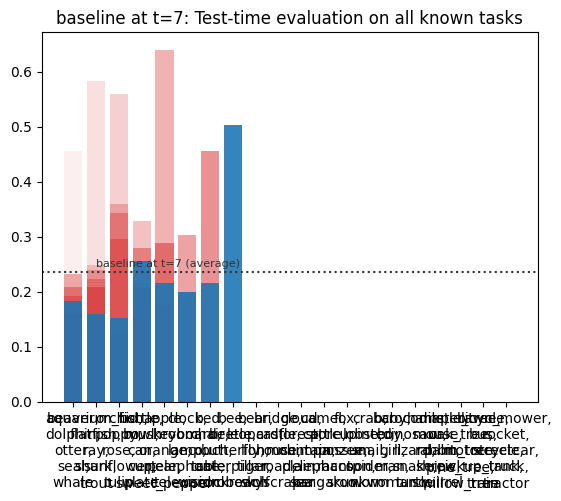

Training on task id: 8  (classification between: ['bear', 'leopard', 'lion', 'tiger', 'wolf'])


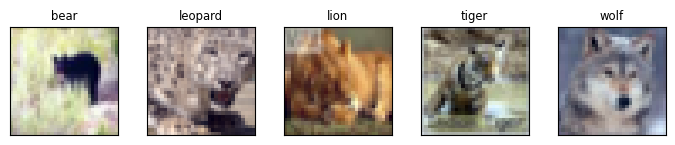

  Adding new task head 8 to multi-task model


E0 batch loss:1.57, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.45it/s]


epoch:  0 | loss: 1.62 | 1.58   acc: 24.7% | 32.4%


E1 batch loss:1.55, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.56it/s]


epoch:  1 | loss: 1.57 | 1.54   acc: 32.4% | 33.2%


E2 batch loss:1.53, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.57it/s]


epoch:  2 | loss: 1.54 | 1.52   acc: 32.5% | 32.8%


E3 batch loss:1.50, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.50it/s]


epoch:  3 | loss: 1.52 | 1.50   acc: 33.0% | 32.8%


E4 batch loss:1.57, batch acc:26.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.47it/s]


epoch:  4 | loss: 1.50 | 1.49   acc: 33.0% | 36.0%


E5 batch loss:1.52, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.57it/s]


epoch:  5 | loss: 1.48 | 1.48   acc: 36.6% | 35.2%


E6 batch loss:1.43, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.46it/s]


epoch:  6 | loss: 1.46 | 1.45   acc: 36.5% | 36.4%


E7 batch loss:1.34, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.62it/s]


epoch:  7 | loss: 1.43 | 1.44   acc: 37.0% | 34.4%


E8 batch loss:1.44, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.62it/s]


epoch:  8 | loss: 1.43 | 1.43   acc: 37.5% | 36.4%


E9 batch loss:1.46, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.66it/s]


epoch:  9 | loss: 1.42 | 1.43   acc: 38.4% | 36.4%


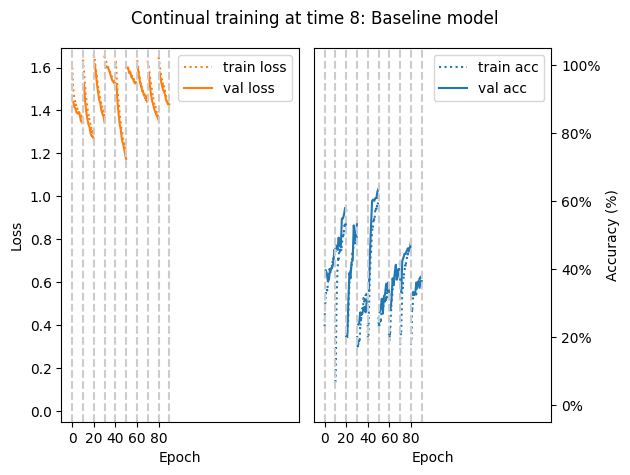

Baseline at t=8 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 15.20%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 13.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 16.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 17.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 40.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 34.40%

 +++ AVERAGE TASK TEST ACCURACY: 22.67% +++ 


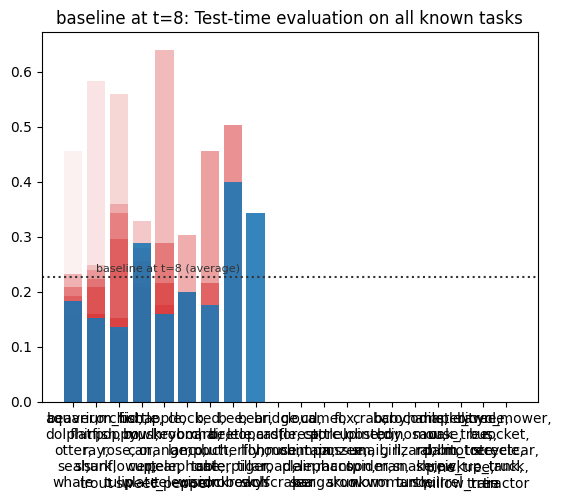

Training on task id: 9  (classification between: ['bridge', 'castle', 'house', 'road', 'skyscraper'])


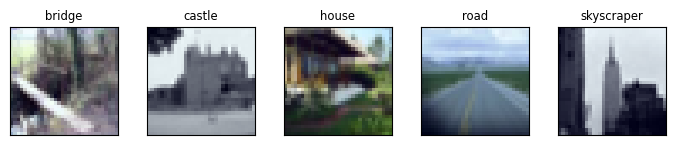

  Adding new task head 9 to multi-task model


E0 batch loss:1.58, batch acc:22.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.62it/s]


epoch:  0 | loss: 1.59 | 1.57   acc: 19.9% | 21.2%


E1 batch loss:1.51, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.80it/s]


epoch:  1 | loss: 1.55 | 1.54   acc: 24.3% | 27.6%


E2 batch loss:1.51, batch acc:22.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.37it/s]


epoch:  2 | loss: 1.53 | 1.55   acc: 24.8% | 24.4%


E3 batch loss:1.56, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.18it/s]


epoch:  3 | loss: 1.53 | 1.51   acc: 27.4% | 28.0%


E4 batch loss:1.45, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.33it/s]


epoch:  4 | loss: 1.49 | 1.49   acc: 31.1% | 31.6%


E5 batch loss:1.52, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.88it/s]


epoch:  5 | loss: 1.49 | 1.49   acc: 33.6% | 34.0%


E6 batch loss:1.46, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.65it/s]


epoch:  6 | loss: 1.47 | 1.49   acc: 34.4% | 35.6%


E7 batch loss:1.46, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.65it/s]


epoch:  7 | loss: 1.47 | 1.47   acc: 37.3% | 37.6%


E8 batch loss:1.44, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.85it/s]


epoch:  8 | loss: 1.45 | 1.47   acc: 39.5% | 36.0%


E9 batch loss:1.40, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.12it/s]


epoch:  9 | loss: 1.44 | 1.46   acc: 42.6% | 38.0%


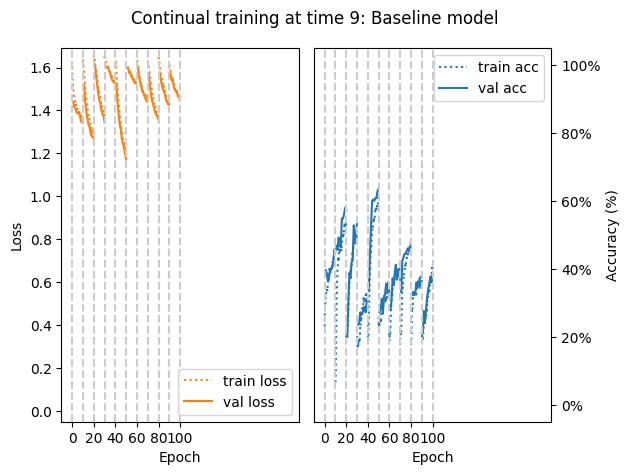

Baseline at t=9 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 15.20%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 17.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 14.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 21.60%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 19.20%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 36.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 32.00%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 44.00%

 +++ AVERAGE TASK TEST ACCURACY: 24.72% +++ 


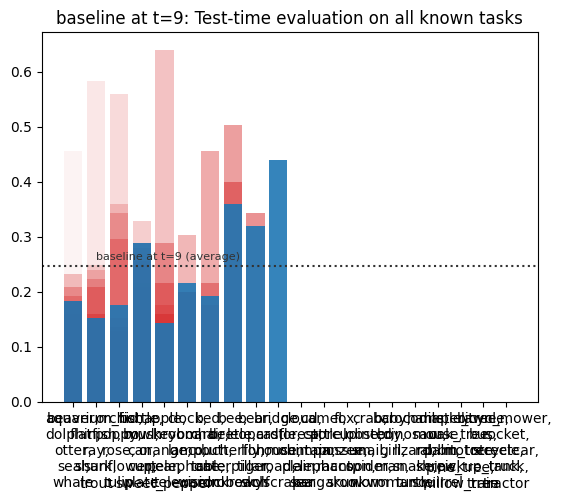

Training on task id: 10  (classification between: ['cloud', 'forest', 'mountain', 'plain', 'sea'])


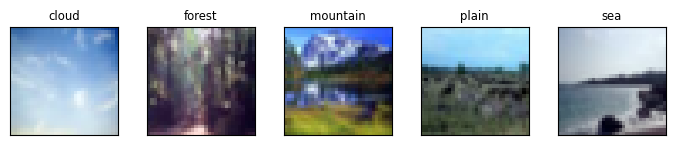

  Adding new task head 10 to multi-task model


E0 batch loss:1.60, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.03it/s]


epoch:  0 | loss: 1.60 | 1.57   acc: 31.0% | 37.2%


E1 batch loss:1.43, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.33it/s]


epoch:  1 | loss: 1.50 | 1.48   acc: 39.2% | 41.2%


E2 batch loss:1.39, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.91it/s]


epoch:  2 | loss: 1.43 | 1.44   acc: 42.2% | 41.6%


E3 batch loss:1.35, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.71it/s]


epoch:  3 | loss: 1.38 | 1.38   acc: 45.8% | 44.0%


E4 batch loss:1.37, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.89it/s]


epoch:  4 | loss: 1.34 | 1.34   acc: 47.2% | 46.0%


E5 batch loss:1.26, batch acc:51.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.11it/s]


epoch:  5 | loss: 1.30 | 1.32   acc: 49.3% | 47.6%


E6 batch loss:1.36, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.27it/s]


epoch:  6 | loss: 1.28 | 1.30   acc: 49.7% | 46.4%


E7 batch loss:1.23, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.95it/s]


epoch:  7 | loss: 1.25 | 1.29   acc: 52.0% | 46.0%


E8 batch loss:1.23, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.77it/s]


epoch:  8 | loss: 1.24 | 1.26   acc: 51.2% | 50.8%


E9 batch loss:1.29, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.07it/s]


epoch:  9 | loss: 1.22 | 1.23   acc: 53.8% | 50.8%


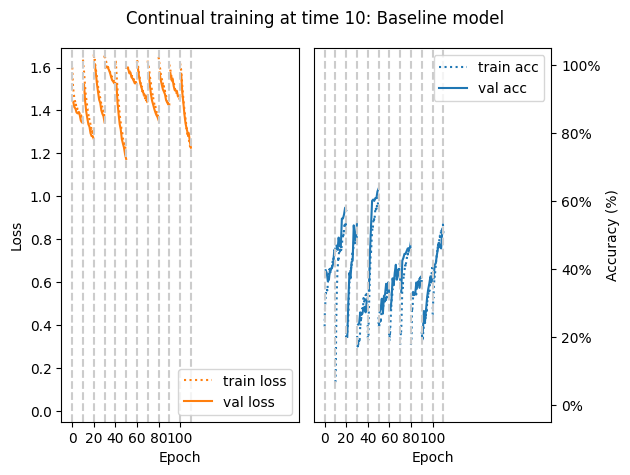

Baseline at t=10 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 13.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 25.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 24.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 27.20%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 28.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 20.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 16.80%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 46.40%

 +++ AVERAGE TASK TEST ACCURACY: 24.15% +++ 


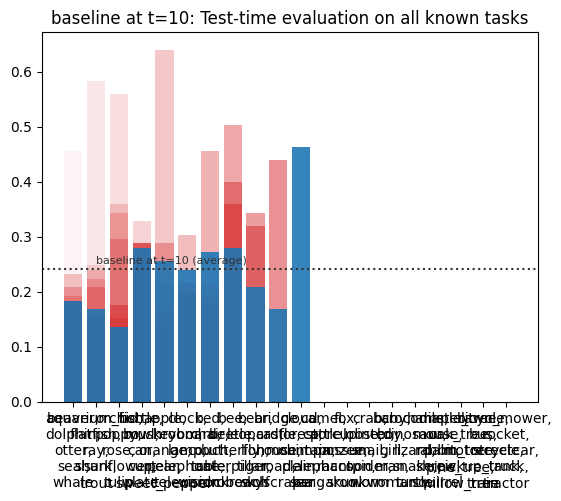

Training on task id: 11  (classification between: ['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo'])


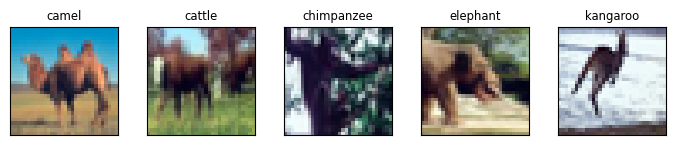

  Adding new task head 11 to multi-task model


E0 batch loss:1.56, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.29it/s]


epoch:  0 | loss: 1.59 | 1.55   acc: 25.5% | 36.0%


E1 batch loss:1.50, batch acc:41.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.90it/s]


epoch:  1 | loss: 1.54 | 1.50   acc: 35.1% | 38.4%


E2 batch loss:1.50, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.70it/s]


epoch:  2 | loss: 1.50 | 1.47   acc: 38.1% | 39.6%


E3 batch loss:1.47, batch acc:45.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.21it/s]


epoch:  3 | loss: 1.47 | 1.46   acc: 41.1% | 40.4%


E4 batch loss:1.47, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.90it/s]


epoch:  4 | loss: 1.46 | 1.43   acc: 41.5% | 41.6%


E5 batch loss:1.43, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.85it/s]


epoch:  5 | loss: 1.44 | 1.40   acc: 41.1% | 44.0%


E6 batch loss:1.40, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.38it/s]


epoch:  6 | loss: 1.44 | 1.39   acc: 42.1% | 44.4%


E7 batch loss:1.39, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 22.37it/s]


epoch:  7 | loss: 1.43 | 1.39   acc: 43.0% | 44.0%


E8 batch loss:1.36, batch acc:48.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.89it/s]


epoch:  8 | loss: 1.41 | 1.38   acc: 43.3% | 45.2%


E9 batch loss:1.45, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.54it/s]


epoch:  9 | loss: 1.41 | 1.37   acc: 44.4% | 45.6%


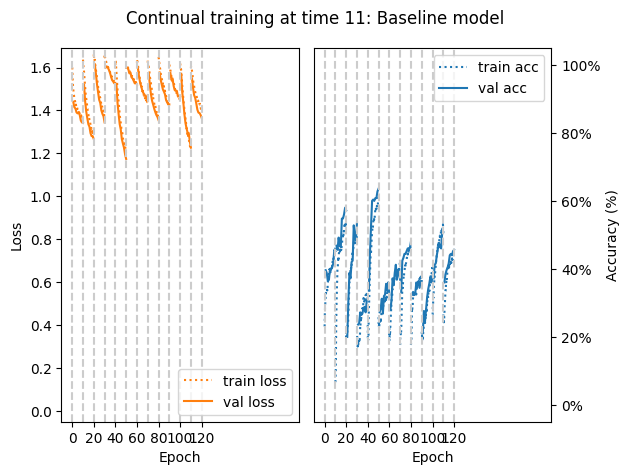

Baseline at t=11 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 13.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 21.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 23.20%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 21.60%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 16.80%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 16.80%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 17.60%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 14.40%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 36.00%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 44.00%

 +++ AVERAGE TASK TEST ACCURACY: 22.80% +++ 


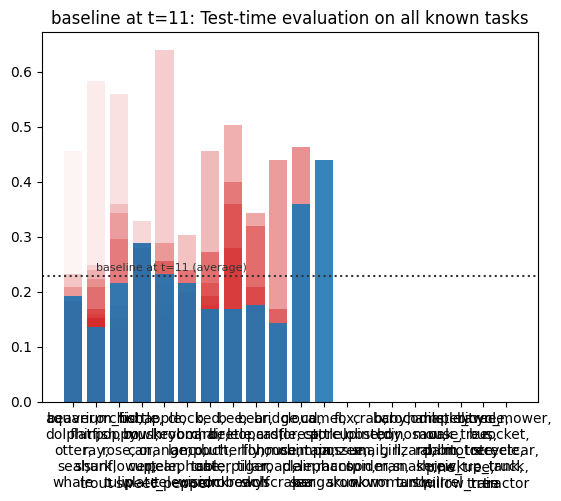

Training on task id: 12  (classification between: ['fox', 'porcupine', 'possum', 'raccoon', 'skunk'])


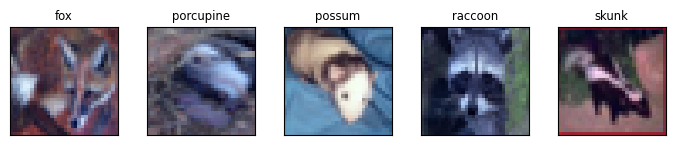

  Adding new task head 12 to multi-task model


E0 batch loss:1.59, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.07it/s]


epoch:  0 | loss: 1.63 | 1.61   acc: 22.0% | 23.2%


E1 batch loss:1.57, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.89it/s]


epoch:  1 | loss: 1.59 | 1.57   acc: 26.5% | 34.8%


E2 batch loss:1.56, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.07it/s]


epoch:  2 | loss: 1.56 | 1.54   acc: 33.6% | 40.4%


E3 batch loss:1.53, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.67it/s]


epoch:  3 | loss: 1.54 | 1.51   acc: 36.2% | 41.6%


E4 batch loss:1.51, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.29it/s]


epoch:  4 | loss: 1.51 | 1.48   acc: 37.1% | 41.2%


E5 batch loss:1.47, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.86it/s]


epoch:  5 | loss: 1.49 | 1.47   acc: 39.8% | 42.4%


E6 batch loss:1.45, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.72it/s]


epoch:  6 | loss: 1.47 | 1.44   acc: 40.3% | 44.4%


E7 batch loss:1.46, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.49it/s]


epoch:  7 | loss: 1.46 | 1.42   acc: 40.2% | 48.4%


E8 batch loss:1.46, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.64it/s]


epoch:  8 | loss: 1.43 | 1.44   acc: 42.1% | 40.8%


E9 batch loss:1.40, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.57it/s]


epoch:  9 | loss: 1.42 | 1.37   acc: 42.3% | 48.8%


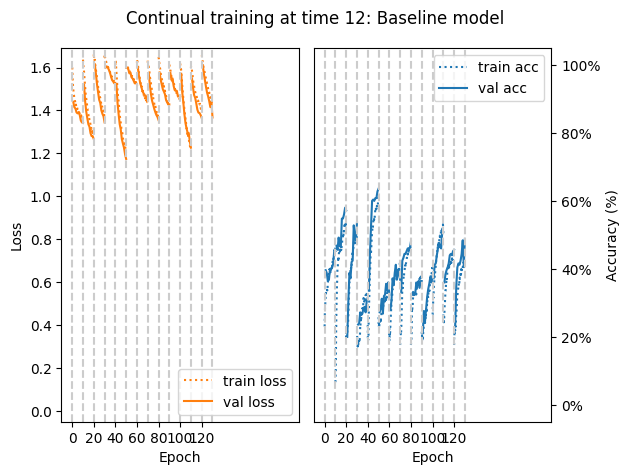

Baseline at t=12 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 16.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 18.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 20.80%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 18.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 22.40%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 16.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 17.60%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 27.20%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 31.20%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 41.60%

 +++ AVERAGE TASK TEST ACCURACY: 22.77% +++ 


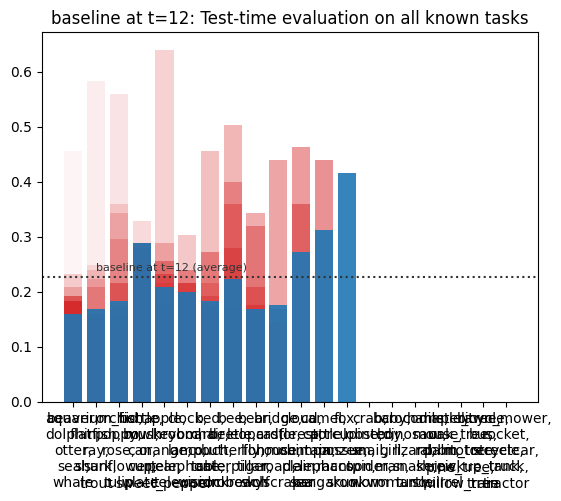

Training on task id: 13  (classification between: ['crab', 'lobster', 'snail', 'spider', 'worm'])


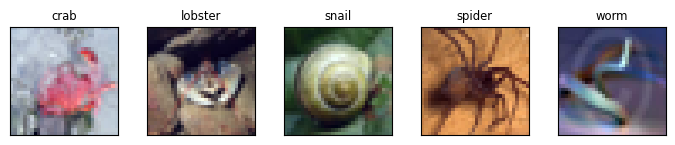

  Adding new task head 13 to multi-task model


E0 batch loss:1.62, batch acc:15.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.79it/s]


epoch:  0 | loss: 1.64 | 1.61   acc: 17.0% | 17.6%


E1 batch loss:1.56, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.43it/s]


epoch:  1 | loss: 1.58 | 1.58   acc: 25.9% | 28.4%


E2 batch loss:1.59, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.59it/s]


epoch:  2 | loss: 1.56 | 1.55   acc: 30.7% | 31.6%


E3 batch loss:1.48, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.90it/s]


epoch:  3 | loss: 1.52 | 1.53   acc: 35.2% | 36.8%


E4 batch loss:1.49, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.76it/s]


epoch:  4 | loss: 1.50 | 1.52   acc: 37.0% | 34.0%


E5 batch loss:1.44, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.55it/s]


epoch:  5 | loss: 1.48 | 1.49   acc: 37.6% | 38.8%


E6 batch loss:1.52, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.79it/s]


epoch:  6 | loss: 1.47 | 1.47   acc: 39.1% | 41.2%


E7 batch loss:1.46, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.90it/s]


epoch:  7 | loss: 1.45 | 1.46   acc: 40.0% | 40.8%


E8 batch loss:1.43, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.82it/s]


epoch:  8 | loss: 1.44 | 1.44   acc: 41.6% | 42.8%


E9 batch loss:1.43, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.39it/s]


epoch:  9 | loss: 1.43 | 1.42   acc: 40.3% | 43.6%


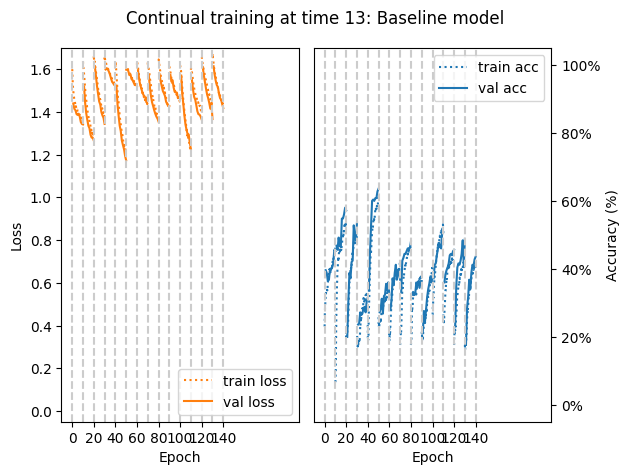

Baseline at t=13 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 24.00%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 20.80%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 17.60%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 22.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 23.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 24.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 20.00%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 24.80%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 16.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 19.20%
['crab', 'lobster', 'snail', 'spider', 'worm']: 37.60%

 +++ AVERAGE TASK TEST ACCURACY: 22.51% +++ 


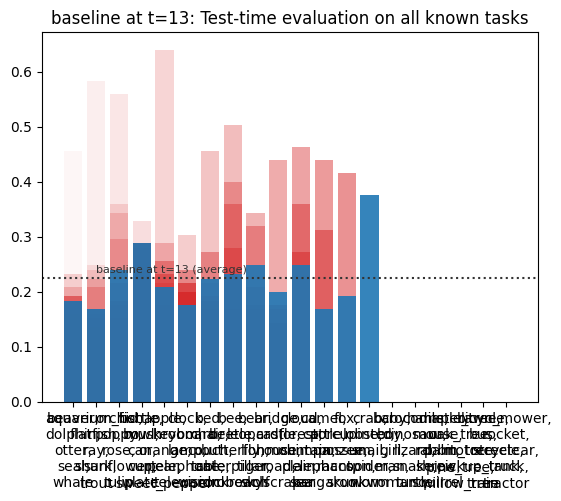

Training on task id: 14  (classification between: ['baby', 'boy', 'girl', 'man', 'woman'])


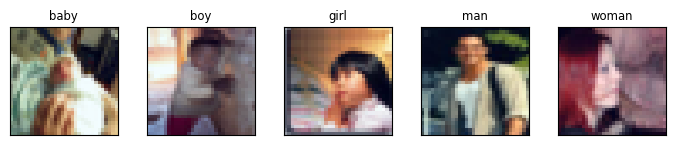

  Adding new task head 14 to multi-task model


E0 batch loss:1.66, batch acc:15.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.77it/s]


epoch:  0 | loss: 1.64 | 1.62   acc: 19.8% | 20.0%


E1 batch loss:1.62, batch acc:14.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.69it/s]


epoch:  1 | loss: 1.62 | 1.61   acc: 19.7% | 18.4%


E2 batch loss:1.61, batch acc:22.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.58it/s]


epoch:  2 | loss: 1.61 | 1.61   acc: 22.2% | 23.6%


E3 batch loss:1.59, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.11it/s]


epoch:  3 | loss: 1.60 | 1.60   acc: 23.7% | 22.4%


E4 batch loss:1.60, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.07it/s]


epoch:  4 | loss: 1.60 | 1.60   acc: 25.6% | 24.8%


E5 batch loss:1.57, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.86it/s]


epoch:  5 | loss: 1.59 | 1.60   acc: 26.6% | 25.2%


E6 batch loss:1.60, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.05it/s]


epoch:  6 | loss: 1.59 | 1.60   acc: 25.8% | 24.4%


E7 batch loss:1.58, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.03it/s]


epoch:  7 | loss: 1.59 | 1.60   acc: 27.4% | 26.8%


E8 batch loss:1.56, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.11it/s]


epoch:  8 | loss: 1.58 | 1.59   acc: 27.8% | 26.0%


E9 batch loss:1.58, batch acc:24.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.10it/s]


epoch:  9 | loss: 1.58 | 1.59   acc: 26.6% | 26.0%


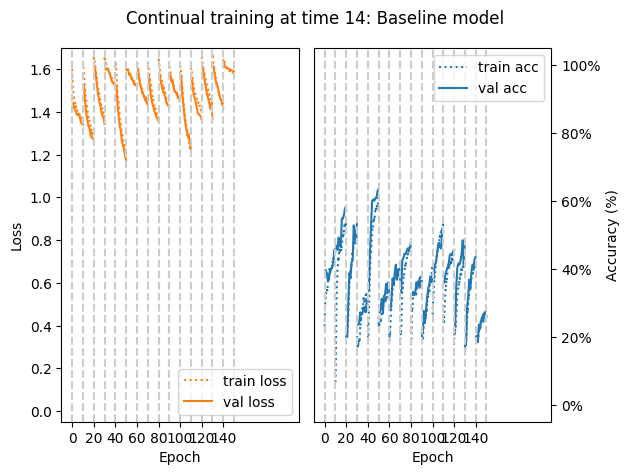

Baseline at t=14 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 16.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 24.00%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 17.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 21.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 19.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 25.60%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 25.60%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 23.20%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 31.20%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 17.60%
['crab', 'lobster', 'snail', 'spider', 'worm']: 28.80%
['baby', 'boy', 'girl', 'man', 'woman']: 27.20%

 +++ AVERAGE TASK TEST ACCURACY: 22.88% +++ 


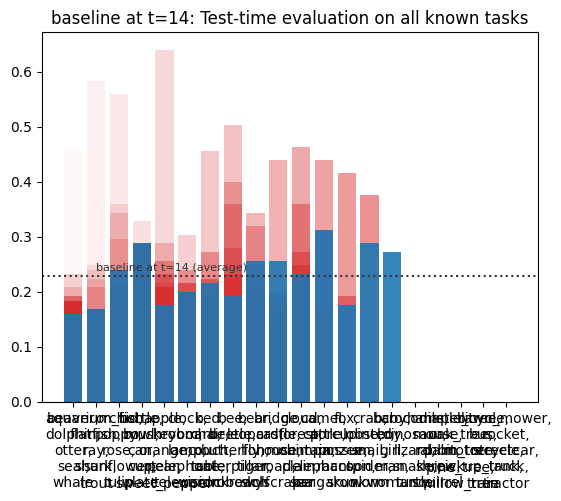

Training on task id: 15  (classification between: ['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle'])


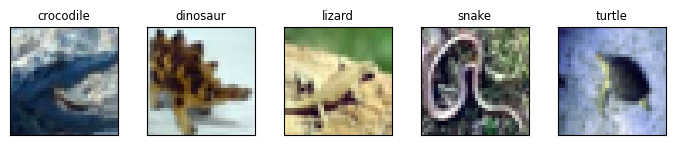

  Adding new task head 15 to multi-task model


E0 batch loss:1.63, batch acc:24.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.09it/s]


epoch:  0 | loss: 1.65 | 1.61   acc: 24.5% | 24.8%


E1 batch loss:1.58, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.20it/s]


epoch:  1 | loss: 1.59 | 1.58   acc: 26.1% | 25.2%


E2 batch loss:1.51, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.06it/s]


epoch:  2 | loss: 1.55 | 1.55   acc: 32.4% | 32.0%


E3 batch loss:1.52, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.20it/s]


epoch:  3 | loss: 1.52 | 1.53   acc: 35.2% | 31.2%


E4 batch loss:1.47, batch acc:46.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.17it/s]


epoch:  4 | loss: 1.50 | 1.51   acc: 37.9% | 38.0%


E5 batch loss:1.50, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.18it/s]


epoch:  5 | loss: 1.48 | 1.49   acc: 38.5% | 36.8%


E6 batch loss:1.50, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.90it/s]


epoch:  6 | loss: 1.47 | 1.49   acc: 41.4% | 37.2%


E7 batch loss:1.42, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.88it/s]


epoch:  7 | loss: 1.45 | 1.46   acc: 42.6% | 38.8%


E8 batch loss:1.45, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.16it/s]


epoch:  8 | loss: 1.44 | 1.45   acc: 41.8% | 39.6%


E9 batch loss:1.48, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.12it/s]


epoch:  9 | loss: 1.43 | 1.44   acc: 41.9% | 40.4%


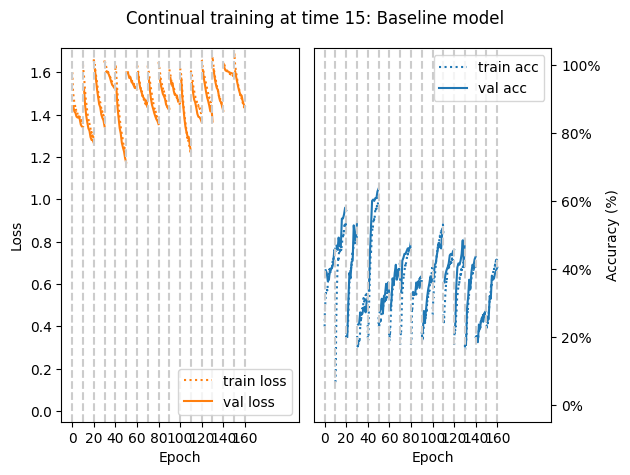

Baseline at t=15 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 17.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 14.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 21.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 17.60%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 25.60%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 26.40%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 24.80%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 24.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 18.40%
['crab', 'lobster', 'snail', 'spider', 'worm']: 21.60%
['baby', 'boy', 'girl', 'man', 'woman']: 20.80%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 46.40%

 +++ AV

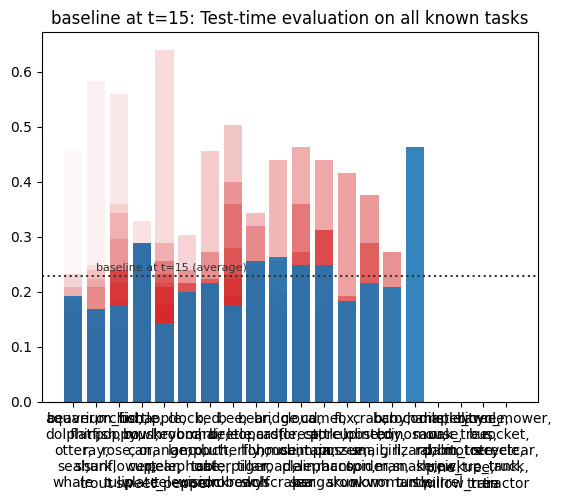

Training on task id: 16  (classification between: ['hamster', 'mouse', 'rabbit', 'shrew', 'squirrel'])


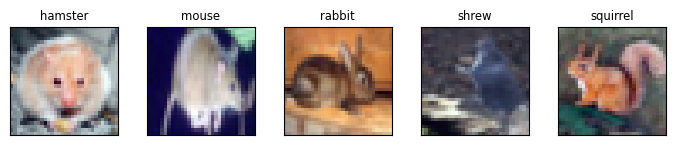

  Adding new task head 16 to multi-task model


E0 batch loss:1.62, batch acc:16.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.42it/s]


epoch:  0 | loss: 1.63 | 1.60   acc: 19.6% | 22.0%


E1 batch loss:1.59, batch acc:22.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.62it/s]


epoch:  1 | loss: 1.59 | 1.58   acc: 20.8% | 20.0%


E2 batch loss:1.59, batch acc:26.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.70it/s]


epoch:  2 | loss: 1.57 | 1.56   acc: 25.5% | 26.8%


E3 batch loss:1.53, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.16it/s]


epoch:  3 | loss: 1.54 | 1.55   acc: 33.3% | 28.4%


E4 batch loss:1.51, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.93it/s]


epoch:  4 | loss: 1.52 | 1.54   acc: 35.9% | 31.2%


E5 batch loss:1.52, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.96it/s]


epoch:  5 | loss: 1.51 | 1.53   acc: 36.6% | 29.2%


E6 batch loss:1.47, batch acc:44.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.85it/s]


epoch:  6 | loss: 1.50 | 1.52   acc: 38.8% | 32.8%


E7 batch loss:1.48, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.97it/s]


epoch:  7 | loss: 1.49 | 1.51   acc: 39.0% | 32.4%


E8 batch loss:1.44, batch acc:44.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.86it/s]


epoch:  8 | loss: 1.47 | 1.51   acc: 40.5% | 34.0%


E9 batch loss:1.45, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.66it/s]


epoch:  9 | loss: 1.46 | 1.50   acc: 40.4% | 35.2%


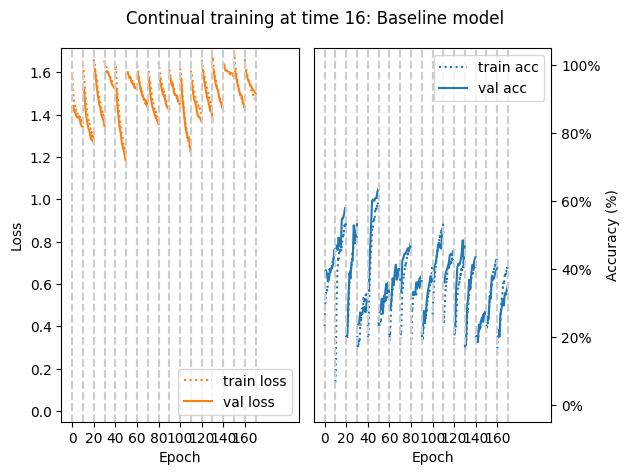

Baseline at t=16 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 28.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 17.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 17.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 28.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 16.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 15.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 25.60%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 27.20%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 21.60%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 22.40%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 20.00%
['crab', 'lobster', 'snail', 'spider', 'worm']: 16.00%
['baby', 'boy', 'girl', 'man', 'woman']: 19.20%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 21.60%
['hamste

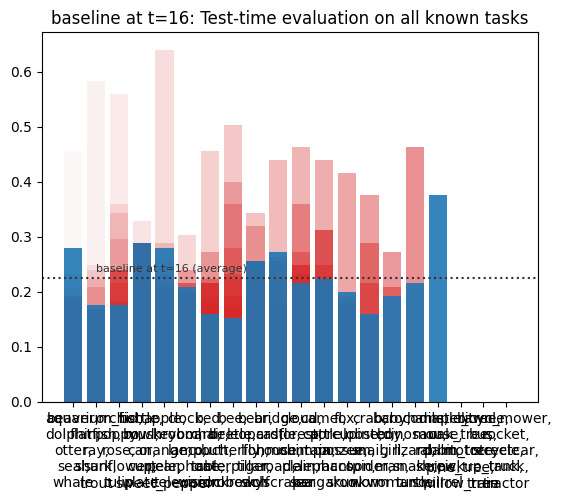

Training on task id: 17  (classification between: ['maple_tree', 'oak_tree', 'palm_tree', 'pine_tree', 'willow_tree'])


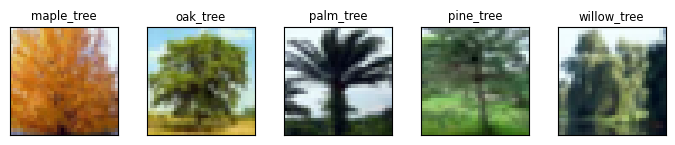

  Adding new task head 17 to multi-task model


E0 batch loss:1.58, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.67it/s]


epoch:  0 | loss: 1.66 | 1.64   acc: 21.2% | 18.0%


E1 batch loss:1.58, batch acc:24.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.68it/s]


epoch:  1 | loss: 1.60 | 1.60   acc: 25.6% | 22.0%


E2 batch loss:1.58, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.77it/s]


epoch:  2 | loss: 1.57 | 1.58   acc: 26.6% | 27.6%


E3 batch loss:1.56, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.66it/s]


epoch:  3 | loss: 1.56 | 1.56   acc: 33.3% | 28.4%


E4 batch loss:1.54, batch acc:27.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.65it/s]


epoch:  4 | loss: 1.54 | 1.55   acc: 32.2% | 29.2%


E5 batch loss:1.51, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.71it/s]


epoch:  5 | loss: 1.53 | 1.54   acc: 37.1% | 31.6%


E6 batch loss:1.57, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.72it/s]


epoch:  6 | loss: 1.53 | 1.53   acc: 36.4% | 36.0%


E7 batch loss:1.51, batch acc:37.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.59it/s]


epoch:  7 | loss: 1.51 | 1.52   acc: 38.2% | 34.0%


E8 batch loss:1.53, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.74it/s]


epoch:  8 | loss: 1.50 | 1.50   acc: 40.1% | 38.4%


E9 batch loss:1.48, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.18it/s]


epoch:  9 | loss: 1.48 | 1.49   acc: 39.3% | 36.4%


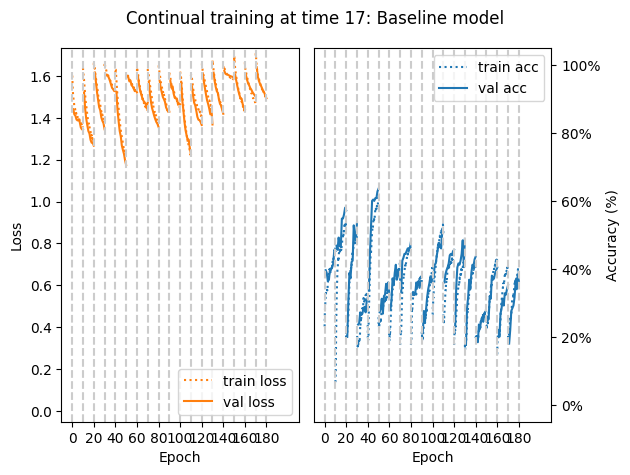

Baseline at t=17 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 16.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 14.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 24.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 20.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 21.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 14.40%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 19.20%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 24.80%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 18.40%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 16.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 20.80%
['crab', 'lobster', 'snail', 'spider', 'worm']: 17.60%
['baby', 'boy', 'girl', 'man', 'woman']: 22.40%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 21.60%
['hamste

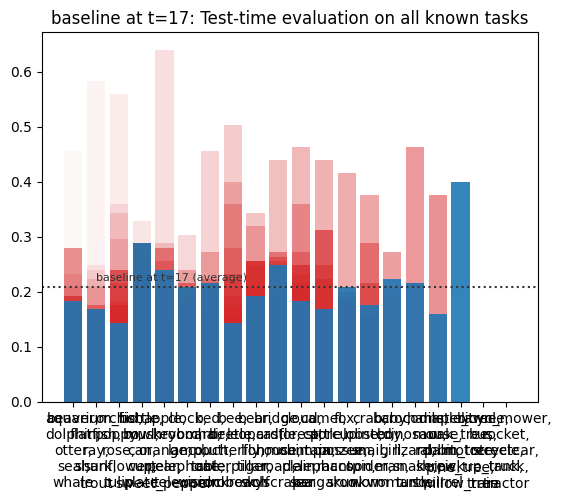

Training on task id: 18  (classification between: ['bicycle', 'bus', 'motorcycle', 'pickup_truck', 'train'])


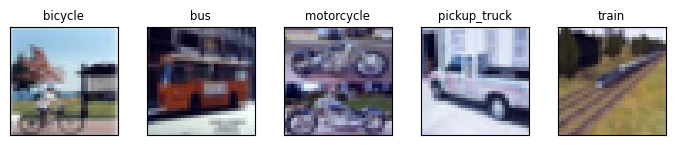

  Adding new task head 18 to multi-task model


E0 batch loss:1.59, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.31it/s]


epoch:  0 | loss: 1.61 | 1.59   acc: 23.9% | 28.0%


E1 batch loss:1.55, batch acc:29.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.76it/s]


epoch:  1 | loss: 1.57 | 1.56   acc: 29.6% | 28.4%


E2 batch loss:1.52, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 23.89it/s]


epoch:  2 | loss: 1.54 | 1.53   acc: 33.0% | 33.2%


E3 batch loss:1.47, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.23it/s]


epoch:  3 | loss: 1.51 | 1.51   acc: 34.9% | 34.0%


E4 batch loss:1.50, batch acc:36.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.05it/s]


epoch:  4 | loss: 1.49 | 1.49   acc: 36.8% | 35.2%


E5 batch loss:1.49, batch acc:31.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.10it/s]


epoch:  5 | loss: 1.48 | 1.48   acc: 38.0% | 38.8%


E6 batch loss:1.46, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.83it/s]


epoch:  6 | loss: 1.46 | 1.46   acc: 39.3% | 38.8%


E7 batch loss:1.47, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 25.03it/s]


epoch:  7 | loss: 1.45 | 1.45   acc: 39.1% | 40.4%


E8 batch loss:1.38, batch acc:42.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.98it/s]


epoch:  8 | loss: 1.42 | 1.43   acc: 42.4% | 40.8%


E9 batch loss:1.29, batch acc:59.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.92it/s]


epoch:  9 | loss: 1.40 | 1.41   acc: 45.1% | 43.6%


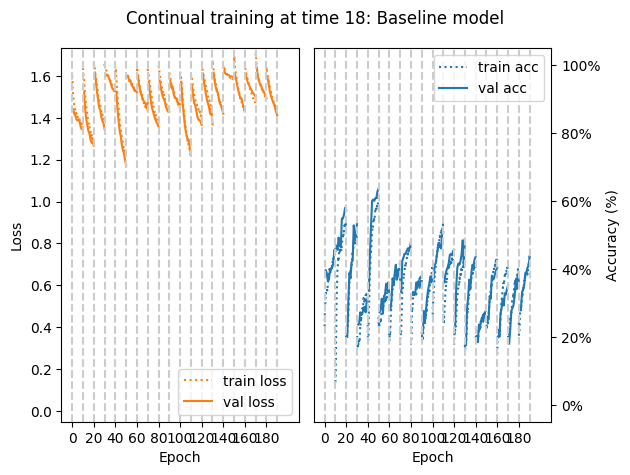

Baseline at t=18 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 13.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 15.20%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 23.20%
['bottle', 'bowl', 'can', 'cup', 'plate']: 29.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 13.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 16.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 21.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 23.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 19.20%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 17.60%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 20.80%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 20.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 16.80%
['crab', 'lobster', 'snail', 'spider', 'worm']: 20.80%
['baby', 'boy', 'girl', 'man', 'woman']: 20.00%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 20.80%
['hamste

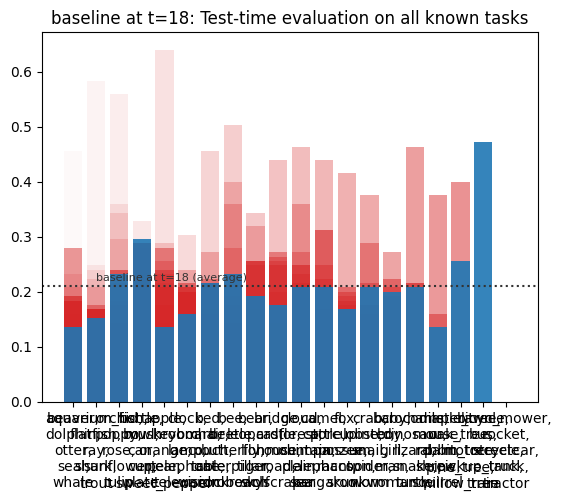

Training on task id: 19  (classification between: ['lawn_mower', 'rocket', 'streetcar', 'tank', 'tractor'])


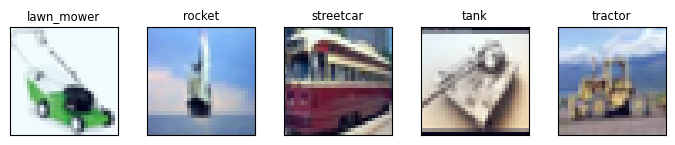

  Adding new task head 19 to multi-task model


E0 batch loss:1.57, batch acc:23.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.83it/s]


epoch:  0 | loss: 1.62 | 1.58   acc: 20.9% | 27.6%


E1 batch loss:1.54, batch acc:40.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.79it/s]


epoch:  1 | loss: 1.56 | 1.52   acc: 30.8% | 44.0%


E2 batch loss:1.48, batch acc:58.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.99it/s]


epoch:  2 | loss: 1.51 | 1.47   acc: 45.6% | 51.6%


E3 batch loss:1.38, batch acc:63.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.98it/s]


epoch:  3 | loss: 1.45 | 1.41   acc: 52.1% | 54.4%


E4 batch loss:1.42, batch acc:53.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.97it/s]


epoch:  4 | loss: 1.41 | 1.36   acc: 53.6% | 58.8%


E5 batch loss:1.31, batch acc:62.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.98it/s]


epoch:  5 | loss: 1.36 | 1.30   acc: 54.5% | 60.4%


E6 batch loss:1.22, batch acc:61.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.96it/s]


epoch:  6 | loss: 1.31 | 1.27   acc: 55.3% | 57.6%


E7 batch loss:1.21, batch acc:57.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.87it/s]


epoch:  7 | loss: 1.27 | 1.22   acc: 56.8% | 60.4%


E8 batch loss:1.31, batch acc:49.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.96it/s]


epoch:  8 | loss: 1.26 | 1.23   acc: 55.4% | 57.6%


E9 batch loss:1.22, batch acc:57.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 24.77it/s]


epoch:  9 | loss: 1.22 | 1.15   acc: 56.8% | 64.4%


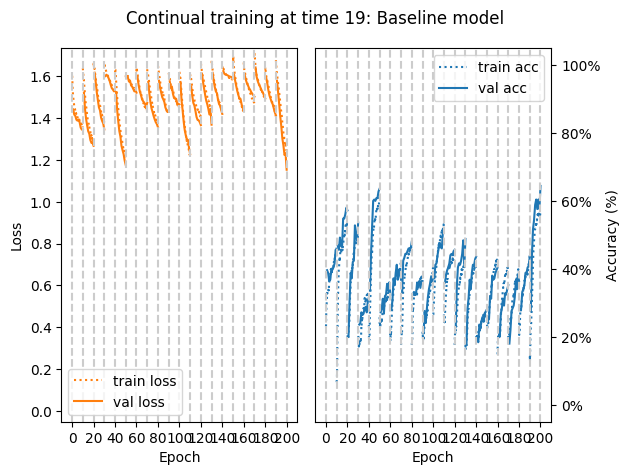

Baseline at t=19 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 13.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 12.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 19.20%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 24.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 15.20%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 25.60%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 12.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 16.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 23.20%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 32.00%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 23.20%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 23.20%
['crab', 'lobster', 'snail', 'spider', 'worm']: 14.40%
['baby', 'boy', 'girl', 'man', 'woman']: 22.40%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 16.00%
['hamste

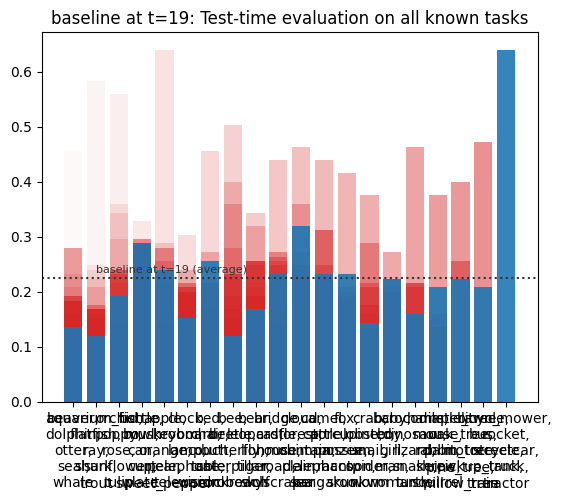


=== Baseline final accuracy averaged over all test tasks: 22.48% ===


In [18]:
INPUT_SIZE = (3,32,32)  # for cifar
baseline_model_training(timestep_tasks, task_test_sets, INPUT_SIZE)

### EWC IMPLEMENTATION

Training on task id: 0  (classification between: ['beaver', 'dolphin', 'otter', 'seal', 'whale'])


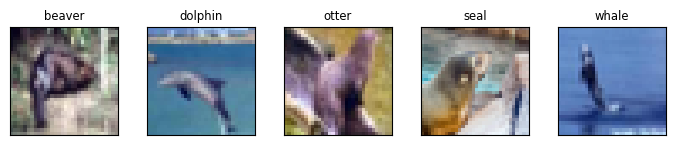

  Adding new task head 0 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.57, batch acc:10.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.18it/s]


epoch:  0 | loss: 1.60 | 1.55   acc: 20.9% | 33.2%


E1 batch loss:1.52, batch acc:28.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 20.06it/s]


epoch:  1 | loss: 1.52 | 1.48   acc: 34.0% | 35.6%


E2 batch loss:1.49, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.60it/s]


epoch:  2 | loss: 1.47 | 1.44   acc: 36.6% | 39.6%


E3 batch loss:1.49, batch acc:27.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.65it/s]


epoch:  3 | loss: 1.45 | 1.43   acc: 35.5% | 38.4%


E4 batch loss:1.48, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.65it/s]


epoch:  4 | loss: 1.45 | 1.43   acc: 37.2% | 37.6%


E5 batch loss:1.46, batch acc:33.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.21it/s]


epoch:  5 | loss: 1.43 | 1.41   acc: 37.4% | 40.0%


E6 batch loss:1.48, batch acc:35.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.35it/s]


epoch:  6 | loss: 1.43 | 1.42   acc: 37.6% | 38.0%


E7 batch loss:1.46, batch acc:32.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.22it/s]


epoch:  7 | loss: 1.42 | 1.40   acc: 37.6% | 38.8%


E8 batch loss:1.44, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 18.76it/s]


epoch:  8 | loss: 1.41 | 1.38   acc: 41.2% | 42.0%


E9 batch loss:1.45, batch acc:39.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 19.89it/s]


epoch:  9 | loss: 1.41 | 1.40   acc: 40.6% | 38.8%


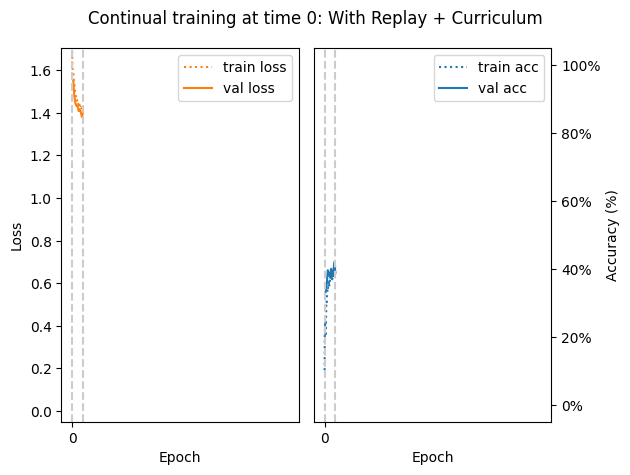

Replay+curriculum at t=0 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 45.60%

 +++ AVERAGE TASK TEST ACCURACY: 45.60% +++ 


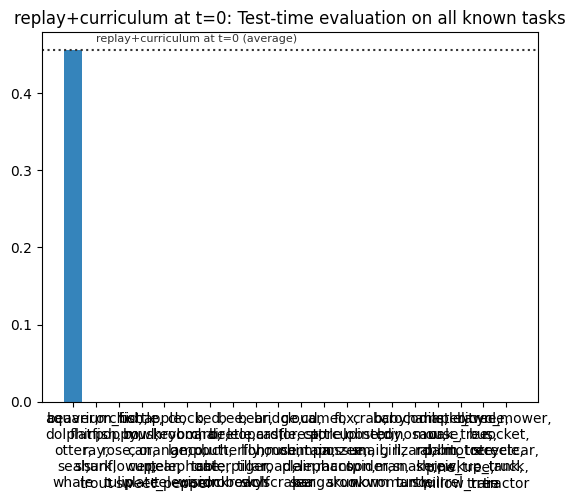

Training on task id: 1  (classification between: ['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout'])


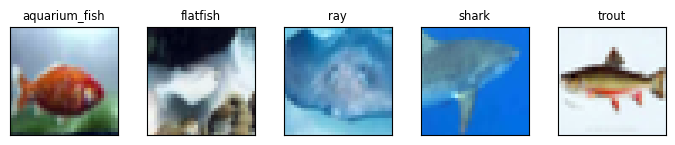

  Adding new task head 1 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.56, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.52it/s]


epoch:  0 | loss: 1.57 | 1.56   acc: 30.6% | 32.4%


E1 batch loss:1.56, batch acc:23.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.80it/s]


epoch:  1 | loss: 1.54 | 1.54   acc: 31.5% | 28.0%


E2 batch loss:1.53, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.84it/s]


epoch:  2 | loss: 1.52 | 1.53   acc: 34.5% | 36.8%


E3 batch loss:1.50, batch acc:37.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.79it/s]


epoch:  3 | loss: 1.51 | 1.51   acc: 36.7% | 38.4%


E4 batch loss:1.51, batch acc:37.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.78it/s]


epoch:  4 | loss: 1.49 | 1.51   acc: 36.8% | 41.6%


E5 batch loss:1.49, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.79it/s]


epoch:  5 | loss: 1.49 | 1.49   acc: 40.0% | 43.6%


E6 batch loss:1.48, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.78it/s]


epoch:  6 | loss: 1.47 | 1.48   acc: 41.8% | 44.4%


E7 batch loss:1.46, batch acc:40.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.90it/s]


epoch:  7 | loss: 1.47 | 1.48   acc: 40.2% | 44.8%


E8 batch loss:1.44, batch acc:45.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.93it/s]


epoch:  8 | loss: 1.46 | 1.46   acc: 43.7% | 47.6%


E9 batch loss:1.41, batch acc:53.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.87it/s]


epoch:  9 | loss: 1.44 | 1.46   acc: 47.4% | 52.0%


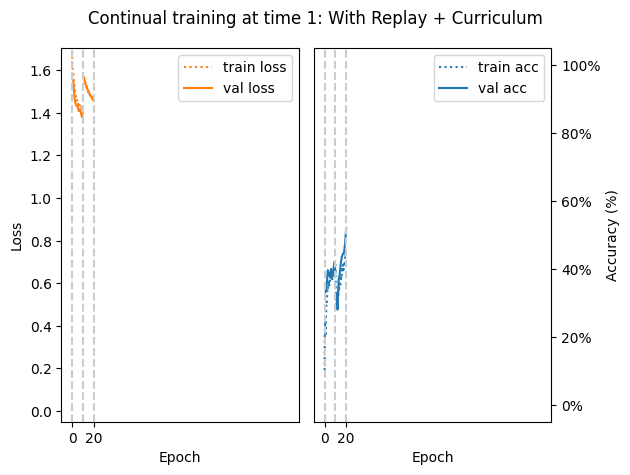

Replay+curriculum at t=1 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 36.80%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 50.40%

 +++ AVERAGE TASK TEST ACCURACY: 43.60% +++ 


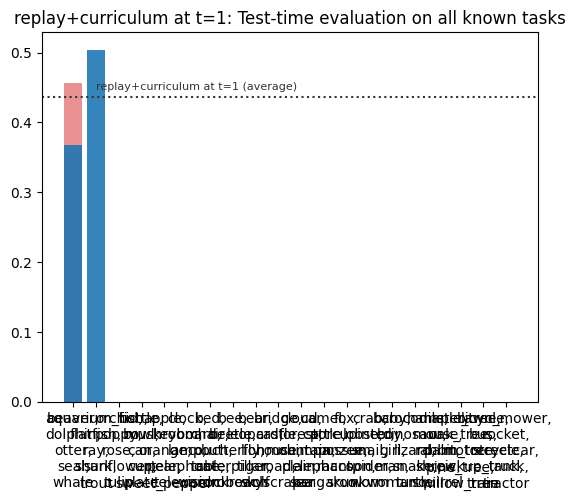

Training on task id: 2  (classification between: ['orchid', 'poppy', 'rose', 'sunflower', 'tulip'])


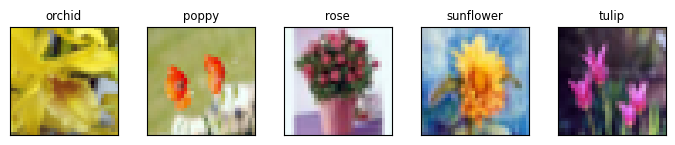

  Adding new task head 2 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.68, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.10it/s]


epoch:  0 | loss: 1.62 | 1.63   acc: 25.9% | 25.2%


E1 batch loss:1.64, batch acc:18.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.78it/s]


epoch:  1 | loss: 1.60 | 1.61   acc: 23.7% | 20.8%


E2 batch loss:1.63, batch acc:18.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.19it/s]


epoch:  2 | loss: 1.59 | 1.60   acc: 24.0% | 24.4%


E3 batch loss:1.61, batch acc:21.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.19it/s]


epoch:  3 | loss: 1.58 | 1.59   acc: 28.3% | 30.4%


E4 batch loss:1.58, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.80it/s]


epoch:  4 | loss: 1.57 | 1.58   acc: 29.2% | 30.0%


E5 batch loss:1.54, batch acc:32.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.69it/s]


epoch:  5 | loss: 1.54 | 1.54   acc: 33.7% | 32.8%


E6 batch loss:1.54, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.72it/s]


epoch:  6 | loss: 1.52 | 1.51   acc: 34.6% | 39.2%


E7 batch loss:1.52, batch acc:39.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.75it/s]


epoch:  7 | loss: 1.50 | 1.47   acc: 41.3% | 45.2%


E8 batch loss:1.56, batch acc:35.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.76it/s]


epoch:  8 | loss: 1.48 | 1.46   acc: 41.6% | 42.4%


E9 batch loss:1.50, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.43it/s]


epoch:  9 | loss: 1.46 | 1.47   acc: 45.5% | 42.8%


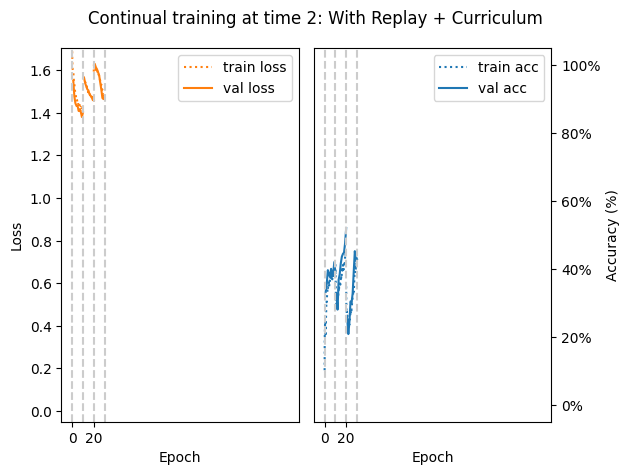

Replay+curriculum at t=2 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 27.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 44.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 44.00%

 +++ AVERAGE TASK TEST ACCURACY: 38.40% +++ 


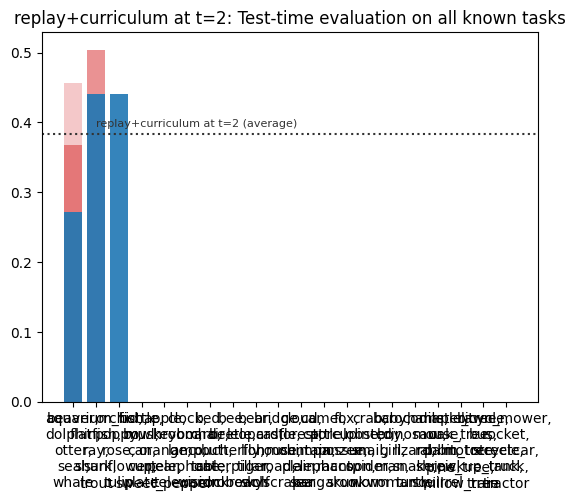

Training on task id: 3  (classification between: ['bottle', 'bowl', 'can', 'cup', 'plate'])


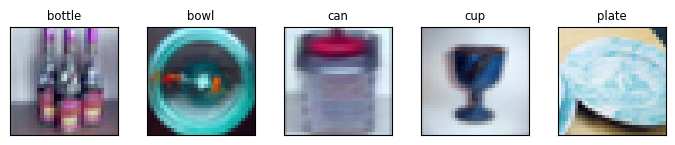

  Adding new task head 3 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.59, batch acc:20.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.99it/s]


epoch:  0 | loss: 1.58 | 1.59   acc: 24.1% | 26.8%


E1 batch loss:1.57, batch acc:15.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.95it/s]


epoch:  1 | loss: 1.57 | 1.58   acc: 25.3% | 24.4%


E2 batch loss:1.52, batch acc:18.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.31it/s]


epoch:  2 | loss: 1.57 | 1.58   acc: 25.7% | 25.6%


E3 batch loss:1.54, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.29it/s]


epoch:  3 | loss: 1.57 | 1.58   acc: 26.2% | 27.2%


E4 batch loss:1.57, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.49it/s]


epoch:  4 | loss: 1.57 | 1.57   acc: 26.8% | 26.0%


E5 batch loss:1.53, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.47it/s]


epoch:  5 | loss: 1.56 | 1.57   acc: 26.4% | 29.6%


E6 batch loss:1.53, batch acc:27.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.27it/s]


epoch:  6 | loss: 1.56 | 1.57   acc: 28.6% | 28.8%


E7 batch loss:1.49, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.39it/s]


epoch:  7 | loss: 1.56 | 1.57   acc: 27.4% | 27.2%


E8 batch loss:1.53, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 16.06it/s]


epoch:  8 | loss: 1.55 | 1.57   acc: 27.6% | 27.6%


E9 batch loss:1.47, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.75it/s]


epoch:  9 | loss: 1.55 | 1.56   acc: 30.0% | 27.6%


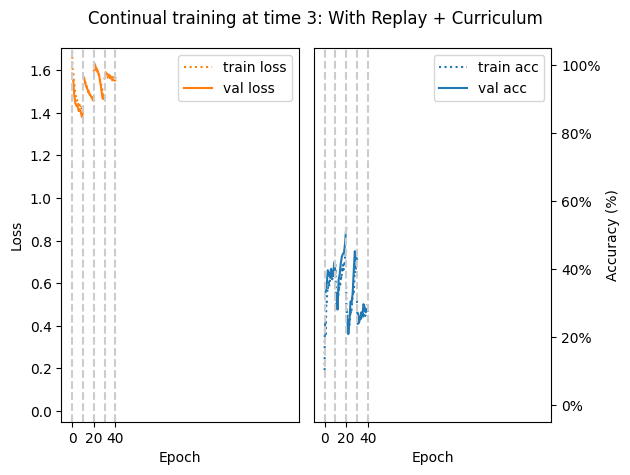

Replay+curriculum at t=3 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 32.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 44.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 42.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%

 +++ AVERAGE TASK TEST ACCURACY: 36.80% +++ 


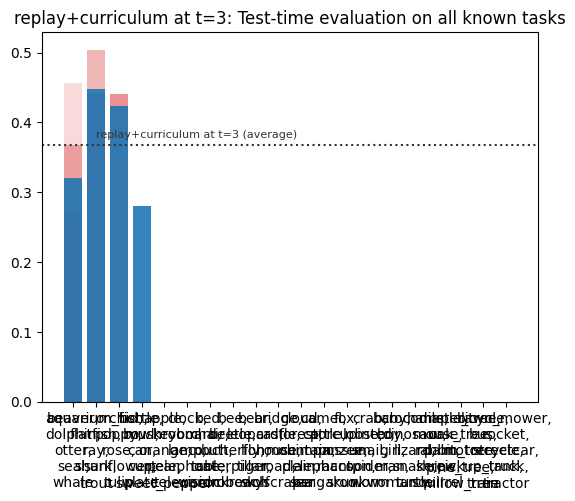

Training on task id: 4  (classification between: ['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper'])


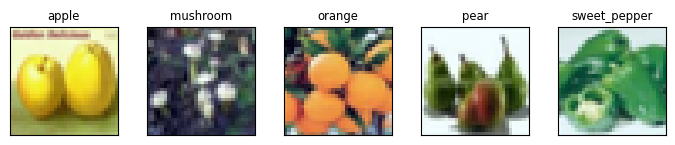

  Adding new task head 4 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.54, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.62it/s]


epoch:  0 | loss: 1.56 | 1.58   acc: 26.7% | 31.6%


E1 batch loss:1.50, batch acc:51.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.87it/s]


epoch:  1 | loss: 1.54 | 1.55   acc: 33.1% | 42.0%


E2 batch loss:1.49, batch acc:55.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.25it/s]


epoch:  2 | loss: 1.53 | 1.55   acc: 37.9% | 35.2%


E3 batch loss:1.48, batch acc:47.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.77it/s]


epoch:  3 | loss: 1.51 | 1.52   acc: 42.4% | 47.2%


E4 batch loss:1.49, batch acc:52.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.50it/s]


epoch:  4 | loss: 1.50 | 1.52   acc: 45.3% | 46.8%


E5 batch loss:1.48, batch acc:47.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.92it/s]


epoch:  5 | loss: 1.50 | 1.51   acc: 47.0% | 46.0%


E6 batch loss:1.46, batch acc:50.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.89it/s]


epoch:  6 | loss: 1.48 | 1.49   acc: 48.8% | 48.0%


E7 batch loss:1.48, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.84it/s]


epoch:  7 | loss: 1.47 | 1.47   acc: 50.6% | 48.8%


E8 batch loss:1.44, batch acc:45.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.66it/s]


epoch:  8 | loss: 1.46 | 1.47   acc: 49.4% | 48.4%


E9 batch loss:1.49, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.87it/s]


epoch:  9 | loss: 1.45 | 1.47   acc: 52.5% | 50.0%


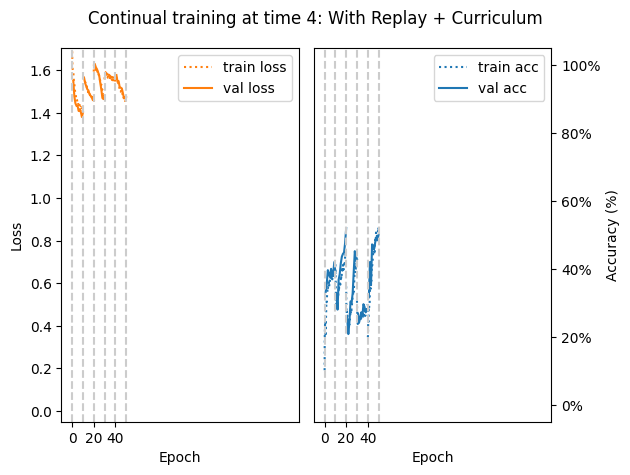

Replay+curriculum at t=4 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 37.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 49.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 42.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 20.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 48.80%

 +++ AVERAGE TASK TEST ACCURACY: 39.84% +++ 


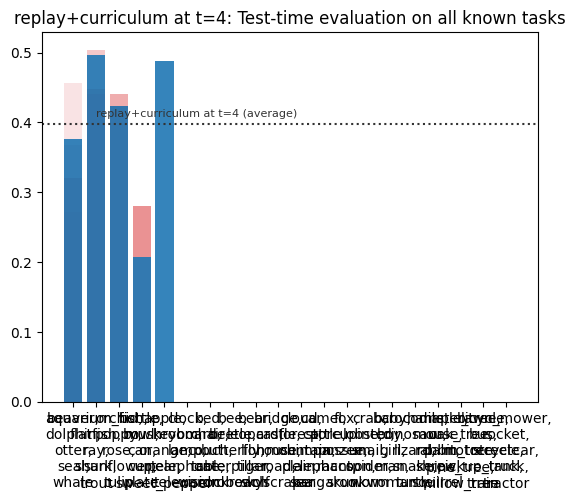

Training on task id: 5  (classification between: ['clock', 'keyboard', 'lamp', 'telephone', 'television'])


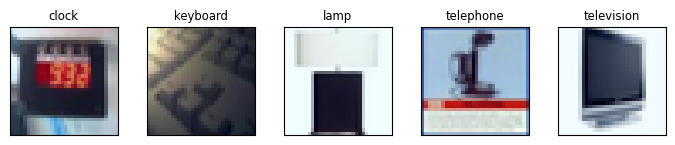

  Adding new task head 5 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.55, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.33it/s]


epoch:  0 | loss: 1.57 | 1.61   acc: 26.6% | 17.6%


E1 batch loss:1.53, batch acc:40.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.18it/s]


epoch:  1 | loss: 1.57 | 1.62   acc: 27.7% | 21.2%


E2 batch loss:1.52, batch acc:48.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.84it/s]


epoch:  2 | loss: 1.56 | 1.61   acc: 29.0% | 17.2%


E3 batch loss:1.53, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.21it/s]


epoch:  3 | loss: 1.56 | 1.60   acc: 26.4% | 20.8%


E4 batch loss:1.53, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.74it/s]


epoch:  4 | loss: 1.56 | 1.60   acc: 30.3% | 20.0%


E5 batch loss:1.53, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.62it/s]


epoch:  5 | loss: 1.56 | 1.61   acc: 26.3% | 23.2%


E6 batch loss:1.53, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.70it/s]


epoch:  6 | loss: 1.56 | 1.61   acc: 30.6% | 19.2%


E7 batch loss:1.52, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.53it/s]


epoch:  7 | loss: 1.56 | 1.61   acc: 29.2% | 23.2%


E8 batch loss:1.47, batch acc:46.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.27it/s]


epoch:  8 | loss: 1.55 | 1.61   acc: 32.0% | 21.2%


E9 batch loss:1.51, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.29it/s]


epoch:  9 | loss: 1.55 | 1.60   acc: 30.2% | 22.4%


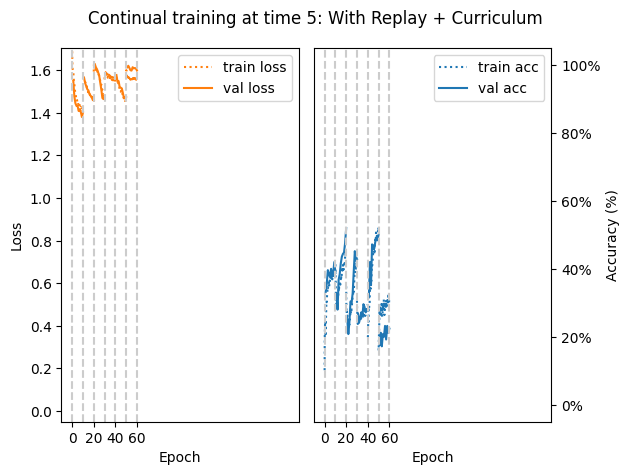

Replay+curriculum at t=5 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 40.80%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 53.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 44.80%
['bottle', 'bowl', 'can', 'cup', 'plate']: 25.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 54.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.80%

 +++ AVERAGE TASK TEST ACCURACY: 41.33% +++ 


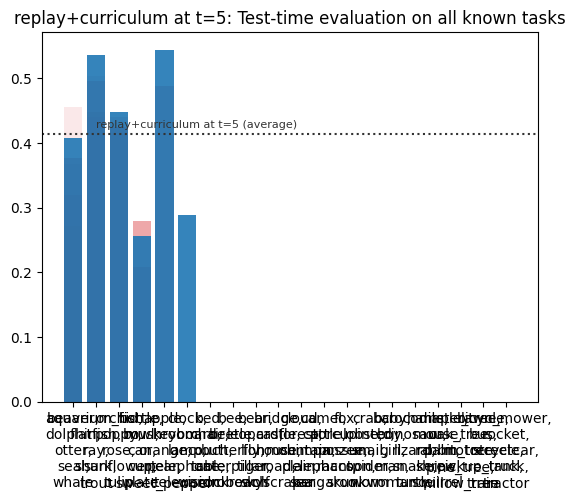

Training on task id: 6  (classification between: ['bed', 'chair', 'couch', 'table', 'wardrobe'])


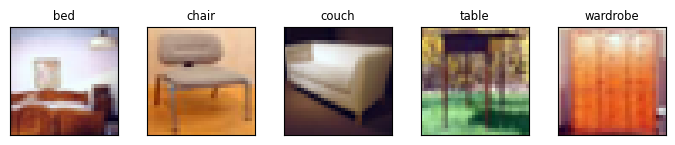

  Adding new task head 6 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.61, batch acc: 9.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.09it/s]


epoch:  0 | loss: 1.58 | 1.60   acc: 23.1% | 16.4%


E1 batch loss:1.60, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.02it/s]


epoch:  1 | loss: 1.57 | 1.58   acc: 26.1% | 22.4%


E2 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.24it/s]


epoch:  2 | loss: 1.56 | 1.58   acc: 30.0% | 24.4%


E3 batch loss:1.52, batch acc:32.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.77it/s]


epoch:  3 | loss: 1.55 | 1.57   acc: 33.1% | 24.4%


E4 batch loss:1.53, batch acc:48.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.51it/s]


epoch:  4 | loss: 1.54 | 1.57   acc: 34.0% | 26.4%


E5 batch loss:1.49, batch acc:54.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.05it/s]


epoch:  5 | loss: 1.53 | 1.56   acc: 37.2% | 32.4%


E6 batch loss:1.48, batch acc:50.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.38it/s]


epoch:  6 | loss: 1.53 | 1.56   acc: 35.5% | 28.8%


E7 batch loss:1.43, batch acc:54.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.34it/s]


epoch:  7 | loss: 1.52 | 1.55   acc: 35.6% | 32.8%


E8 batch loss:1.46, batch acc:52.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.91it/s]


epoch:  8 | loss: 1.52 | 1.55   acc: 36.6% | 34.8%


E9 batch loss:1.44, batch acc:52.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 15.26it/s]


epoch:  9 | loss: 1.53 | 1.55   acc: 36.7% | 34.4%


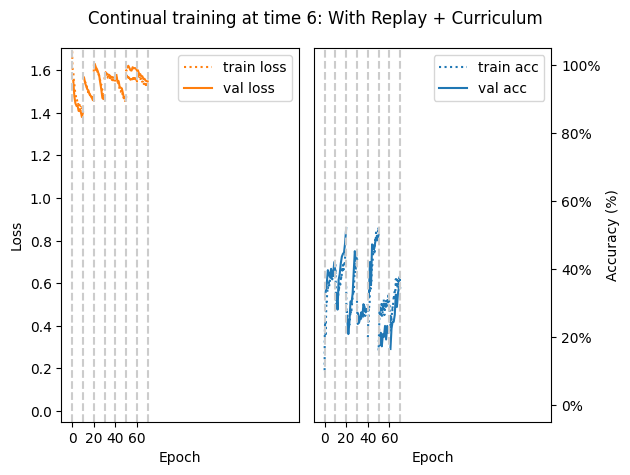

Replay+curriculum at t=6 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 34.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 52.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 38.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 30.40%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 56.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 29.60%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 32.80%

 +++ AVERAGE TASK TEST ACCURACY: 39.09% +++ 


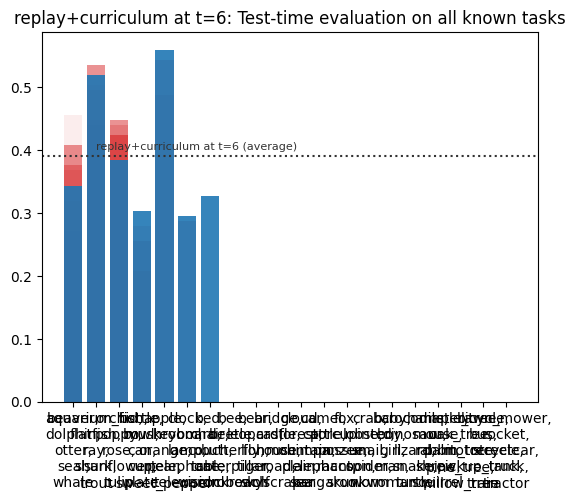

Training on task id: 7  (classification between: ['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach'])


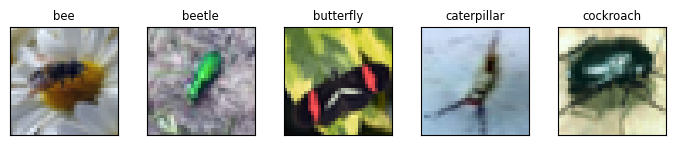

  Adding new task head 7 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.77, batch acc:16.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.42it/s]


epoch:  0 | loss: 1.62 | 1.62   acc: 24.5% | 27.6%


E1 batch loss:1.71, batch acc:16.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.65it/s]


epoch:  1 | loss: 1.60 | 1.59   acc: 26.7% | 28.0%


E2 batch loss:1.68, batch acc:17.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.71it/s]


epoch:  2 | loss: 1.57 | 1.58   acc: 29.1% | 26.0%


E3 batch loss:1.65, batch acc:18.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.88it/s]


epoch:  3 | loss: 1.56 | 1.57   acc: 29.9% | 28.8%


E4 batch loss:1.65, batch acc:16.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.89it/s]


epoch:  4 | loss: 1.57 | 1.56   acc: 28.7% | 29.6%


E5 batch loss:1.61, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.92it/s]


epoch:  5 | loss: 1.56 | 1.55   acc: 27.4% | 30.4%


E6 batch loss:1.58, batch acc:16.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.80it/s]


epoch:  6 | loss: 1.53 | 1.53   acc: 30.6% | 30.8%


E7 batch loss:1.58, batch acc:16.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.47it/s]


epoch:  7 | loss: 1.53 | 1.55   acc: 29.0% | 27.6%


E8 batch loss:1.59, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.90it/s]


epoch:  8 | loss: 1.53 | 1.54   acc: 30.2% | 31.2%


E9 batch loss:1.56, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.81it/s]


epoch:  9 | loss: 1.53 | 1.54   acc: 30.2% | 30.4%


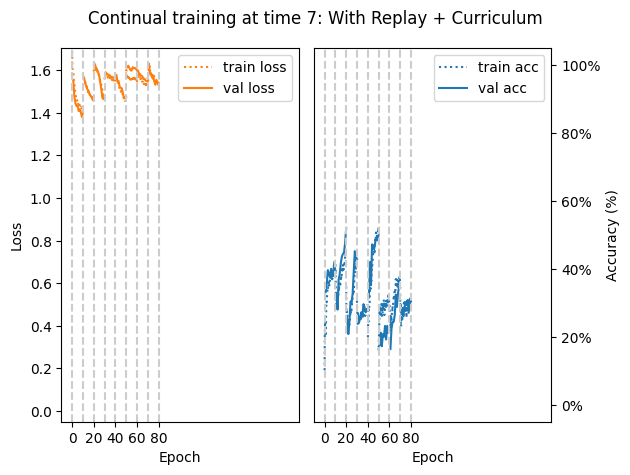

Replay+curriculum at t=7 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 30.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 45.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 39.20%
['bottle', 'bowl', 'can', 'cup', 'plate']: 22.40%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 50.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 27.20%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 28.00%

 +++ AVERAGE TASK TEST ACCURACY: 34.00% +++ 


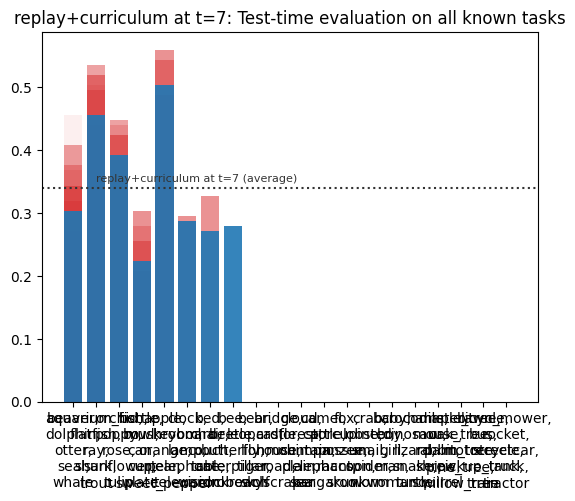

Training on task id: 8  (classification between: ['bear', 'leopard', 'lion', 'tiger', 'wolf'])


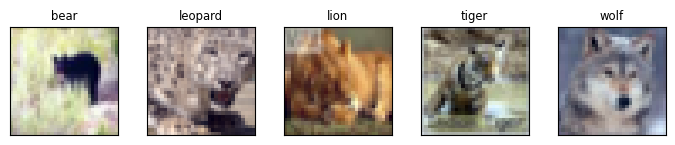

  Adding new task head 8 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.57, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.31it/s]


epoch:  0 | loss: 1.60 | 1.65   acc: 24.9% | 18.0%


E1 batch loss:1.55, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.25it/s]


epoch:  1 | loss: 1.59 | 1.63   acc: 25.8% | 25.6%


E2 batch loss:1.54, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.04it/s]


epoch:  2 | loss: 1.58 | 1.62   acc: 27.8% | 24.0%


E3 batch loss:1.55, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.21it/s]


epoch:  3 | loss: 1.58 | 1.62   acc: 25.8% | 21.2%


E4 batch loss:1.50, batch acc:39.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.22it/s]


epoch:  4 | loss: 1.56 | 1.60   acc: 27.4% | 23.6%


E5 batch loss:1.53, batch acc:35.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.26it/s]


epoch:  5 | loss: 1.56 | 1.61   acc: 30.1% | 21.2%


E6 batch loss:1.53, batch acc:37.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.98it/s]


epoch:  6 | loss: 1.57 | 1.61   acc: 27.3% | 24.0%


E7 batch loss:1.54, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.99it/s]


epoch:  7 | loss: 1.57 | 1.61   acc: 29.5% | 23.6%


E8 batch loss:1.50, batch acc:39.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.20it/s]


epoch:  8 | loss: 1.56 | 1.60   acc: 28.5% | 24.8%


E9 batch loss:1.51, batch acc:37.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.23it/s]


epoch:  9 | loss: 1.56 | 1.61   acc: 28.6% | 24.0%


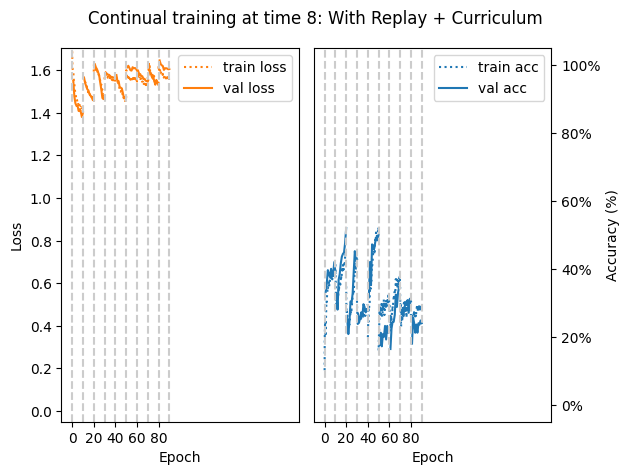

Replay+curriculum at t=8 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 32.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 51.20%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 46.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 25.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 56.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 32.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 32.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 30.40%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 28.80%

 +++ AVERAGE TASK TEST ACCURACY: 37.24% +++ 


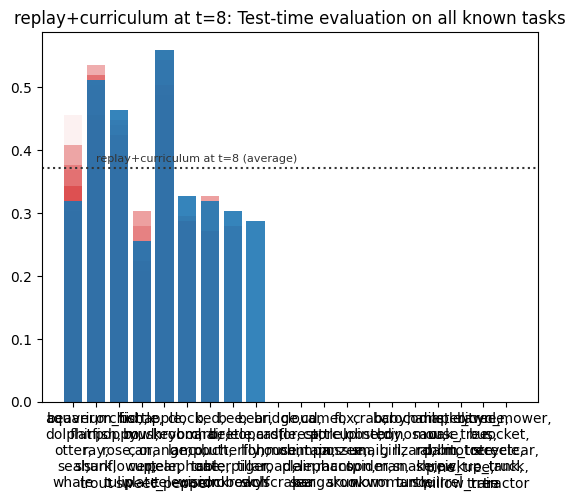

Training on task id: 9  (classification between: ['bridge', 'castle', 'house', 'road', 'skyscraper'])


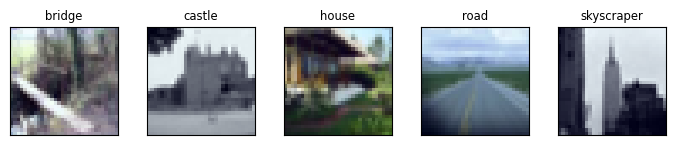

  Adding new task head 9 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.57, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.30it/s]


epoch:  0 | loss: 1.60 | 1.64   acc: 19.6% | 17.2%


E1 batch loss:1.56, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.14it/s]


epoch:  1 | loss: 1.59 | 1.65   acc: 22.4% | 17.6%


E2 batch loss:1.53, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.45it/s]


epoch:  2 | loss: 1.59 | 1.64   acc: 24.4% | 18.4%


E3 batch loss:1.52, batch acc:33.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.81it/s]


epoch:  3 | loss: 1.58 | 1.63   acc: 24.9% | 19.6%


E4 batch loss:1.55, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.38it/s]


epoch:  4 | loss: 1.58 | 1.62   acc: 24.7% | 19.6%


E5 batch loss:1.54, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.08it/s]


epoch:  5 | loss: 1.57 | 1.63   acc: 25.3% | 19.2%


E6 batch loss:1.52, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.17it/s]


epoch:  6 | loss: 1.57 | 1.63   acc: 26.9% | 17.6%


E7 batch loss:1.53, batch acc:38.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.92it/s]


epoch:  7 | loss: 1.57 | 1.62   acc: 25.5% | 20.4%


E8 batch loss:1.53, batch acc:35.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.14it/s]


epoch:  8 | loss: 1.56 | 1.63   acc: 27.3% | 20.0%


E9 batch loss:1.52, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.16it/s]


epoch:  9 | loss: 1.57 | 1.63   acc: 26.0% | 15.6%


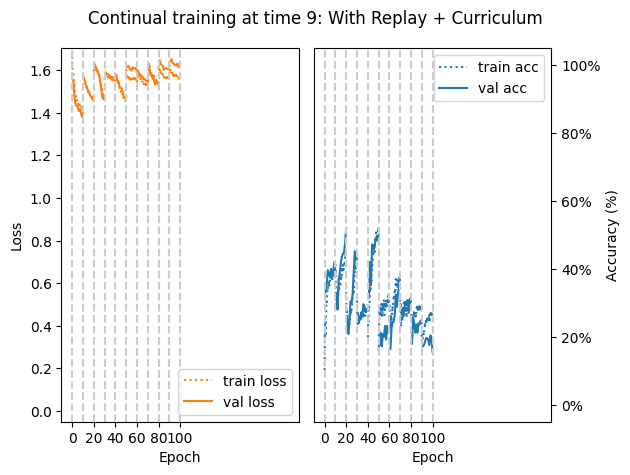

Replay+curriculum at t=9 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 29.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 50.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 45.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 27.20%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 58.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 28.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 35.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 28.00%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 18.40%

 +++ AVERAGE TASK TEST ACCURACY: 34.96% +++ 


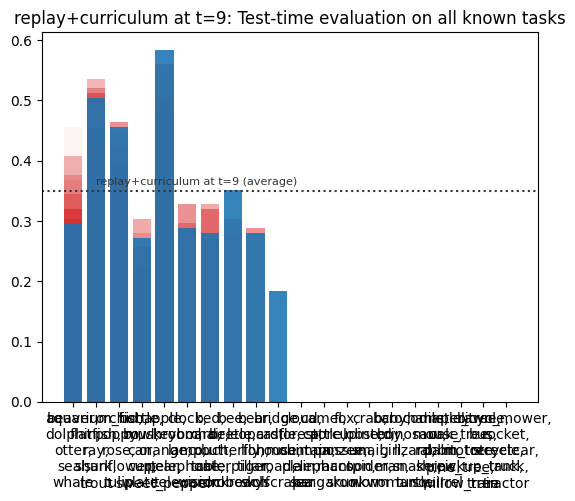

Training on task id: 10  (classification between: ['cloud', 'forest', 'mountain', 'plain', 'sea'])


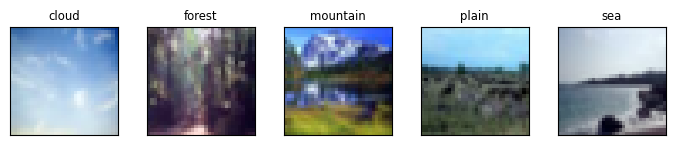

  Adding new task head 10 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.68, batch acc:21.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.55it/s]


epoch:  0 | loss: 1.61 | 1.64   acc: 23.0% | 20.0%


E1 batch loss:1.63, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.51it/s]


epoch:  1 | loss: 1.60 | 1.60   acc: 26.3% | 21.2%


E2 batch loss:1.63, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.82it/s]


epoch:  2 | loss: 1.58 | 1.59   acc: 26.2% | 17.6%


E3 batch loss:1.61, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.85it/s]


epoch:  3 | loss: 1.58 | 1.57   acc: 24.5% | 21.2%


E4 batch loss:1.62, batch acc:27.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.35it/s]


epoch:  4 | loss: 1.56 | 1.57   acc: 29.1% | 28.4%


E5 batch loss:1.61, batch acc:20.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.49it/s]


epoch:  5 | loss: 1.56 | 1.57   acc: 27.6% | 24.4%


E6 batch loss:1.55, batch acc:32.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.44it/s]


epoch:  6 | loss: 1.55 | 1.56   acc: 30.0% | 25.6%


E7 batch loss:1.58, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.54it/s]


epoch:  7 | loss: 1.55 | 1.55   acc: 30.2% | 26.0%


E8 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.30it/s]


epoch:  8 | loss: 1.54 | 1.53   acc: 31.1% | 31.6%


E9 batch loss:1.57, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.50it/s]


epoch:  9 | loss: 1.52 | 1.53   acc: 31.5% | 34.0%


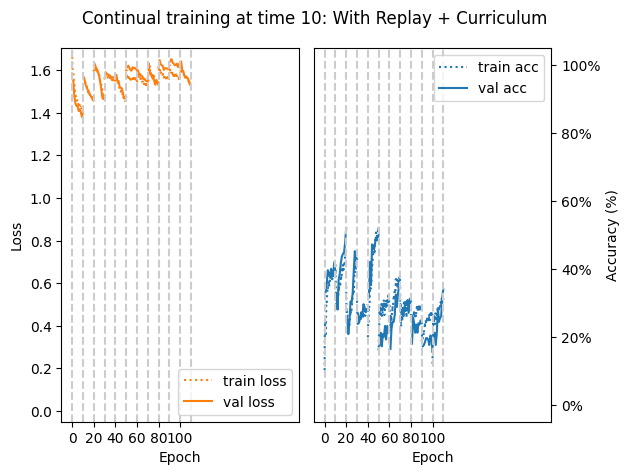

Replay+curriculum at t=10 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 34.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 50.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 40.80%
['bottle', 'bowl', 'can', 'cup', 'plate']: 24.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 57.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 29.60%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 28.80%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 39.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 28.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 16.00%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 33.60%

 +++ AVERAGE TASK TEST ACCURACY: 34.91% +++ 


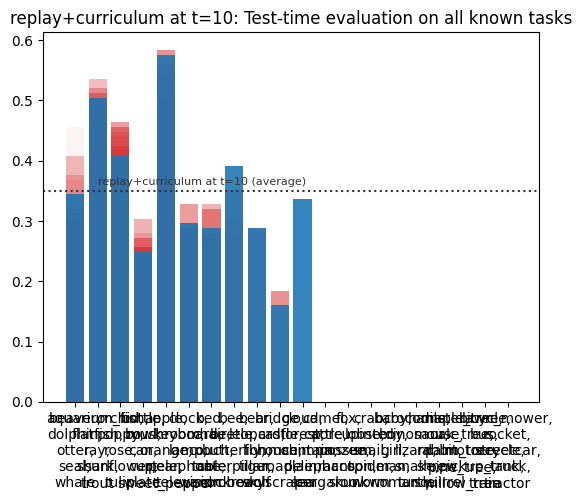

Training on task id: 11  (classification between: ['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo'])


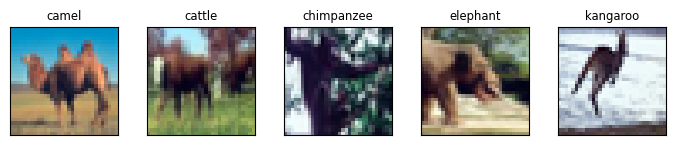

  Adding new task head 11 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.56, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.25it/s]


epoch:  0 | loss: 1.61 | 1.65   acc: 24.5% | 21.2%


E1 batch loss:1.47, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.43it/s]


epoch:  1 | loss: 1.60 | 1.65   acc: 26.7% | 19.2%


E2 batch loss:1.51, batch acc:38.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.43it/s]


epoch:  2 | loss: 1.60 | 1.64   acc: 26.2% | 19.2%


E3 batch loss:1.53, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.48it/s]


epoch:  3 | loss: 1.60 | 1.62   acc: 26.9% | 24.0%


E4 batch loss:1.49, batch acc:41.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.51it/s]


epoch:  4 | loss: 1.58 | 1.61   acc: 28.1% | 26.8%


E5 batch loss:1.45, batch acc:41.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.48it/s]


epoch:  5 | loss: 1.57 | 1.58   acc: 29.8% | 27.2%


E6 batch loss:1.46, batch acc:41.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.41it/s]


epoch:  6 | loss: 1.56 | 1.58   acc: 28.9% | 28.8%


E7 batch loss:1.42, batch acc:43.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.54it/s]


epoch:  7 | loss: 1.56 | 1.58   acc: 30.2% | 27.2%


E8 batch loss:1.47, batch acc:41.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.33it/s]


epoch:  8 | loss: 1.55 | 1.59   acc: 31.1% | 28.4%


E9 batch loss:1.44, batch acc:44.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.59it/s]


epoch:  9 | loss: 1.56 | 1.58   acc: 31.2% | 29.6%


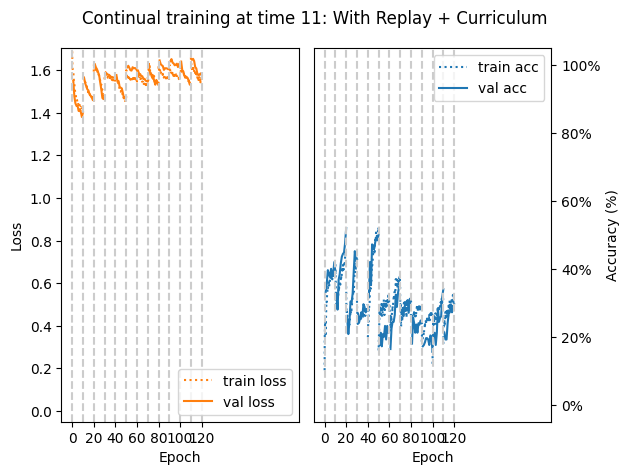

Replay+curriculum at t=11 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 25.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 50.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 45.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 25.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 48.80%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 24.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 36.80%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 32.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 21.60%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 41.60%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 34.40%

 +++ AVERAGE TASK TEST ACCURACY: 34.60% +++ 


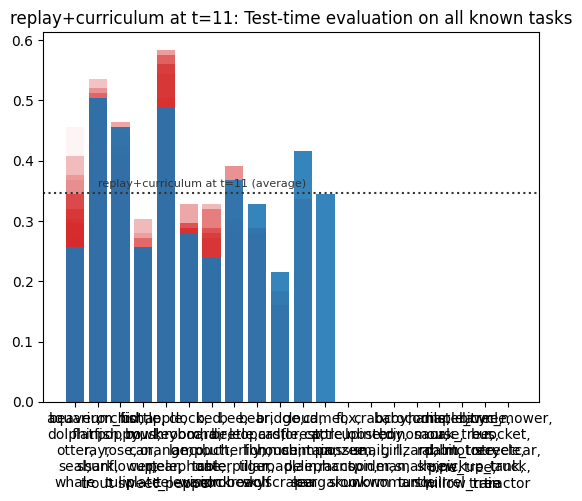

Training on task id: 12  (classification between: ['fox', 'porcupine', 'possum', 'raccoon', 'skunk'])


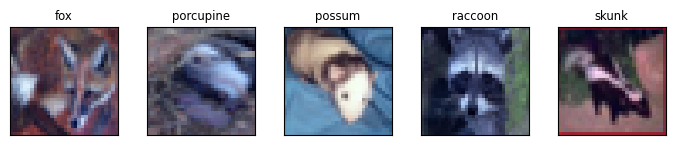

  Adding new task head 12 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.60, batch acc:23.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.40it/s]


epoch:  0 | loss: 1.61 | 1.64   acc: 21.3% | 17.2%


E1 batch loss:1.61, batch acc:23.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.14it/s]


epoch:  1 | loss: 1.60 | 1.64   acc: 21.2% | 16.8%


E2 batch loss:1.59, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.76it/s]


epoch:  2 | loss: 1.59 | 1.64   acc: 22.0% | 18.0%


E3 batch loss:1.60, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.72it/s]


epoch:  3 | loss: 1.59 | 1.64   acc: 22.7% | 18.0%


E4 batch loss:1.58, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.67it/s]


epoch:  4 | loss: 1.59 | 1.64   acc: 21.9% | 17.6%


E5 batch loss:1.59, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.42it/s]


epoch:  5 | loss: 1.59 | 1.64   acc: 23.8% | 19.2%


E6 batch loss:1.56, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.84it/s]


epoch:  6 | loss: 1.58 | 1.62   acc: 24.6% | 18.4%


E7 batch loss:1.55, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.52it/s]


epoch:  7 | loss: 1.57 | 1.62   acc: 26.0% | 21.2%


E8 batch loss:1.60, batch acc:21.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.52it/s]


epoch:  8 | loss: 1.58 | 1.62   acc: 25.1% | 19.2%


E9 batch loss:1.62, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.63it/s]


epoch:  9 | loss: 1.58 | 1.63   acc: 24.1% | 20.0%


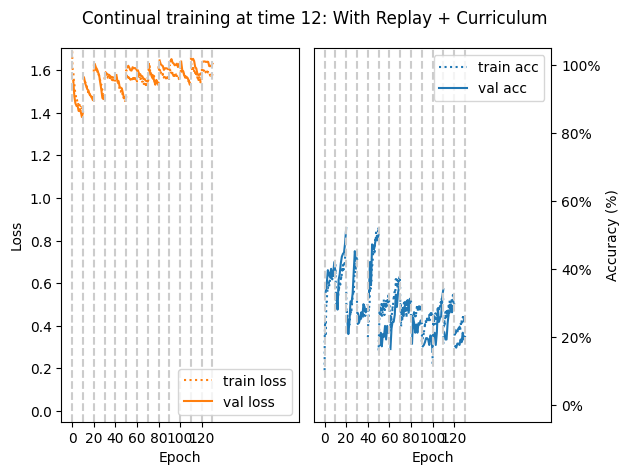

Replay+curriculum at t=12 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 23.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 32.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 46.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 24.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 53.60%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 27.20%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 32.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 36.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 31.20%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 20.00%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 33.60%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 24.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 19.20%

 +++ AVERAGE TASK TEST ACCURACY: 31.08% +++ 


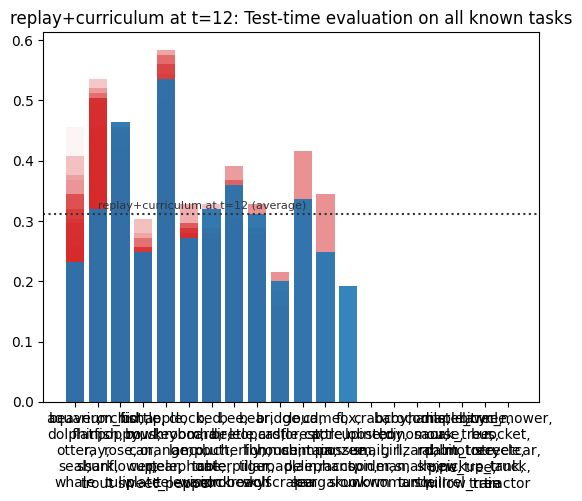

Training on task id: 13  (classification between: ['crab', 'lobster', 'snail', 'spider', 'worm'])


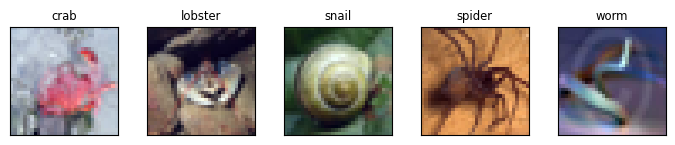

  Adding new task head 13 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.77, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.93it/s]


epoch:  0 | loss: 1.63 | 1.65   acc: 23.9% | 19.2%


E1 batch loss:1.72, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.23it/s]


epoch:  1 | loss: 1.62 | 1.64   acc: 24.4% | 20.8%


E2 batch loss:1.73, batch acc:20.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.35it/s]


epoch:  2 | loss: 1.62 | 1.62   acc: 24.1% | 25.6%


E3 batch loss:1.68, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.30it/s]


epoch:  3 | loss: 1.60 | 1.61   acc: 24.9% | 21.6%


E4 batch loss:1.69, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.85it/s]


epoch:  4 | loss: 1.60 | 1.61   acc: 25.1% | 22.4%


E5 batch loss:1.59, batch acc:23.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.61it/s]


epoch:  5 | loss: 1.59 | 1.60   acc: 24.6% | 22.8%


E6 batch loss:1.65, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.26it/s]


epoch:  6 | loss: 1.59 | 1.60   acc: 25.8% | 21.6%


E7 batch loss:1.61, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 11.91it/s]


epoch:  7 | loss: 1.58 | 1.57   acc: 26.4% | 26.4%


E8 batch loss:1.60, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.28it/s]


epoch:  8 | loss: 1.57 | 1.57   acc: 27.3% | 25.6%


E9 batch loss:1.54, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.62it/s]


epoch:  9 | loss: 1.55 | 1.57   acc: 27.5% | 25.2%


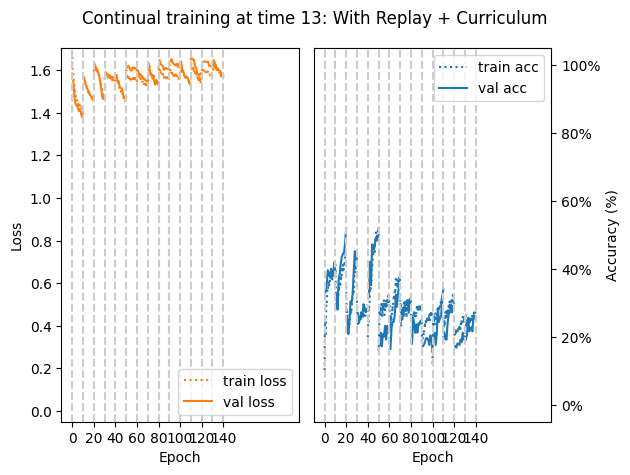

Replay+curriculum at t=13 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 24.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 36.00%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 44.80%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 55.20%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 27.20%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 40.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 32.00%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 20.00%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 48.00%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 33.60%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 14.40%
['crab', 'lobster', 'snail', 'spider', 'worm']: 29.60%

 +++ AVERAGE TASK TEST ACCURACY: 32.97% +++ 


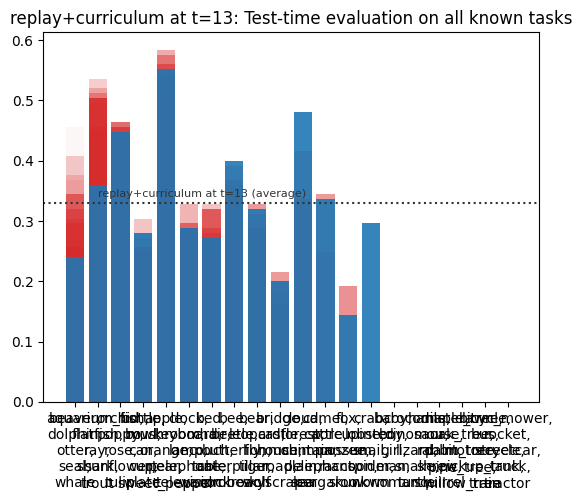

Training on task id: 14  (classification between: ['baby', 'boy', 'girl', 'man', 'woman'])


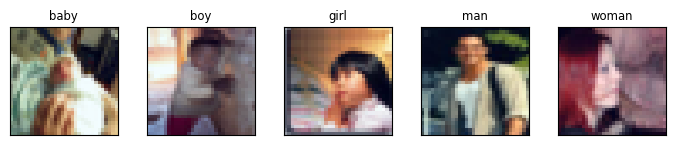

  Adding new task head 14 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.34it/s]


epoch:  0 | loss: 1.63 | 1.65   acc: 22.2% | 15.2%


E1 batch loss:1.58, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.24it/s]


epoch:  1 | loss: 1.62 | 1.64   acc: 22.0% | 16.4%


E2 batch loss:1.58, batch acc:20.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.51it/s]


epoch:  2 | loss: 1.61 | 1.64   acc: 21.5% | 17.2%


E3 batch loss:1.58, batch acc:25.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.05it/s]


epoch:  3 | loss: 1.61 | 1.64   acc: 22.5% | 18.4%


E4 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.44it/s]


epoch:  4 | loss: 1.61 | 1.64   acc: 24.0% | 18.0%


E5 batch loss:1.56, batch acc:21.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.52it/s]


epoch:  5 | loss: 1.60 | 1.64   acc: 23.6% | 16.8%


E6 batch loss:1.56, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.64it/s]


epoch:  6 | loss: 1.60 | 1.64   acc: 24.1% | 16.4%


E7 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.65it/s]


epoch:  7 | loss: 1.61 | 1.64   acc: 23.4% | 18.0%


E8 batch loss:1.57, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.95it/s]


epoch:  8 | loss: 1.61 | 1.64   acc: 24.5% | 18.4%


E9 batch loss:1.58, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.86it/s]


epoch:  9 | loss: 1.60 | 1.63   acc: 25.6% | 18.0%


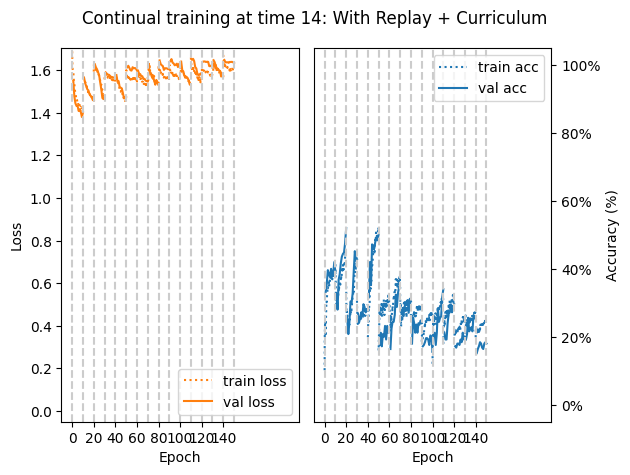

Replay+curriculum at t=14 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 17.60%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 36.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 44.00%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 58.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.00%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 26.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 42.40%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 31.20%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 23.20%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 48.00%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 31.20%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 18.40%
['crab', 'lobster', 'snail', 'spider', 'worm']: 28.00%
['baby', 'boy', 'girl', 'man', 'woman']: 25.60%

 +++ AVERAGE TASK TEST ACCURACY: 32.48% +++ 


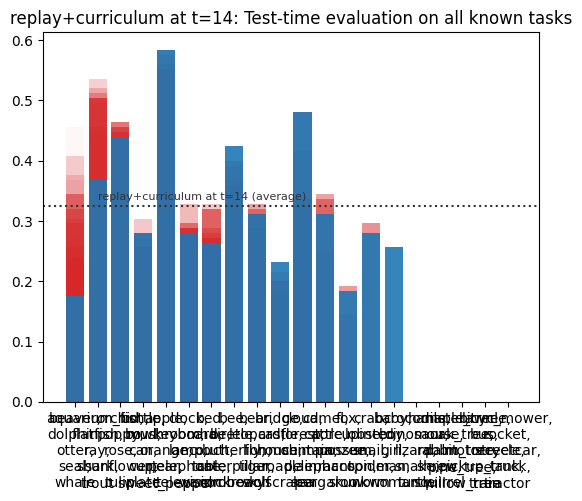

Training on task id: 15  (classification between: ['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle'])


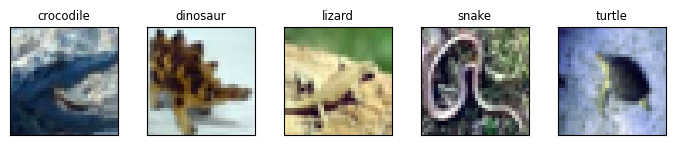

  Adding new task head 15 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.79, batch acc:12.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.34it/s]


epoch:  0 | loss: 1.62 | 1.63   acc: 23.2% | 23.2%


E1 batch loss:1.73, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.44it/s]


epoch:  1 | loss: 1.60 | 1.61   acc: 24.5% | 24.0%


E2 batch loss:1.72, batch acc:10.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.06it/s]


epoch:  2 | loss: 1.59 | 1.60   acc: 24.7% | 23.6%


E3 batch loss:1.70, batch acc:12.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.23it/s]


epoch:  3 | loss: 1.58 | 1.60   acc: 24.2% | 23.2%


E4 batch loss:1.71, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.14it/s]


epoch:  4 | loss: 1.58 | 1.60   acc: 26.0% | 23.2%


E5 batch loss:1.71, batch acc:14.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.70it/s]


epoch:  5 | loss: 1.57 | 1.60   acc: 26.7% | 23.2%


E6 batch loss:1.75, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.35it/s]


epoch:  6 | loss: 1.58 | 1.60   acc: 27.2% | 23.2%


E7 batch loss:1.76, batch acc: 7.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.99it/s]


epoch:  7 | loss: 1.58 | 1.60   acc: 28.0% | 22.8%


E8 batch loss:1.73, batch acc: 8.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.65it/s]


epoch:  8 | loss: 1.58 | 1.60   acc: 26.4% | 22.8%


E9 batch loss:1.76, batch acc:12.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.81it/s]


epoch:  9 | loss: 1.58 | 1.59   acc: 27.2% | 25.2%


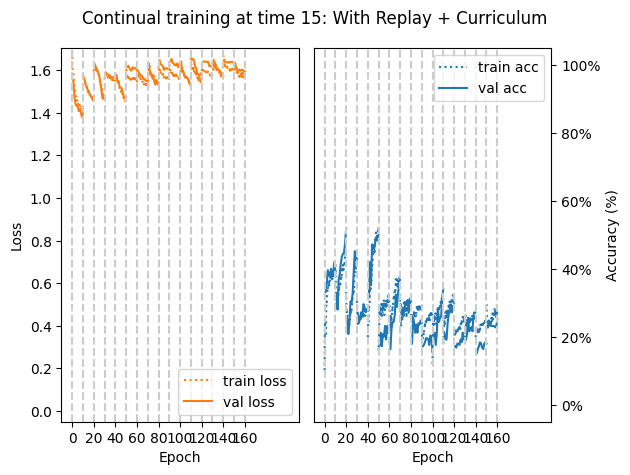

Replay+curriculum at t=15 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 38.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 40.00%
['bottle', 'bowl', 'can', 'cup', 'plate']: 28.00%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 56.00%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 31.20%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 22.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 39.20%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 37.60%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 22.40%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 47.20%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 39.20%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 22.40%
['crab', 'lobster', 'snail', 'spider', 'worm']: 32.80%
['baby', 'boy', 'girl', 'man', 'woman']: 24.00%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 22.40%

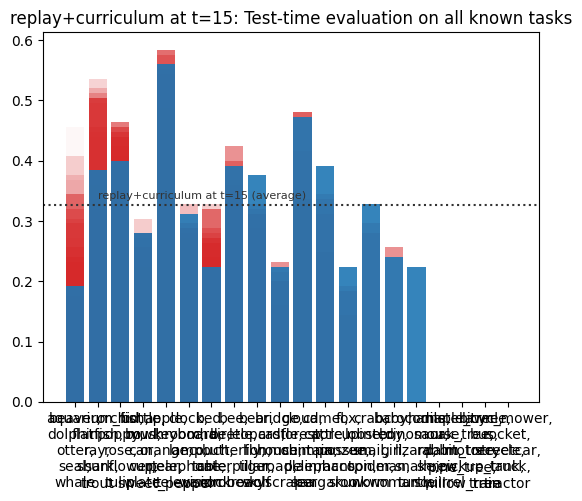

Training on task id: 16  (classification between: ['hamster', 'mouse', 'rabbit', 'shrew', 'squirrel'])


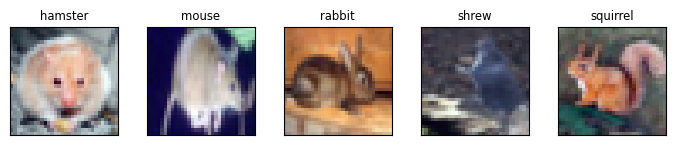

  Adding new task head 16 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.56, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.87it/s]


epoch:  0 | loss: 1.59 | 1.62   acc: 25.2% | 23.2%


E1 batch loss:1.58, batch acc:21.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.04it/s]


epoch:  1 | loss: 1.60 | 1.61   acc: 23.6% | 24.0%


E2 batch loss:1.55, batch acc:27.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.77it/s]


epoch:  2 | loss: 1.59 | 1.61   acc: 23.4% | 23.2%


E3 batch loss:1.57, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.14it/s]


epoch:  3 | loss: 1.58 | 1.62   acc: 24.3% | 22.8%


E4 batch loss:1.58, batch acc:30.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.43it/s]


epoch:  4 | loss: 1.59 | 1.61   acc: 25.5% | 24.4%


E5 batch loss:1.58, batch acc:29.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.00it/s]


epoch:  5 | loss: 1.57 | 1.61   acc: 27.8% | 22.8%


E6 batch loss:1.56, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.22it/s]


epoch:  6 | loss: 1.56 | 1.60   acc: 27.8% | 27.6%


E7 batch loss:1.54, batch acc:34.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.09it/s]


epoch:  7 | loss: 1.57 | 1.61   acc: 28.6% | 22.0%


E8 batch loss:1.52, batch acc:37.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.33it/s]


epoch:  8 | loss: 1.56 | 1.60   acc: 27.8% | 22.4%


E9 batch loss:1.53, batch acc:40.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.85it/s]


epoch:  9 | loss: 1.55 | 1.60   acc: 29.4% | 27.2%


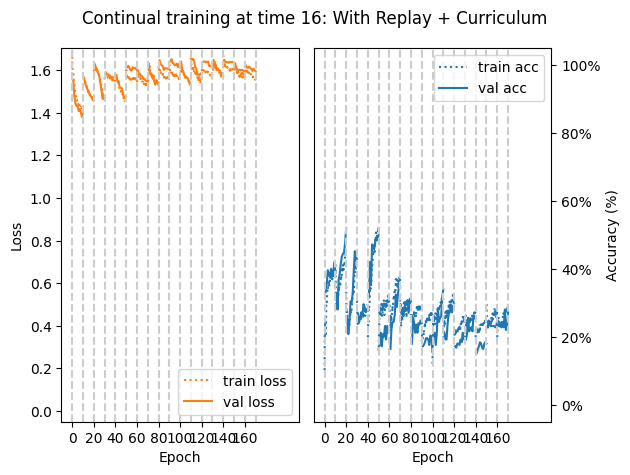

Replay+curriculum at t=16 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 16.00%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 30.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 33.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 25.60%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 51.20%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 28.80%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 27.20%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 41.60%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 38.40%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 26.40%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 51.20%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 36.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 20.80%
['crab', 'lobster', 'snail', 'spider', 'worm']: 35.20%
['baby', 'boy', 'girl', 'man', 'woman']: 28.00%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 22.40%

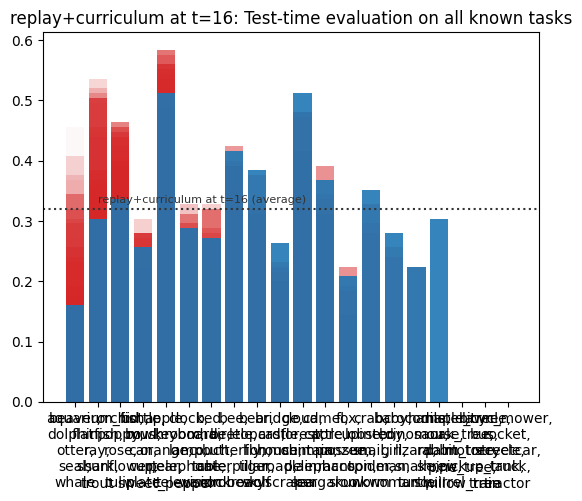

Training on task id: 17  (classification between: ['maple_tree', 'oak_tree', 'palm_tree', 'pine_tree', 'willow_tree'])


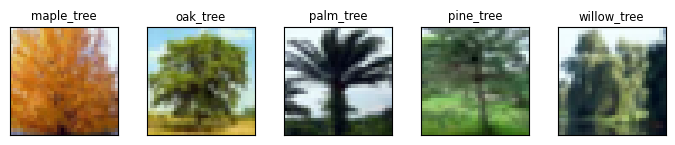

  Adding new task head 17 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.62, batch acc:26.1%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.42it/s]


epoch:  0 | loss: 1.61 | 1.63   acc: 27.1% | 19.6%


E1 batch loss:1.57, batch acc:33.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.64it/s]


epoch:  1 | loss: 1.60 | 1.62   acc: 26.5% | 21.2%


E2 batch loss:1.57, batch acc:32.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.95it/s]


epoch:  2 | loss: 1.59 | 1.62   acc: 26.3% | 23.2%


E3 batch loss:1.56, batch acc:33.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.56it/s]


epoch:  3 | loss: 1.59 | 1.61   acc: 27.7% | 23.6%


E4 batch loss:1.56, batch acc:35.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.73it/s]


epoch:  4 | loss: 1.58 | 1.61   acc: 28.7% | 22.8%


E5 batch loss:1.57, batch acc:33.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.63it/s]


epoch:  5 | loss: 1.58 | 1.61   acc: 27.9% | 26.8%


E6 batch loss:1.56, batch acc:28.3%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.66it/s]


epoch:  6 | loss: 1.58 | 1.60   acc: 26.7% | 22.8%


E7 batch loss:1.58, batch acc:30.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.73it/s]


epoch:  7 | loss: 1.58 | 1.61   acc: 27.9% | 26.0%


E8 batch loss:1.58, batch acc:30.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 12.09it/s]


epoch:  8 | loss: 1.58 | 1.61   acc: 27.1% | 23.2%


E9 batch loss:1.57, batch acc:31.5%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.30it/s]


epoch:  9 | loss: 1.58 | 1.61   acc: 27.2% | 22.0%


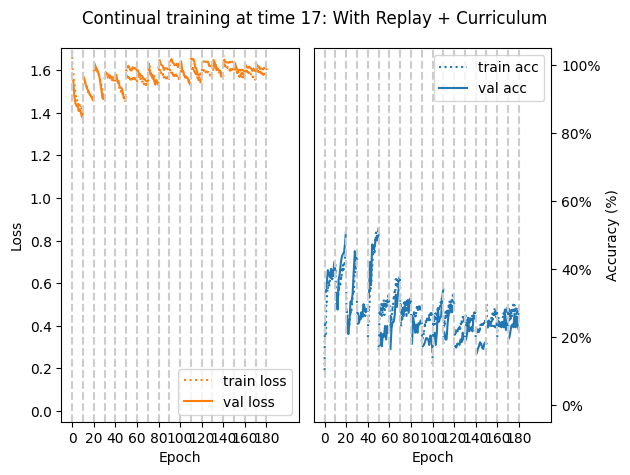

Replay+curriculum at t=17 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 28.80%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 29.60%
['bottle', 'bowl', 'can', 'cup', 'plate']: 24.80%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 54.40%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 26.40%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 20.00%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 44.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 35.20%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 24.00%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 48.80%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 36.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 17.60%
['crab', 'lobster', 'snail', 'spider', 'worm']: 35.20%
['baby', 'boy', 'girl', 'man', 'woman']: 22.40%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 29.60%

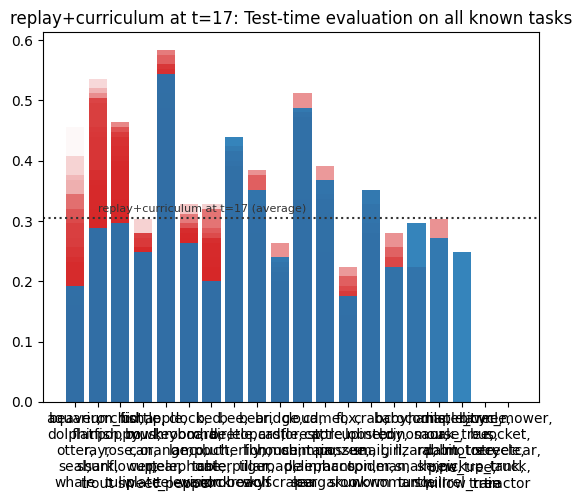

Training on task id: 18  (classification between: ['bicycle', 'bus', 'motorcycle', 'pickup_truck', 'train'])


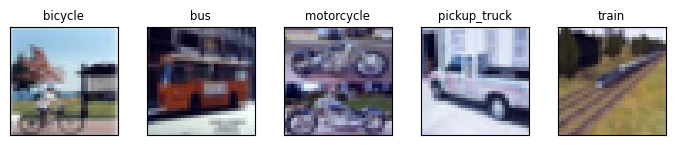

  Adding new task head 18 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.75, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.56it/s]


epoch:  0 | loss: 1.68 | 1.71   acc: 18.4% | 16.8%


E1 batch loss:1.74, batch acc:10.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.96it/s]


epoch:  1 | loss: 1.66 | 1.70   acc: 19.5% | 18.8%


E2 batch loss:1.70, batch acc:13.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.73it/s]


epoch:  2 | loss: 1.65 | 1.68   acc: 19.7% | 19.6%


E3 batch loss:1.66, batch acc:15.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.76it/s]


epoch:  3 | loss: 1.63 | 1.68   acc: 20.2% | 17.6%


E4 batch loss:1.68, batch acc:15.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.79it/s]


epoch:  4 | loss: 1.64 | 1.67   acc: 19.0% | 18.4%


E5 batch loss:1.66, batch acc:17.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.95it/s]


epoch:  5 | loss: 1.62 | 1.66   acc: 22.5% | 21.2%


E6 batch loss:1.61, batch acc:19.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.90it/s]


epoch:  6 | loss: 1.62 | 1.67   acc: 22.4% | 18.8%


E7 batch loss:1.59, batch acc:22.8%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.78it/s]


epoch:  7 | loss: 1.62 | 1.66   acc: 22.1% | 20.0%


E8 batch loss:1.61, batch acc:20.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.63it/s]


epoch:  8 | loss: 1.61 | 1.66   acc: 23.1% | 20.8%


E9 batch loss:1.61, batch acc:17.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.76it/s]


epoch:  9 | loss: 1.61 | 1.66   acc: 23.1% | 21.6%


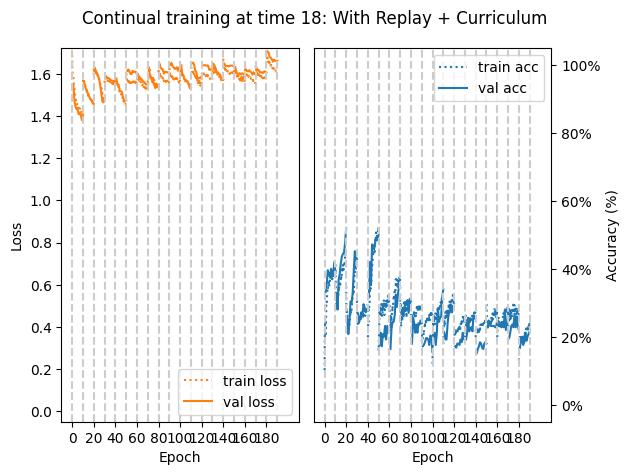

Replay+curriculum at t=18 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 19.20%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 29.60%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 34.40%
['bottle', 'bowl', 'can', 'cup', 'plate']: 27.20%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 47.20%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 26.40%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 26.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 36.00%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 38.40%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 29.60%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 50.40%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 36.80%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 23.20%
['crab', 'lobster', 'snail', 'spider', 'worm']: 43.20%
['baby', 'boy', 'girl', 'man', 'woman']: 27.20%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 31.20%

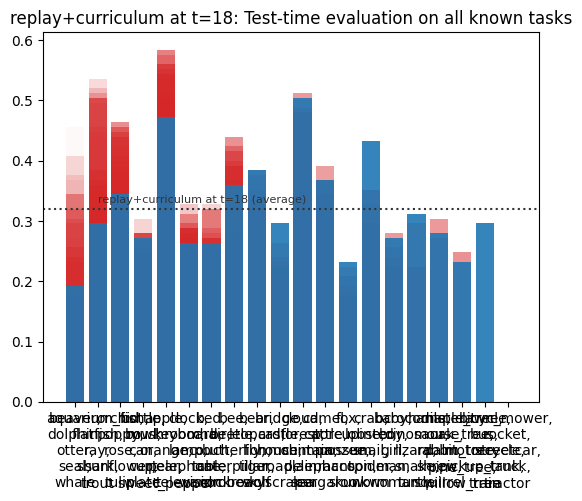

Training on task id: 19  (classification between: ['lawn_mower', 'rocket', 'streetcar', 'tank', 'tractor'])


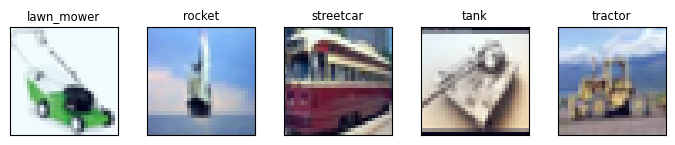

  Adding new task head 19 to multi-task model
Usando curriculum learning con estrategia: descending
Iniciando CurriculumDataLoader...
Dataset: cifar100, Estrategia: descending
Scorer initialized for cifar100
  - Color mode: rgb
  - Use color HOG: True
  - Device: cuda
Computing features for 2125 imágenes...
Computing class's centroids...
Computing KNN purity...
Curriculum creado: 2125 imágenes


E0 batch loss:1.40, batch acc:42.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.65it/s]


epoch:  0 | loss: 1.60 | 1.62   acc: 22.2% | 23.6%


E1 batch loss:1.36, batch acc:55.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.75it/s]


epoch:  1 | loss: 1.58 | 1.60   acc: 27.2% | 30.0%


E2 batch loss:1.35, batch acc:57.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.79it/s]


epoch:  2 | loss: 1.56 | 1.58   acc: 29.5% | 29.6%


E3 batch loss:1.35, batch acc:55.4%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.72it/s]


epoch:  3 | loss: 1.56 | 1.57   acc: 28.6% | 27.6%


E4 batch loss:1.29, batch acc:73.9%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.79it/s]


epoch:  4 | loss: 1.54 | 1.57   acc: 34.0% | 30.0%


E5 batch loss:1.31, batch acc:63.0%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.83it/s]


epoch:  5 | loss: 1.53 | 1.55   acc: 33.2% | 32.8%


E6 batch loss:1.28, batch acc:69.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 14.09it/s]


epoch:  6 | loss: 1.52 | 1.54   acc: 34.5% | 36.0%


E7 batch loss:1.28, batch acc:69.6%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.96it/s]


epoch:  7 | loss: 1.52 | 1.54   acc: 35.1% | 36.0%


E8 batch loss:1.29, batch acc:65.2%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.96it/s]


epoch:  8 | loss: 1.52 | 1.53   acc: 34.2% | 37.6%


E9 batch loss:1.28, batch acc:71.7%: 100%|████████████████████████████| 9/9 [00:00<00:00, 13.81it/s]


epoch:  9 | loss: 1.51 | 1.52   acc: 35.5% | 37.6%


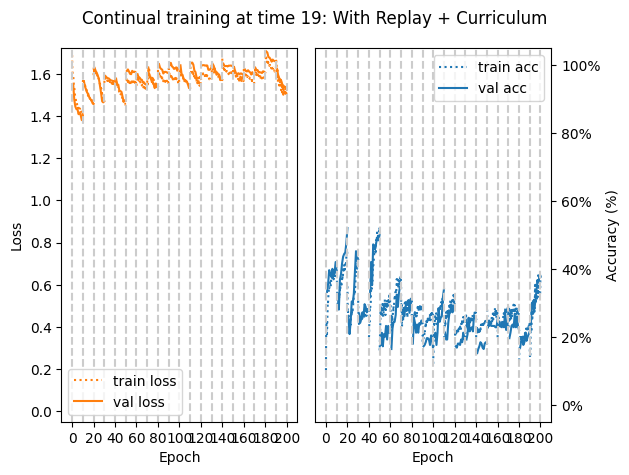

Replay+curriculum at t=19 evaluation on test set of all tasks:
['beaver', 'dolphin', 'otter', 'seal', 'whale']: 18.40%
['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout']: 26.40%
['orchid', 'poppy', 'rose', 'sunflower', 'tulip']: 28.80%
['bottle', 'bowl', 'can', 'cup', 'plate']: 26.40%
['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper']: 47.20%
['clock', 'keyboard', 'lamp', 'telephone', 'television']: 26.40%
['bed', 'chair', 'couch', 'table', 'wardrobe']: 26.40%
['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach']: 38.40%
['bear', 'leopard', 'lion', 'tiger', 'wolf']: 32.80%
['bridge', 'castle', 'house', 'road', 'skyscraper']: 28.80%
['cloud', 'forest', 'mountain', 'plain', 'sea']: 50.40%
['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']: 33.60%
['fox', 'porcupine', 'possum', 'raccoon', 'skunk']: 27.20%
['crab', 'lobster', 'snail', 'spider', 'worm']: 40.00%
['baby', 'boy', 'girl', 'man', 'woman']: 25.60%
['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']: 33.60%

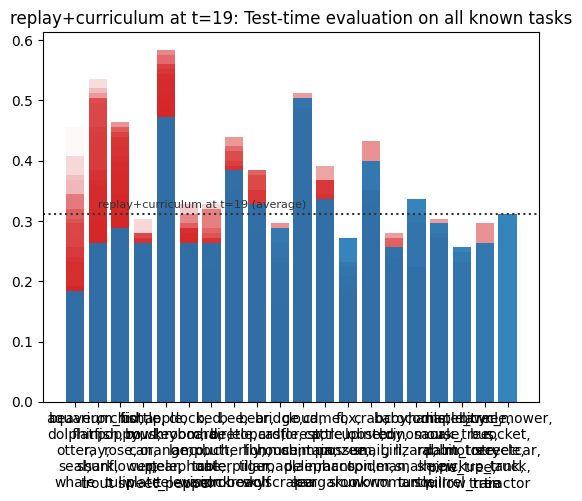

(MultitaskModel(
   (backbone): Conv4Backbone(
     (conv_stack): Sequential(
       (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (1): GroupNorm(8, 32, eps=1e-05, affine=True)
       (2): ReLU()
       (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (4): GroupNorm(16, 64, eps=1e-05, affine=True)
       (5): ReLU()
       (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (7): GroupNorm(16, 64, eps=1e-05, affine=True)
       (8): ReLU()
       (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
       (10): GroupNorm(32, 128, eps=1e-05, affine=True)
       (11): ReLU()
     )
     (pool): AdaptiveAvgPool2d(output_size=(1, 1))
     (relu): ReLU()
   )
   (task_heads): ModuleDict(
     (0): TaskHead(
       (projection): Linear(in_features=128, out_features=64, bias=True)
       (classifier): Linear(in_features=64, out_features=5, bias=True)
       (dropout): Identity()
       (relu): ReLU

In [19]:
INPUT_SIZE = (3,32,32)  # for cifar
replay_model_training(timestep_tasks, task_test_sets, INPUT_SIZE, BATCH_SIZE, dataset_name='cifar100', curriculum_strategy="descending")

----------------------------------------------------------------------------------------------

In [20]:
# we can verify that drawing a sample from this data produces a (image, label, task_id) triplet:

example = task_train[0]
image, label, task_id = example

print(f'\n image: {type(image)}  of shape {image.shape}')

print(f'\n label: {label}   (class: {task_train.classes[label]})')

print(f'\n task id: {task_id}   (classification between: {timestep_task_classes[int(task_id)]})')



 image: <class 'torch.Tensor'>  of shape torch.Size([3, 32, 32])

 label: 3   (class: tank)

 task id: 19   (classification between: ['lawn_mower', 'rocket', 'streetcar', 'tank', 'tractor'])
